### **Eliot PARTOUCHE - Individual Assignement**



# ***Task 1***

In [ ]:
from google.colab import drive

In [ ]:
import pandas as pd
import numpy as np

# Load the S&P 500 table from Wikipedia
url = 'https://en.wikipedia.org/wiki/List_of_S%26P_500_companies'
tables = pd.read_html(url)
sp500_table = tables[0]

# Mandatory tickers
mandatory_tickers = ['AAPL', 'TSLA', 'GOOGL', 'LLY', 'UNH', 'MRK', 'EA', 'PARA', 'NWS']

# Number of companies to select
total_tickers = 40
n_sectors = len(sp500_table['GICS Sector'].unique())

# Calculate approximate tickers per sector
tickers_per_sector = total_tickers // n_sectors
remaining_tickers = total_tickers % n_sectors

# Initialize selected tickers list with mandatory tickers
selected_tickers = mandatory_tickers[:]

# Function to select tickers from each sector
def select_tickers_from_sector(sector_group, n_select, excluded_tickers):
    tickers = [ticker for ticker in sector_group['Symbol'].dropna().tolist() if ticker not in excluded_tickers]
    if len(tickers) <= n_select:
        return tickers  # If fewer tickers are available, take all
    return np.random.choice(tickers, n_select, replace=False).tolist()

# Group table by sector and select tickers
excluded_tickers = set(selected_tickers)
grouped = sp500_table.groupby('GICS Sector')
for name, group in grouped:
    sector_tickers = select_tickers_from_sector(group, tickers_per_sector, excluded_tickers)
    selected_tickers.extend(sector_tickers)
    excluded_tickers.update(sector_tickers)

# Add remaining tickers randomly from any sector
if remaining_tickers > 0:
    all_tickers = sp500_table['Symbol'].dropna().tolist()
    remaining_selection = np.random.choice(
        [ticker for ticker in all_tickers if ticker not in selected_tickers],
        remaining_tickers,
        replace=False
    ).tolist()
    selected_tickers.extend(remaining_selection)

# Ensure exactly 40 tickers
selected_tickers = selected_tickers[:total_tickers]

# Display the result
print("Selected 40 tickers:", selected_tickers)



Selected 40 tickers: ['AAPL', 'TSLA', 'GOOGL', 'LLY', 'UNH', 'MRK', 'EA', 'PARA', 'NWS', 'LYV', 'WBD', 'NFLX', 'POOL', 'RL', 'APTV', 'MNST', 'K', 'CAG', 'WMB', 'HAL', 'EQT', 'STT', 'HIG', 'RF', 'WAT', 'LH', 'ABT', 'PCAR', 'AMTM', 'UPS', 'SNPS', 'CSCO', 'TXN', 'LIN', 'CTVA', 'IP', 'ARE', 'EQIX', 'EQR', 'CMS']


Quarterly stock data for the selected companies:
              AAPL    TSLA   GOOGL     LLY     UNH     MRK      EA   PARA    NWS     LYV    WBD    NFLX    POOL      RL    APTV   MNST      K    CAG    WMB    HAL    EQT    STT     HIG     RF     WAT      LH     ABT    PCAR     UPS    SNPS   CSCO     TXN     LIN   CTVA     IP     ARE    EQIX    EQR    CMS     Average
Date                                                                                                                                                                                                                                                                                                                          
1980-12-31    0.10     NaN     NaN    0.97     NaN    0.52     NaN    NaN    NaN     NaN    NaN     NaN     NaN     NaN     NaN    NaN   0.70   0.31    NaN   6.80   0.56   0.17     NaN   0.63     NaN     NaN    0.27    0.30     NaN     NaN    NaN    1.32     NaN    NaN   2.17     NaN     NaN    NaN   5.76    1.4

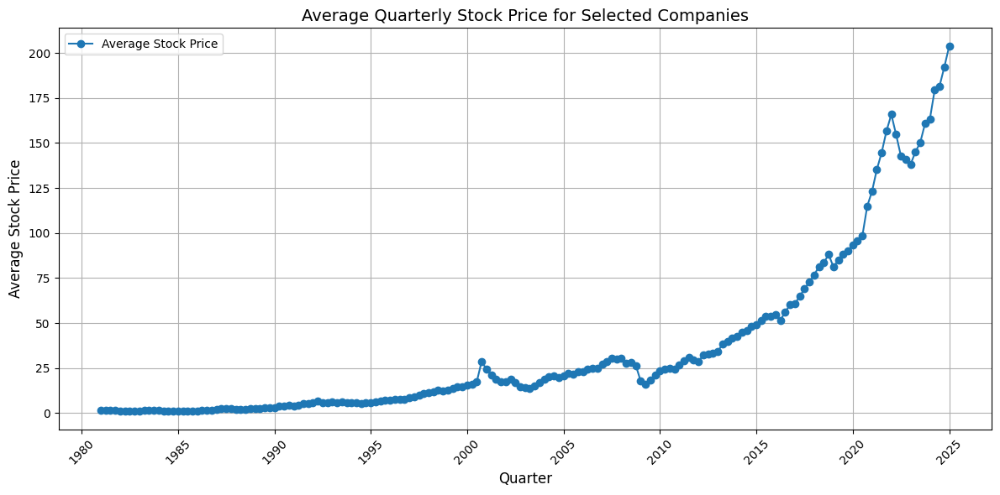

In [ ]:
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
import warnings
import os

# Suppress warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# List of selected tickers
selected_tickers = [
    'AAPL', 'TSLA', 'GOOGL', 'LLY', 'UNH', 'MRK', 'EA', 'PARA', 'NWS', 'LYV',
    'WBD', 'NFLX', 'POOL', 'RL', 'APTV', 'MNST', 'K', 'CAG', 'WMB', 'HAL',
    'EQT', 'STT', 'HIG', 'RF', 'WAT', 'LH', 'ABT', 'PCAR', 'UPS', 'SNPS',
    'CSCO', 'TXN', 'LIN', 'CTVA', 'IP', 'ARE', 'EQIX', 'EQR', 'CMS'
]

# Configure Pandas to display all rows and columns
pd.set_option('display.max_rows', None)  # Display all rows
pd.set_option('display.max_columns', None)  # Display all columns
pd.set_option('display.width', 1000)  # Extend display width

# Directory for exporting data
export_dir = './finance_export'
os.makedirs(export_dir, exist_ok=True)

# Initialize the DataFrame for stock data
stock_data = pd.DataFrame()

# Fetch historical stock data for each selected company
for ticker in selected_tickers:
    stock = yf.Ticker(ticker)
    hist_data = stock.history(period="max")  # Retrieve all available data
    hist_data.index = pd.to_datetime(hist_data.index)  # Ensure the index is DatetimeIndex
    quarterly_data = hist_data['Close'].resample('Q').mean()  # Resample to quarterly data
    stock_data[ticker] = quarterly_data  # Add the quarterly data column

# Format the data
stock_data.index.name = "Date"  # Name the index
stock_data.index = stock_data.index.tz_localize(None)  # Remove timezone info
stock_data = stock_data.round(2)  # Round to two decimal places

# Calculate average values across all companies for each quarter
stock_data['Average'] = stock_data.mean(axis=1)

# Export the quarterly data to an Excel file
raw_data_path = f'{export_dir}/quarterly_stock_data_selected.xlsx'
stock_data.to_excel(raw_data_path, sheet_name="Quarterly Data")

# Display the quarterly data in the console
print("Quarterly stock data for the selected companies:")
print(stock_data)

# Plot the average stock price for all companies over time
plt.figure(figsize=(12, 6))
plt.plot(stock_data.index, stock_data['Average'], marker='o', label='Average Stock Price')
plt.title('Average Quarterly Stock Price for Selected Companies', fontsize=14)
plt.xlabel('Quarter', fontsize=12)
plt.ylabel('Average Stock Price', fontsize=12)
plt.grid(True)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



# ***Task 2***

*1- Inspect the data for missing values, outliers, or anomalies.*
##*1- Inspect the data for missing values, outliers, or anomalies.*



In [ ]:
# **1. Inspect and Handle Missing Values, Outliers, and Anomalies**

# Check for missing values
missing_values = stock_data.isnull().sum()

if missing_values.sum() == 0:
    print("After analysis, no missing values were found.")
else:
    print("Missing values per stock:\n", missing_values)

    # Handle missing values (forward-fill and backward-fill)
    stock_data = stock_data.ffill().bfill()

    # Verify if all missing values are handled
    missing_values_after = stock_data.isnull().sum()
    if missing_values_after.sum() == 0:
        print("Missing values have been handled (filled).")
    else:
        print("Some missing values still remain:\n", missing_values_after)


After analysis, no missing values were found.


*2- Verify the integrity of the data by checking for duplicate entries, inconsistent time frames, or any other data integrity issues.*

---



In [ ]:
# Check for duplicate entries
duplicates = stock_data.duplicated().sum()

if duplicates > 0:
    print(f"Found {duplicates} duplicate rows. Removing them...")
    stock_data = stock_data.drop_duplicates()
else:
    print("No duplicate rows found. Data integrity verified.")

# Ensure consistent time frames
start_date = stock_data.index.min()
end_date = stock_data.index.max()
print(f"Data integrity check complete. Analysis starts from {start_date} and ends at {end_date}.")


No duplicate rows found. Data integrity verified.
Data integrity check complete. Analysis starts from 1980-12-31 00:00:00 and ends at 2024-12-31 00:00:00.


*3- Calculate monthly and annual returns for each stock*


---



*Step 1: Calculate Monthly Returns*

In [ ]:
import numpy as np
import pandas as pd
import yfinance as yf
from IPython.display import display

# Step 1: Define the selected tickers
selected_tickers = [
    'AAPL', 'TSLA', 'GOOGL', 'LLY', 'UNH', 'MRK', 'EA', 'PARA', 'NWS', 'LYV',
    'WBD', 'NFLX', 'POOL', 'RL', 'APTV', 'MNST', 'K', 'CAG', 'WMB', 'HAL',
    'EQT', 'STT', 'HIG', 'RF', 'WAT', 'LH', 'ABT', 'PCAR', 'UPS', 'SNPS',
    'CSCO', 'TXN', 'LIN', 'CTVA', 'IP', 'ARE', 'EQIX', 'EQR', 'CMS'
]

# Step 2: Download historical stock prices
start_date = "2020-01-01"  # Adjust the start date as needed
end_date = "2024-11-30"    # Adjust the end date as needed
data = yf.download(selected_tickers, start=start_date, end=end_date, interval="1d")["Adj Close"]

# Step 3: Resample the data to monthly frequency and calculate returns
monthly_prices = data.resample('ME').last()  # Use 'ME' for Month End
monthly_returns = monthly_prices.pct_change().dropna()  # Calculate monthly returns

# Step 4: Style the table with colors for positive and negative returns
def highlight_positive_negative(val):
    """
    Apply color formatting: green for positive, red for negative.
    """
    color = 'green' if val > 0 else 'red'
    return f'color: {color}'

# Step 5: Display the styled table
styled_table = (
    monthly_returns.style
    .applymap(highlight_positive_negative)
    .format("{:.2%}")  # Format values as percentages with 2 decimal places
)

# Display table
print("Monthly Returns (Styled Table):")
display(styled_table)


[*********************100%***********************]  39 of 39 completed
<ipython-input-47-cd158780e53c>:34: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  .applymap(highlight_positive_negative)


Monthly Returns (Styled Table):


Ticker,AAPL,ABT,APTV,ARE,CAG,CMS,CSCO,CTVA,EA,EQIX,EQR,EQT,GOOGL,HAL,HIG,IP,K,LH,LIN,LLY,LYV,MNST,MRK,NFLX,NWS,PARA,PCAR,POOL,RF,RL,SNPS,STT,TSLA,TXN,UNH,UPS,WAT,WBD,WMB
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-02-29 00:00:00+00:00,-11.47%,-11.60%,-7.64%,-6.94%,-18.92%,-11.28%,-13.14%,-5.95%,-6.07%,-2.47%,-9.61%,-2.42%,-6.53%,-22.24%,-15.21%,-8.13%,-11.35%,0.17%,-5.97%,-9.21%,-10.84%,-6.29%,-10.39%,6.94%,-10.95%,-27.89%,-9.47%,-3.80%,-13.17%,-7.04%,-6.49%,-9.94%,2.68%,-5.40%,-6.42%,-11.72%,-12.91%,-12.17%,-7.93%
2020-03-31 00:00:00+00:00,-6.98%,2.44%,-36.96%,-9.11%,9.93%,-2.76%,-1.55%,-13.19%,-1.18%,9.04%,-17.00%,20.44%,-13.24%,-59.18%,-29.45%,-15.77%,0.15%,-28.06%,-9.00%,9.98%,-25.19%,-9.85%,1.33%,1.75%,-27.04%,-42.21%,-8.62%,-6.49%,-32.94%,-36.04%,-6.63%,-20.99%,-21.56%,-12.45%,-1.76%,3.24%,-6.59%,-24.36%,-23.82%
2020-04-30 00:00:00+00:00,15.54%,17.19%,41.25%,14.61%,14.68%,-2.83%,8.83%,11.45%,14.07%,8.11%,5.43%,106.36%,15.90%,53.28%,7.80%,10.02%,9.18%,30.11%,6.35%,11.48%,-1.30%,9.86%,3.12%,11.81%,13.68%,23.20%,13.25%,7.57%,19.84%,10.40%,22.00%,18.34%,49.21%,16.15%,17.28%,1.33%,2.72%,15.33%,36.89%
2020-05-31 00:00:00+00:00,8.51%,3.07%,8.34%,-2.15%,4.04%,3.38%,12.84%,4.86%,7.54%,3.74%,-6.92%,-8.57%,6.45%,11.90%,1.63%,1.00%,0.59%,6.61%,9.97%,-0.63%,9.56%,16.34%,1.74%,-0.03%,19.96%,20.16%,7.18%,27.44%,5.21%,2.34%,15.14%,-3.30%,6.79%,3.10%,4.23%,6.44%,6.87%,-2.99%,5.47%
2020-06-30 00:00:00+00:00,14.74%,-3.68%,3.41%,6.24%,1.09%,-0.27%,-2.47%,-1.90%,7.46%,0.67%,-1.92%,-10.79%,-1.08%,10.88%,0.68%,3.41%,1.15%,-5.25%,5.32%,7.34%,-9.83%,-3.60%,-3.44%,8.41%,-2.53%,13.60%,1.34%,1.06%,-0.43%,-3.96%,7.79%,5.14%,29.32%,6.93%,-2.83%,11.50%,-9.73%,-2.99%,-5.02%
2020-07-31 00:00:00+00:00,16.51%,10.50%,-0.22%,9.43%,6.48%,9.86%,1.78%,6.61%,7.25%,11.84%,-8.82%,22.02%,4.93%,10.40%,9.78%,-1.19%,4.44%,16.14%,15.56%,-8.46%,5.59%,13.21%,3.76%,7.44%,6.78%,11.79%,13.67%,16.49%,-2.34%,-1.68%,2.16%,0.38%,32.50%,1.15%,2.65%,28.40%,18.15%,0.00%,0.58%
2020-08-31 00:00:00+00:00,21.66%,8.77%,10.77%,-5.16%,3.02%,-5.13%,-10.36%,0.46%,-1.52%,0.90%,5.26%,9.30%,9.52%,12.91%,-3.66%,5.73%,3.62%,-8.90%,1.89%,-0.78%,21.34%,6.86%,6.27%,8.32%,18.10%,6.83%,1.26%,3.71%,6.45%,-3.46%,11.08%,6.74%,74.15%,11.45%,3.23%,15.34%,1.46%,4.60%,8.52%
2020-09-30 00:00:00+00:00,-10.25%,-0.58%,6.46%,-4.35%,-6.91%,1.52%,-6.70%,0.91%,-6.50%,-3.75%,-7.99%,-18.53%,-10.06%,-25.32%,-8.88%,11.77%,-8.91%,7.12%,-4.29%,-0.25%,-5.14%,-4.36%,-2.01%,-5.58%,-6.62%,1.41%,-0.65%,2.04%,1.07%,-1.25%,-3.31%,-12.10%,-13.91%,0.45%,0.16%,1.84%,-9.52%,-1.36%,-3.51%
2020-10-31 00:00:00+00:00,-6.00%,-3.10%,5.25%,-5.30%,-0.97%,3.13%,-8.02%,14.47%,-8.11%,-3.80%,-8.47%,17.09%,10.27%,0.08%,4.50%,7.92%,-2.63%,6.11%,-7.47%,-11.86%,-9.43%,-4.53%,-9.33%,-4.86%,-6.87%,2.00%,0.12%,4.57%,15.35%,-1.65%,-0.06%,-0.72%,-9.55%,1.99%,-2.13%,-5.71%,13.87%,-7.03%,-2.34%


In [ ]:
from IPython.display import HTML

# Step 1: Calculate Monthly Returns
# Transpose stock_data
transposed_stock_data = stock_data.transpose()
transposed_stock_data.index.name = "Company"
transposed_stock_data = transposed_stock_data.round(2)  # Round for readability

# Render the DataFrame with logos (in Jupyter Notebook or similar environments)
HTML(transposed_stock_data.to_html(escape=False))


*Step 2: Annual Returns Analysis*

In [ ]:
import pandas as pd
import yfinance as yf
from IPython.core.display import HTML

# Step 1: Define the selected tickers
selected_tickers = [
    'AAPL', 'TSLA', 'GOOGL', 'LLY', 'UNH', 'MRK', 'EA', 'PARA', 'NWS', 'LYV',
    'WBD', 'NFLX', 'POOL', 'RL', 'APTV', 'MNST', 'K', 'CAG', 'WMB', 'HAL',
    'EQT', 'STT', 'HIG', 'RF', 'WAT', 'LH', 'ABT', 'PCAR', 'UPS', 'SNPS',
    'CSCO', 'TXN', 'LIN', 'CTVA', 'IP', 'ARE', 'EQIX', 'EQR', 'CMS'
]

# Step 2: Download historical stock prices
start_date = "2018-01-01"  # Start date
end_date = "2024-11-30"    # End date
stock_data = yf.download(selected_tickers, start=start_date, end=end_date, interval="1d")["Adj Close"]

# Step 3: Calculate Annual Returns
annual_data = stock_data.resample('Y').last()  # Use last value of each year
annual_returns = annual_data.pct_change().dropna()  # Calculate percentage change
annual_returns_cleaned = annual_returns.round(4)  # Round values for clarity

# Format index (dates as Year) and clean the table for presentation
annual_returns_cleaned.index = annual_returns_cleaned.index.strftime('%Y')  # Format index as Year
annual_returns_cleaned.index.name = "Year"  # Name the index as "Year"
annual_returns_cleaned.columns.name = "Company"  # Name the columns as "Company"

# Step 4: Render the Table with Green for Positive and Red for Negative Values
def color_returns(val):
    """
    Apply color formatting: green for positive, red for negative.
    """
    color = 'green' if val > 0 else 'red'
    return f'color: {color}'

styled_table = (
    annual_returns_cleaned.style
    .set_table_attributes("style='display:inline'")  # Inline styling for better formatting
    .set_caption("Annual Returns for Selected Companies")  # Table caption
    .applymap(color_returns)  # Apply color formatting
    .format("{:.2%}")  # Format values as percentages
)

# Display the styled table
HTML(styled_table.to_html())


[*********************100%***********************]  39 of 39 completed
<ipython-input-52-11c4d5573425>:19: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_data = stock_data.resample('Y').last()  # Use last value of each year
<ipython-input-52-11c4d5573425>:40: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  .applymap(color_returns)  # Apply color formatting


Company,AAPL,ABT,APTV,ARE,CAG,CMS,CSCO,CTVA,EA,EQIX,EQR,EQT,GOOGL,HAL,HIG,IP,K,LH,LIN,LLY,LYV,MNST,MRK,NFLX,NWS,PARA,PCAR,POOL,RF,RL,SNPS,STT,TSLA,TXN,UNH,UPS,WAT,WBD,WMB
Year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020,82.31%,28.04%,37.54%,13.27%,8.70%,-0.31%,-3.49%,33.49%,33.75%,24.22%,-23.61%,17.27%,30.85%,-21.23%,-16.98%,13.84%,-6.78%,20.32%,25.88%,31.04%,2.81%,45.52%,-7.20%,67.11%,24.46%,-7.58%,11.74%,76.95%,-1.61%,-10.63%,86.24%,-4.76%,743.44%,31.70%,21.25%,48.64%,5.89%,-8.09%,-8.20%
2021,34.65%,30.53%,26.60%,28.09%,-2.55%,9.71%,45.76%,23.55%,-7.69%,20.28%,57.34%,71.60%,65.30%,21.99%,44.23%,3.49%,7.44%,54.37%,33.39%,66.08%,62.89%,3.85%,1.75%,11.41%,27.73%,-17.17%,5.63%,52.98%,39.39%,16.66%,42.15%,31.03%,49.76%,17.53%,45.20%,30.02%,50.59%,-21.77%,38.36%
2022,-26.40%,-20.68%,-43.54%,-32.62%,17.52%,0.18%,-22.46%,25.58%,-6.84%,-21.13%,-32.46%,57.64%,-39.09%,74.45%,12.31%,-23.04%,14.35%,-24.41%,-4.39%,34.26%,-41.73%,5.72%,49.42%,-51.05%,-17.20%,-41.80%,17.00%,-46.03%,2.33%,-8.41%,-13.35%,-13.75%,-65.03%,-9.86%,6.94%,-16.21%,-8.06%,-59.73%,32.83%
2023,49.01%,2.26%,-3.66%,-9.11%,-22.82%,-5.21%,9.30%,-17.51%,12.67%,25.41%,8.34%,16.20%,58.32%,-6.47%,8.55%,10.21%,-13.15%,13.82%,27.66%,60.91%,34.21%,13.48%,1.01%,65.11%,41.02%,-10.43%,55.01%,33.51%,-5.69%,39.82%,61.27%,3.54%,101.72%,6.41%,0.80%,-5.96%,-3.90%,20.04%,11.86%
2024,23.87%,10.06%,-38.11%,-10.19%,0.73%,24.05%,21.02%,31.03%,20.26%,24.34%,29.06%,19.65%,21.25%,-10.48%,55.50%,69.78%,49.29%,7.50%,13.27%,37.33%,47.70%,-4.30%,-4.99%,82.14%,25.68%,-25.61%,21.16%,-4.21%,45.85%,62.57%,8.46%,30.66%,38.91%,21.29%,17.27%,-9.52%,16.85%,-7.91%,74.04%


[*********************100%***********************]  39 of 39 completed


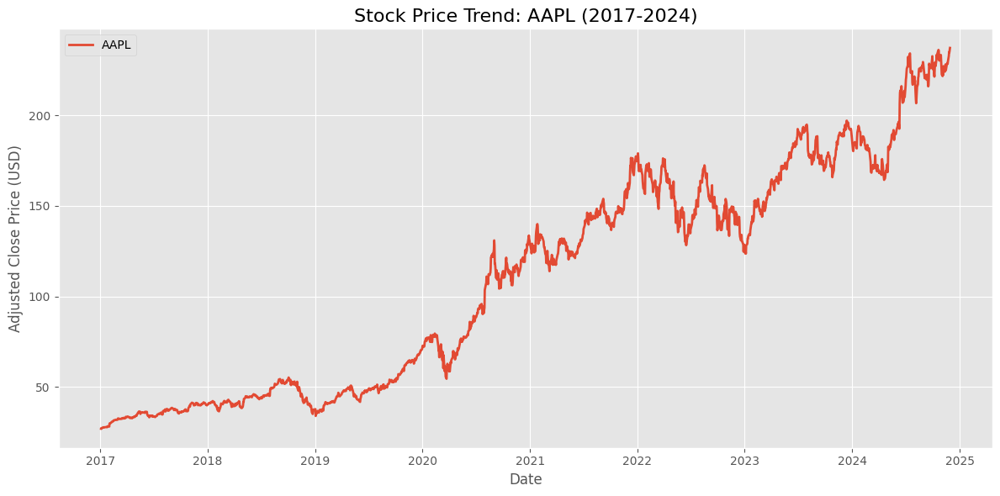

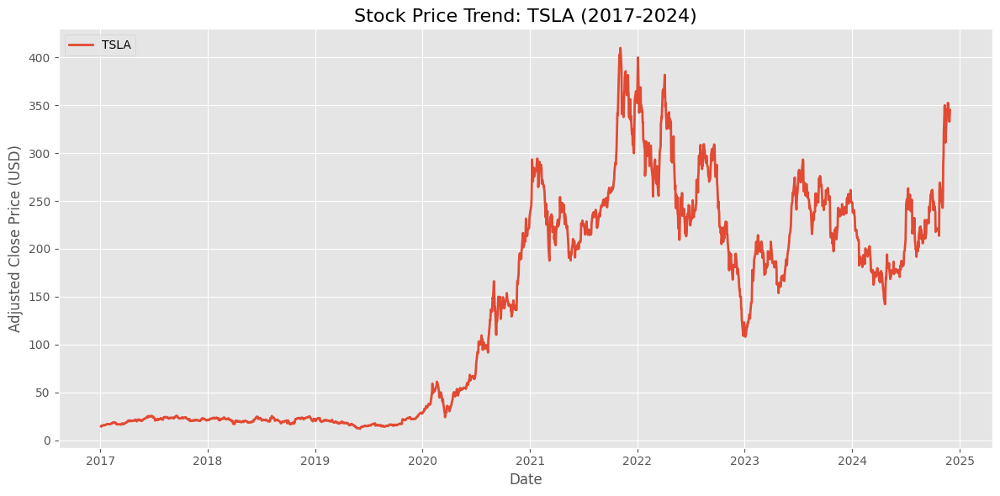

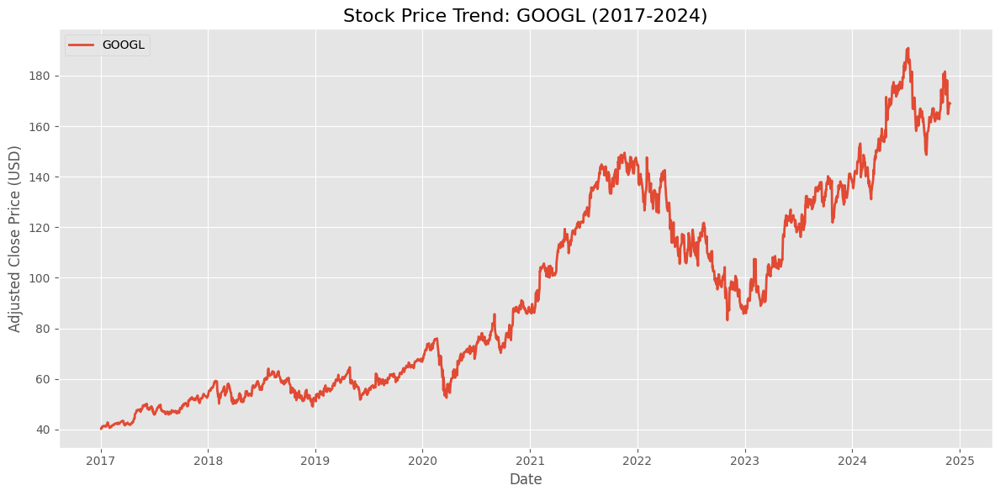

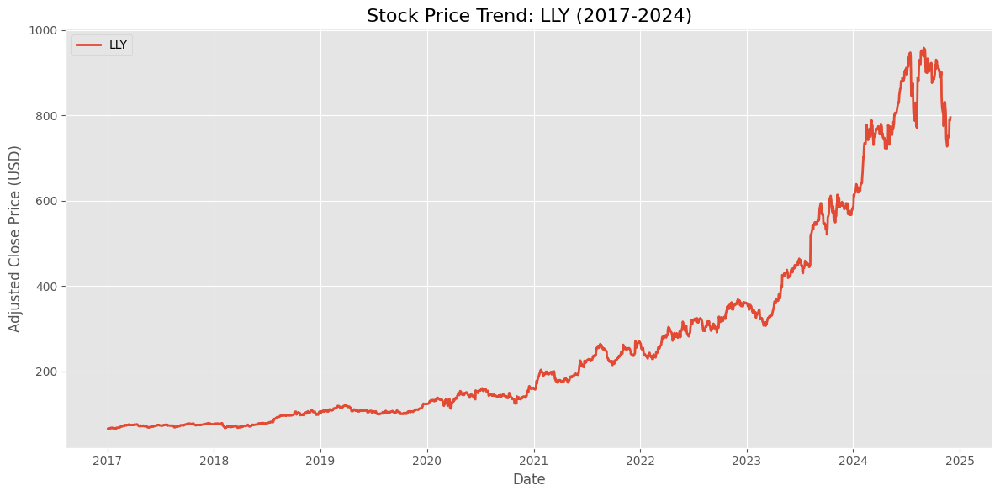

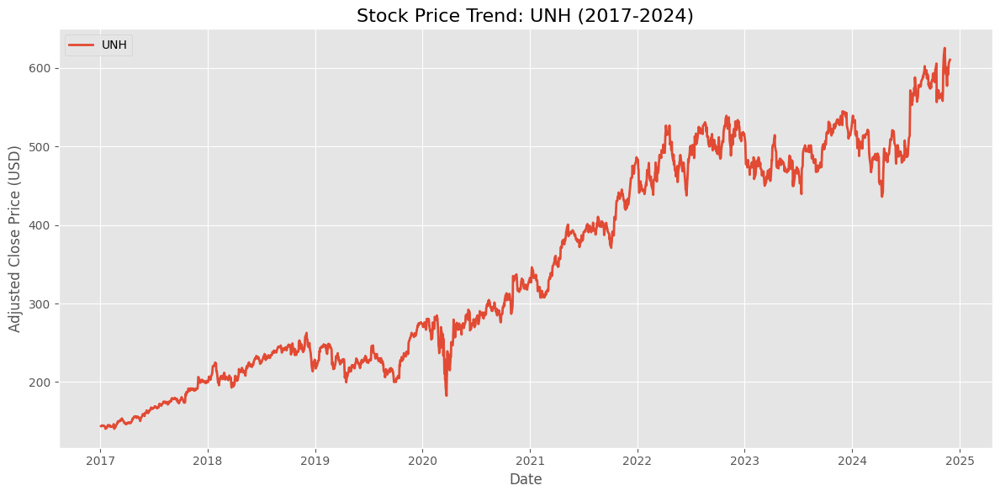

...

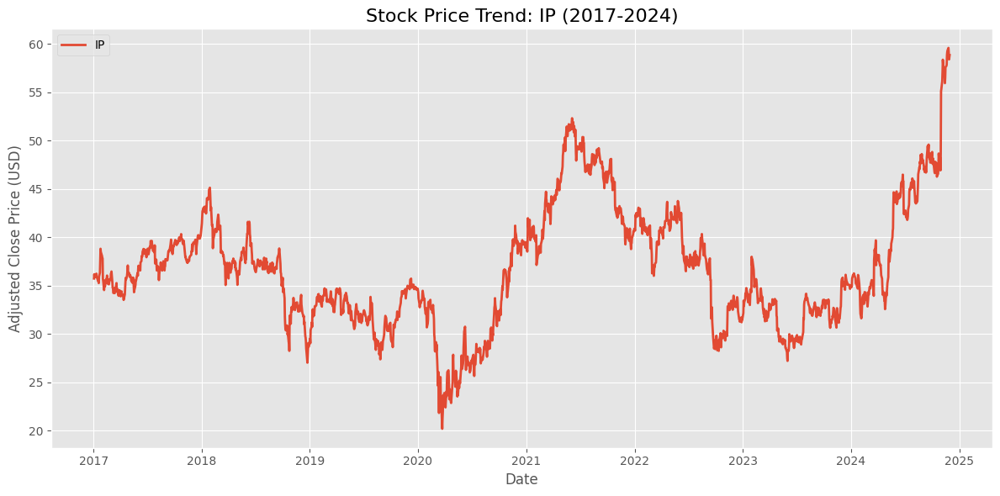

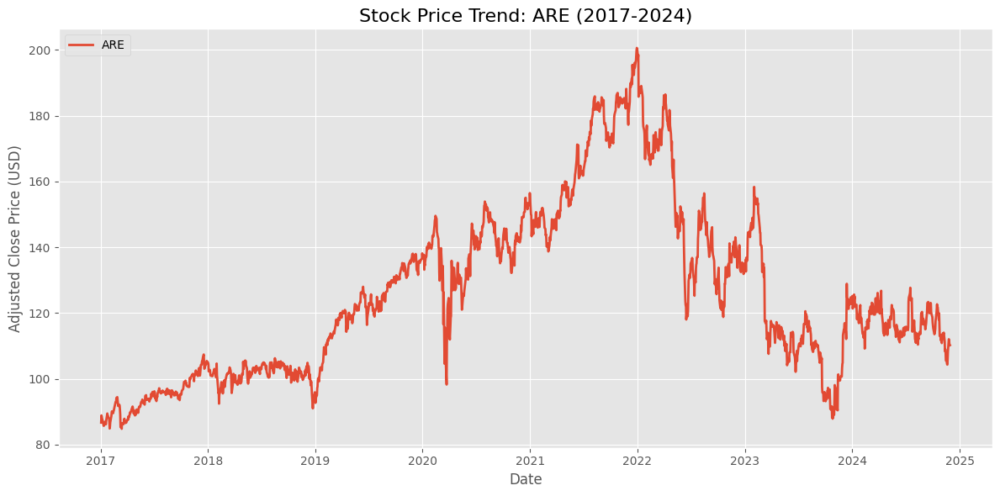

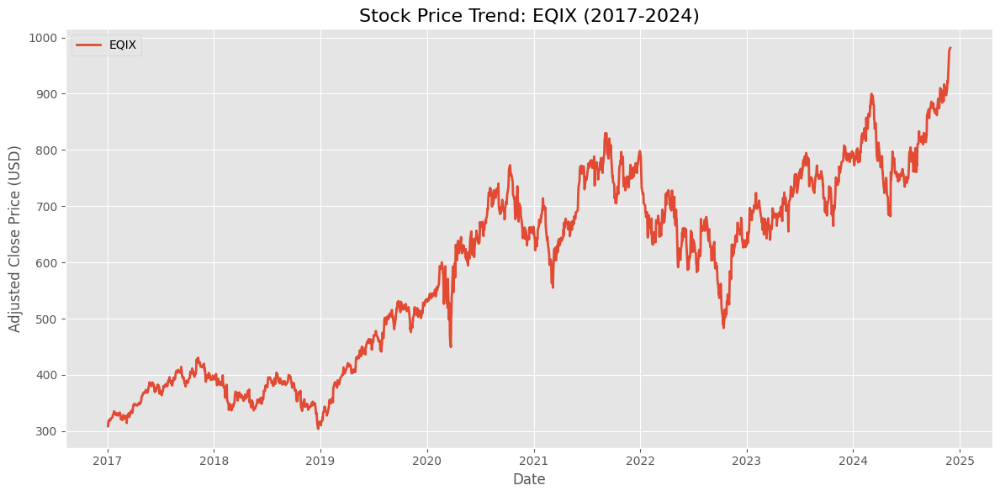

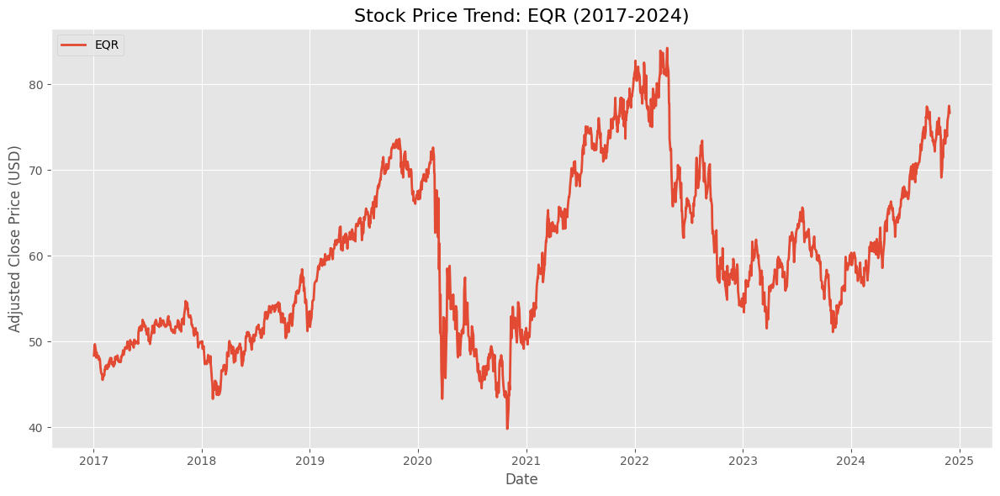

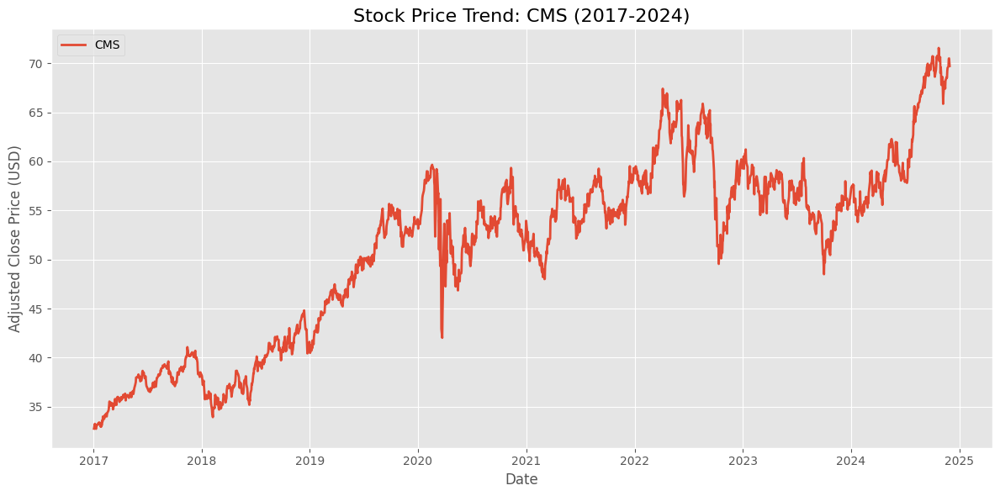

In [ ]:
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt

# Step 1: Define the selected tickers
selected_tickers = [
    'AAPL', 'TSLA', 'GOOGL', 'LLY', 'UNH', 'MRK', 'EA', 'PARA', 'NWS', 'LYV',
    'WBD', 'NFLX', 'POOL', 'RL', 'APTV', 'MNST', 'K', 'CAG', 'WMB', 'HAL',
    'EQT', 'STT', 'HIG', 'RF', 'WAT', 'LH', 'ABT', 'PCAR', 'UPS', 'SNPS',
    'CSCO', 'TXN', 'LIN', 'CTVA', 'IP', 'ARE', 'EQIX', 'EQR', 'CMS'
]

# Step 2: Download historical stock prices
start_date = "2017-01-01"  # Start date
end_date = "2024-11-30"    # End date
stock_data = yf.download(selected_tickers, start=start_date, end=end_date, interval="1d")["Adj Close"]

# Step 3: Create line plots for each company
plt.style.use('ggplot')  # Use a clean style available in Matplotlib

for ticker in selected_tickers:
    plt.figure(figsize=(12, 6))
    plt.plot(stock_data.index, stock_data[ticker], label=ticker, linewidth=2)
    plt.title(f"Stock Price Trend: {ticker} (2017-2024)", fontsize=16)
    plt.xlabel("Date", fontsize=12)
    plt.ylabel("Adjusted Close Price (USD)", fontsize=12)
    plt.legend(loc='upper left')
    plt.tight_layout()
    plt.grid(True)
    plt.show()


*4- Normalize the stock prices to compare the performance of different stocks on a similar scale.*

---




***We selected the entretainment companies***

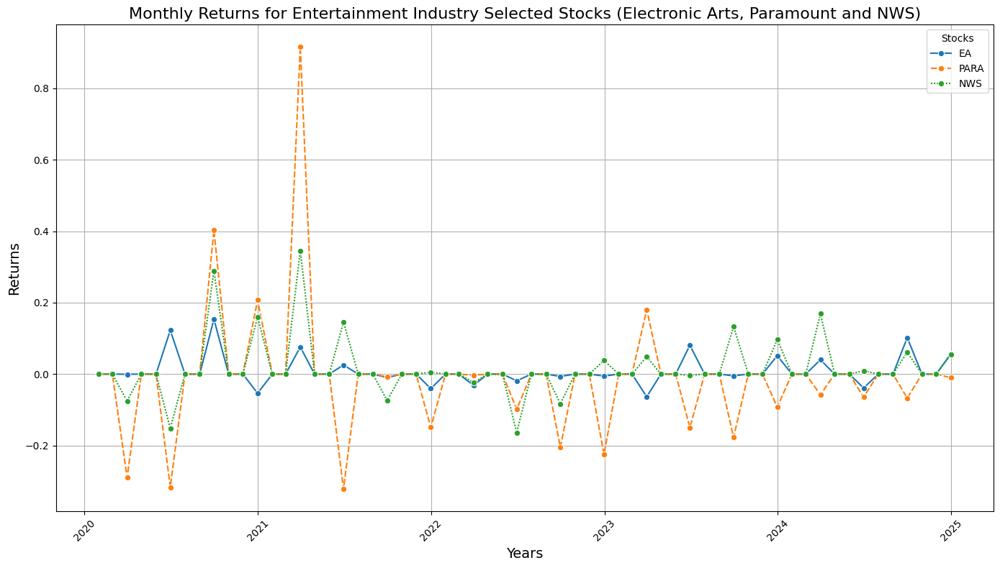

In [ ]:
# Plot Monthly Returns for Selected Stocks
selected_stocks = ['EA', 'PARA', 'NWS']
plt.figure(figsize=(14, 8))
sns.lineplot(data=monthly_returns_cleaned[selected_stocks], marker='o')
plt.title("Monthly Returns for Entertainment Industry Selected Stocks (Electronic Arts, Paramount and NWS)", fontsize=16)
plt.xlabel("Year", fontsize=14)
plt.ylabel("Returns", fontsize=14)
plt.legend(title="Stocks")
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

<Axes: xlabel='Date'>

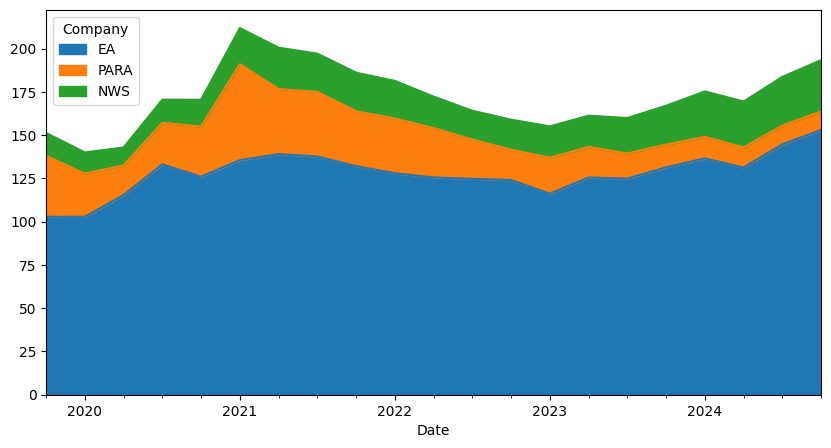

In [ ]:
stock_data.plot.area(y=["EA",	"PARA",	"NWS"],figsize=(10, 5))

Text(0.5, 1.0, 'Autocorrelation for Entertainment Industry Selected Stocks (Electronic Arts, Paramount and NWS)')

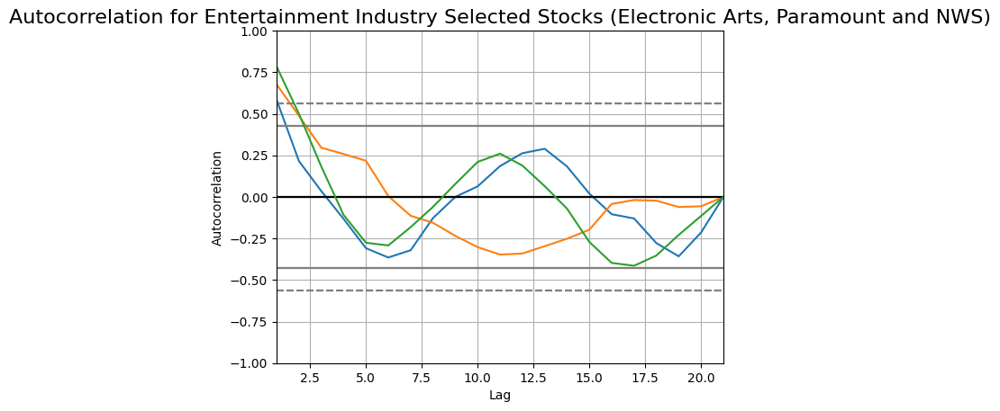

In [ ]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(stock_data["EA"])
autocorrelation_plot(stock_data["PARA"])
autocorrelation_plot(stock_data["NWS"])
plt.title("Autocorrelation for Entertainment Industry Selected Stocks (Electronic Arts, Paramount and NWS)", fontsize=16)


*Further analysys :* *Volatility*

[*********************100%***********************]  3 of 3 completed
<ipython-input-7-61d7b52cb95a>:20: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_close_prices = close_prices.resample('M').last()  # Use the last price of each month


Volatility (Rolling 15-Month Standard Deviation):
                              NWS    PARA       EA
Date                                              
2024-05-31 00:00:00+00:00  3.6423  3.7287   6.8532
2024-06-30 00:00:00+00:00  3.6218  3.2454   6.7035
2024-07-31 00:00:00+00:00  3.4905  2.0173   8.2924
2024-08-31 00:00:00+00:00  3.3773  2.0476   9.4915
2024-09-30 00:00:00+00:00  3.1511  1.9380   9.6631
2024-10-31 00:00:00+00:00  2.9310  1.7382  10.0212


<Figure size 1200x600 with 0 Axes>

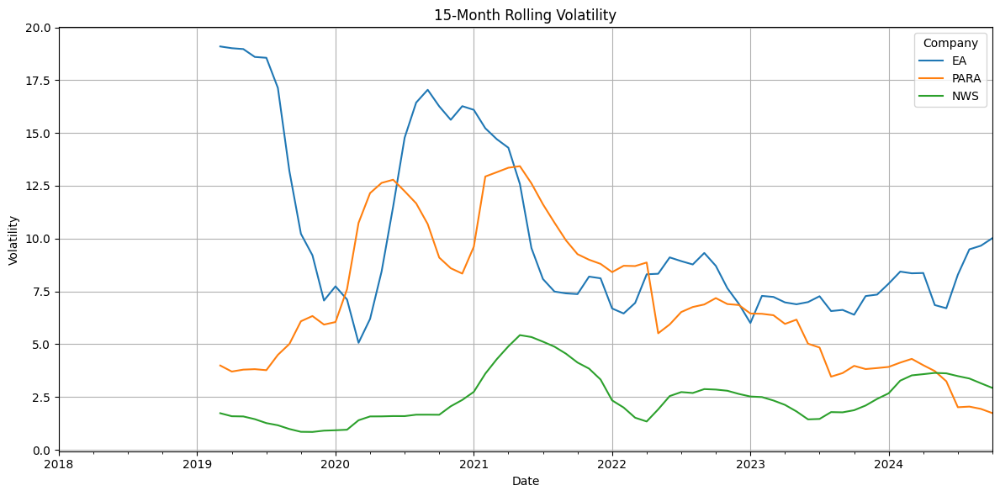

In [ ]:
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Define the stock tickers and download the data
tickers = ['EA', 'PARA', 'NWS',]  # Add more tickers as needed
print("Downloading stock data...")
stock_data = yf.download(tickers, start="2018-01-01", end="2024-10-30", group_by='ticker')

# Step 2: Extract the closing prices
close_prices = stock_data.loc[:, (slice(None), 'Close')]

# Rename columns for easier use (from "Ticker Close" to "Ticker")
close_prices.columns = [col[0] for col in close_prices.columns]

# Step 3: Ensure the index is a DatetimeIndex
close_prices.index = pd.to_datetime(close_prices.index)

# Step 4: Resample to monthly frequency
monthly_close_prices = close_prices.resample('M').last()  # Use the last price of each month

# Step 5: Calculate Volatility (Rolling Standard Deviation)
window_size = 15  # Rolling window size (e.g., 15 months)
volatility = monthly_close_prices.rolling(window=window_size).std()

# Round for readability
volatility = volatility.round(4)

# Step 6: Display Volatility Table
print(f"Volatility (Rolling {window_size}-Month Standard Deviation):")
print(volatility.tail(6))  # Show the last 6 rows

# Step 7: Plot Volatility for Selected Companies
plt.figure(figsize=(12, 6))
volatility[['EA', 'PARA', 'NWS']].plot(title=f"{window_size}-Month Rolling Volatility", figsize=(12, 6))
plt.xlabel("Date")
plt.ylabel("Volatility")
plt.legend(title="Company")
plt.grid(True)
plt.tight_layout()
plt.show()


*5*- *Create* *two* *separate* *DataFrames*

---



*Step 1- Generate Subplots for Stock Price*

array([<Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='D

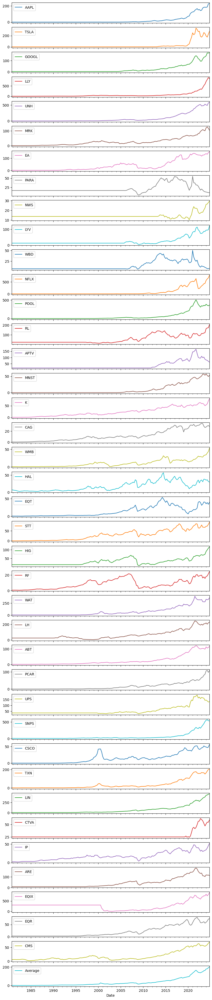

In [ ]:
stock_data.plot(subplots=True, figsize=(10,50))

*Step 2- Moving Average Analysis*

[******                13%                       ]  2 of 15 completed

[*********************100%***********************]  15 of 15 completed


5-Month Moving Average Analysis:
                               LLY     AAPL    PARA     TSLA     NWS    WBD      MRK     NFLX      UNH    GOOGL       EA     LYV     POOL       RL    APTV
Date                                                                                                                                                      
2024-04-30 00:00:00+00:00  708.254  179.898  12.716  199.344  26.176  9.256  123.624  562.376  502.042  146.392  134.672  94.822  386.822  165.038  80.238
2024-05-31 00:00:00+00:00  755.738  179.842  12.140  185.264  26.608  8.628  126.928  593.324  495.822  152.954  133.886  94.850  379.790  173.574  78.946
2024-06-30 00:00:00+00:00  807.692  185.086  11.300  187.382  27.172  8.112  127.532  615.478  495.326  161.364  134.236  95.828  367.006  179.852  76.764
2024-07-31 00:00:00+00:00  817.810  193.352  11.376  193.420  27.272  8.084  124.728  620.564  511.838  167.980  136.528  95.670  362.190  177.786  74.744
2024-08-31 00:00:00+00:00  854.222  2

<Figure size 1200x600 with 0 Axes>

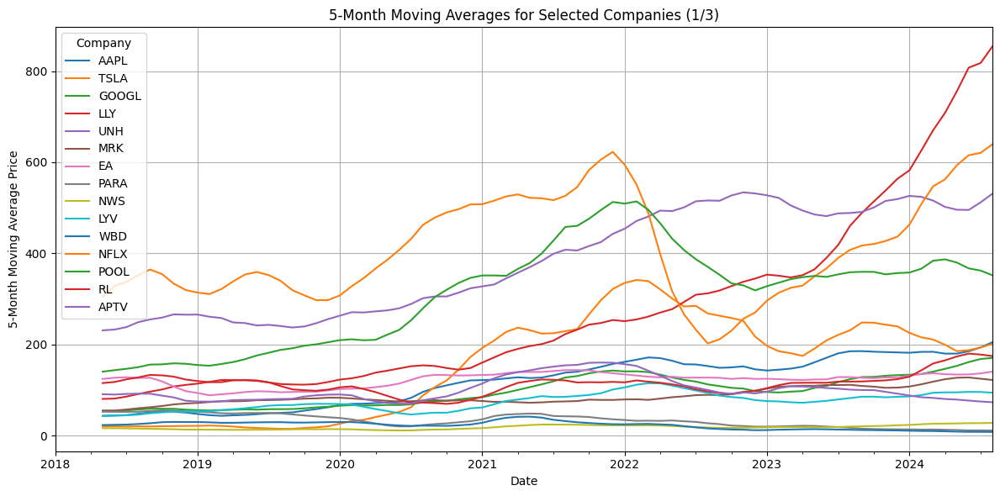

In [ ]:
import matplotlib.pyplot as plt

# Step 1: Define the first 15 stock tickers and download the data
tickers = [
    'AAPL', 'TSLA', 'GOOGL', 'LLY', 'UNH', 'MRK', 'EA', 'PARA', 'NWS', 'LYV',
    'WBD', 'NFLX', 'POOL', 'RL', 'APTV'
]  # First 15 selected companies
print("Downloading stock data...")
stock_data = yf.download(tickers, start="2018-01-01", end="2024-08-31", group_by='ticker')

# Step 2: Extract the closing prices
close_prices = stock_data.loc[:, (slice(None), 'Close')]

# Rename columns for easier use (from "Ticker Close" to "Ticker")
close_prices.columns = [col[0] for col in close_prices.columns]

# Step 3: Ensure the index is a DatetimeIndex
close_prices.index = pd.to_datetime(close_prices.index)

# Step 4: Resample to monthly frequency and calculate 5-months Moving Averages
monthly_data = close_prices.resample('M').last()  # Resample to the last value of each month
moving_averages = monthly_data.rolling(window=5).mean()  # 5-Month Moving Average
moving_averages = moving_averages.round(4)  # Round for better readability

# Step 5: Display the Moving Averages Table
print("5-Month Moving Average Analysis:")
print(moving_averages.tail())  # Show the last few rows

# Step 6: Plot the Moving Averages for Selected Companies
plt.figure(figsize=(12, 6))
moving_averages[tickers].plot(title="5-Month Moving Averages for Selected Companies (1/3)", figsize=(12, 6))
plt.xlabel("Date")
plt.ylabel("5-Month Moving Average Price")
plt.legend(title="Company")
plt.grid(True)
plt.tight_layout()
plt.show()


[*************         27%                       ]  4 of 15 completed

[*********************100%***********************]  15 of 15 completed


5-Month Moving Average Analysis:
                               HIG      ABT      UPS      RF     CAG       LH     WMB     EQT      WAT     HAL     STT       K     SNPS    MNST     PCAR
Date                                                                                                                                                    
2024-04-30 00:00:00+00:00   92.624  112.298  148.700  19.398  29.262  217.050  36.552  37.674  327.526  36.752  74.974  56.194  544.816  56.892  107.786
2024-05-31 00:00:00+00:00   97.238  110.722  145.040  19.392  29.506  210.574  37.888  38.160  323.460  36.862  74.600  57.080  553.994  55.754  109.756
2024-06-30 00:00:00+00:00   99.954  108.874  144.030  19.666  29.360  206.816  39.456  38.476  317.942  36.488  74.626  57.664  566.336  54.740  110.266
2024-07-31 00:00:00+00:00  102.970  106.334  140.452  20.414  29.808  206.738  40.856  37.948  317.714  36.410  76.874  58.264  563.254  53.210  107.820
2024-08-31 00:00:00+00:00  105.580  106.256  136.

<Figure size 1200x600 with 0 Axes>

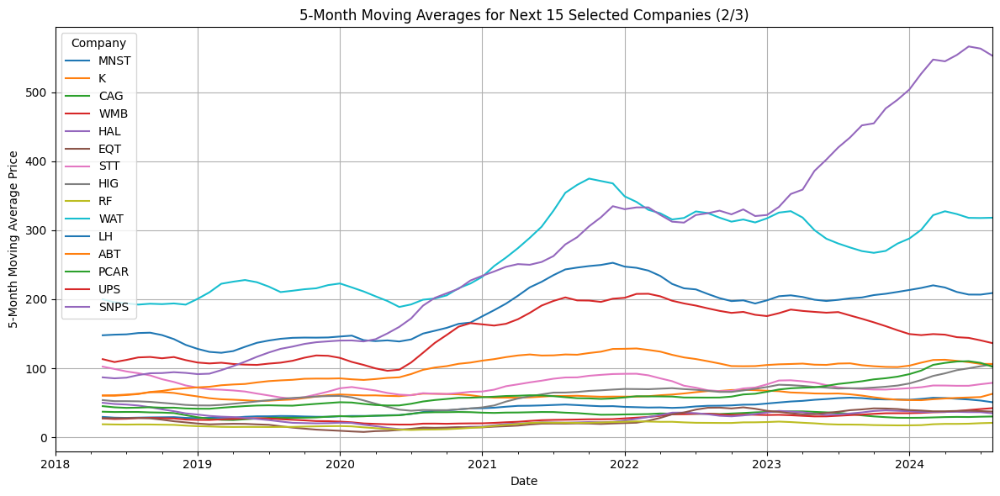

In [ ]:
# Step 1: Define the next 15 stock tickers and download the data
tickers = [
    'MNST', 'K', 'CAG', 'WMB', 'HAL', 'EQT', 'STT', 'HIG', 'RF', 'WAT',
    'LH', 'ABT', 'PCAR', 'UPS', 'SNPS'
]  # Next 15 selected companies
print("Downloading stock data...")
stock_data = yf.download(tickers, start="2018-01-01", end="2024-08-31", group_by='ticker')

# Step 2: Extract the closing prices
close_prices = stock_data.loc[:, (slice(None), 'Close')]

# Rename columns for easier use (from "Ticker Close" to "Ticker")
close_prices.columns = [col[0] for col in close_prices.columns]

# Step 3: Ensure the index is a DatetimeIndex
close_prices.index = pd.to_datetime(close_prices.index)

# Step 4: Resample to monthly frequency and calculate 5-months Moving Averages
monthly_data = close_prices.resample('M').last()  # Resample to the last value of each month
moving_averages = monthly_data.rolling(window=5).mean()  # 5-Month Moving Average
moving_averages = moving_averages.round(4)  # Round for better readability

# Step 5: Display the Moving Averages Table
print("5-Month Moving Average Analysis:")
print(moving_averages.tail())  # Show the last few rows

# Step 6: Plot the Moving Averages for Selected Companies
plt.figure(figsize=(12, 6))
moving_averages[tickers].plot(title="5-Month Moving Averages for Next 15 Selected Companies (2/3)", figsize=(12, 6))
plt.xlabel("Date")
plt.ylabel("5-Month Moving Average Price")
plt.legend(title="Company")
plt.grid(True)
plt.tight_layout()
plt.show()


[*********************100%***********************]  9 of 9 completed
<ipython-input-4-1cef2ba52c74>:21: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_data = close_prices.resample('M').last()  # Resample to the last value of each month


5-Month Moving Average Analysis:
                              EQR     CMS     EQIX      ARE      LIN    CSCO  \
Date                                                                           
2024-04-30 00:00:00+00:00  61.814  58.710  812.084  123.436  433.928  49.192   
2024-05-31 00:00:00+00:00  62.588  59.682  803.602  121.882  438.890  48.388   
2024-06-30 00:00:00+00:00  64.418  60.156  788.968  121.096  445.686  47.854   
2024-07-31 00:00:00+00:00  66.302  61.642  769.252  119.608  446.622  47.870   
2024-08-31 00:00:00+00:00  68.656  63.146  771.058  117.740  449.408  47.996   

                               TXN      IP    CTVA  
Date                                                
2024-04-30 00:00:00+00:00  169.708  36.260  51.744  
2024-05-31 00:00:00+00:00  174.618  38.048  53.348  
2024-06-30 00:00:00+00:00  181.500  39.512  55.040  
2024-07-31 00:00:00+00:00  188.796  41.736  55.556  
2024-08-31 00:00:00+00:00  196.822  43.616  55.482  


<Figure size 1200x600 with 0 Axes>

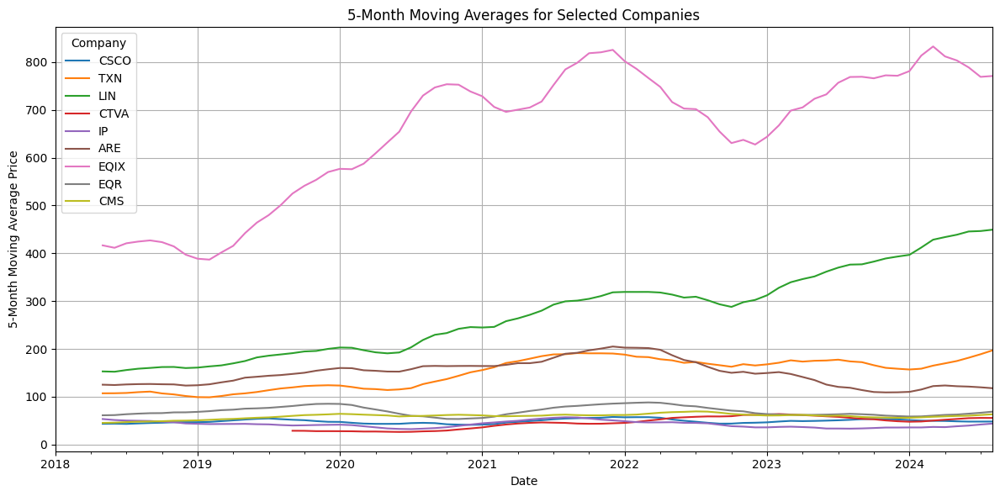

In [ ]:
# Import necessary libraries
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Define the stock tickers and download the data
tickers = ['CSCO', 'TXN', 'LIN', 'CTVA', 'IP', 'ARE', 'EQIX', 'EQR', 'CMS']  # Selected companies
print("Downloading stock data...")
stock_data = yf.download(tickers, start="2018-01-01", end="2024-08-31", group_by='ticker')

# Step 2: Extract the closing prices
close_prices = stock_data.loc[:, (slice(None), 'Close')]

# Rename columns for easier use (from "Ticker Close" to "Ticker")
close_prices.columns = [col[0] for col in close_prices.columns]

# Step 3: Ensure the index is a DatetimeIndex
close_prices.index = pd.to_datetime(close_prices.index)

# Step 4: Resample to monthly frequency and calculate 5-months Moving Averages
monthly_data = close_prices.resample('M').last()  # Resample to the last value of each month
moving_averages = monthly_data.rolling(window=5).mean()  # 5-Month Moving Average
moving_averages = moving_averages.round(4)  # Round for better readability

# Step 5: Display the Moving Averages Table
print("5-Month Moving Average Analysis:")
print(moving_averages.tail())  # Show the last few rows

# Step 6: Plot the Moving Averages for Selected Companies
plt.figure(figsize=(12, 6))
moving_averages[tickers].plot(title="5-Month Moving Averages for Selected Companies", figsize=(12, 6))
plt.xlabel("Date")
plt.ylabel("5-Month Moving Average Price")
plt.legend(title="Company")
plt.grid(True)
plt.tight_layout()
plt.show()


*Step 3- Volatility analysis*

In [ ]:
# Step 1: Define the selected tickers
tickers = ['AAPL', 'TSLA', 'GOOGL', 'LLY', 'UNH', 'MRK', 'EA', 'PARA', 'NWS', 'LYV',
    'WBD', 'NFLX', 'POOL', 'RL', 'APTV', 'MNST', 'K', 'CAG', 'WMB', 'HAL',
    'EQT', 'STT', 'HIG', 'RF', 'WAT', 'LH', 'ABT', 'PCAR', 'UPS', 'SNPS',
    'CSCO', 'TXN', 'LIN', 'CTVA', 'IP', 'ARE', 'EQIX', 'EQR', 'CMS']

# Step 2: Download the stock data
print("Downloading stock data...")
stock_data = yf.download(tickers, start="2018-01-01", end="2023-12-31", group_by='ticker')

# Step 3: Extract the closing prices
close_prices = stock_data.loc[:, (slice(None), 'Close')]
close_prices.columns = [col[0] for col in close_prices.columns]  # Simplify column names

# Step 4: Ensure the index is a DatetimeIndex
close_prices.index = pd.to_datetime(close_prices.index)

# Step 5: Resample to monthly frequency
monthly_close_prices = close_prices.resample('M').last()  # Last price of each month

# Step 6: Calculate Volatility (Rolling Standard Deviation)
window_size = 15  # Rolling window size (15 months)
volatility = monthly_close_prices.rolling(window=window_size).std().round(4)

# Step 7: Filter to Quarterly Dates from 2020
volatility = volatility.loc['2020-01-01':]  # Keep dates from 2020 onward
quarterly_volatility = volatility[volatility.index.month.isin([3, 6, 9, 12])]

# Format dates to remove hours
quarterly_volatility.index = quarterly_volatility.index.strftime('%Y-%m-%d')

# Step 8: Apply Conditional Formatting (Highlight min/max per row)
def highlight_volatility(row):
    min_val = row.min()  # Minimum volatility
    max_val = row.max()  # Maximum volatility
    return [
        'background-color: green; color: white;' if v == min_val else
        'background-color: red; color: white;' if v == max_val else ''
        for v in row
    ]

# Style the table with a title and custom formatting
styled_table = (
    quarterly_volatility.style
    .apply(highlight_volatility, subset=quarterly_volatility.columns, axis=1)
    .set_caption("Quarterly Volatility Analysis (Green: Less Volatile; Red: Most Volatile)")
    .set_table_styles([{
        'selector': 'caption',
        'props': [('font-size', '16px'), ('text-align', 'center'), ('color', 'black')]
    }])
)

# Display the styled table
styled_table

[                       0%                       ]

[*********************100%***********************]  39 of 39 completed


,TSLA,CMS,EQT,GOOGL,CSCO,RF,LH,HIG,CAG,LLY,PARA,NWS,UNH,MRK,LYV,HAL,K,PCAR,WMB,ABT,WBD,NFLX,EA,POOL,TXN,ARE,SNPS,MNST,EQIX,CTVA,EQR,AAPL,UPS,LIN,STT,IP,WAT,RL,APTV
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-03-31,10.234800,4.440500,5.337800,4.966800,5.167300,1.954100,12.152100,6.998100,3.260000,10.009900,10.743400,1.400300,19.792300,4.404600,7.496000,6.248400,4.564200,3.669800,3.932100,4.526200,3.296600,33.256000,5.067600,20.487400,9.795400,10.144100,15.525700,1.809000,69.191200,nan,6.811000,11.367500,10.248400,14.200700,8.846700,4.197000,17.940900,16.781300,11.567300
2020-06-30,18.539200,3.567900,4.307500,5.698000,5.127400,2.477200,10.258500,9.493900,3.112400,18.183400,12.786300,1.598700,26.858300,4.199000,10.391500,5.820400,4.556800,3.588200,3.784900,5.450900,4.275500,52.834200,11.510300,27.051500,8.221400,8.491200,21.024600,2.269100,74.254000,nan,9.878600,13.355700,10.988900,11.954300,8.457400,4.718600,16.072700,18.953900,12.032700
2020-09-30,46.499900,3.050400,3.245100,6.470000,4.323900,2.671700,12.532300,10.592200,3.815300,18.365600,10.688000,1.665100,30.186200,4.072000,11.018200,5.081300,3.356600,5.075500,2.730200,9.703600,4.452400,83.717800,17.044300,51.527700,10.612900,9.574800,32.140300,4.449200,91.607800,1.674600,13.452700,23.131800,23.254800,22.516600,7.970500,4.496000,16.300800,18.246900,11.554900
2020-12-31,67.898400,2.863400,3.366100,8.694500,3.741500,2.632300,16.561600,9.544100,3.738400,15.943200,8.343600,2.362900,29.118700,4.335500,11.049100,4.814400,2.979600,5.380700,2.182600,11.554700,4.591900,82.437300,16.269100,64.623700,17.901100,10.205400,41.618300,5.651100,80.537100,4.328300,13.377900,25.007400,30.543900,27.581200,7.169100,5.712000,20.192000,18.886400,19.311500
2021-03-31,80.952700,3.431800,3.977700,12.895000,4.027000,3.583200,27.845400,8.977300,3.099100,24.792300,13.143700,4.295200,33.777800,3.470100,14.425200,4.476900,3.526100,6.556400,2.128200,14.506100,10.109800,66.233500,14.703700,61.444300,25.585300,10.365200,43.385900,5.725400,64.888000,7.330800,9.282600,24.700300,32.780800,31.771900,7.752300,7.103900,33.486900,20.701700,29.609200
2021-06-30,72.184400,2.920000,3.080500,18.464500,4.961000,4.599500,34.115000,11.275300,1.516600,28.718800,12.613800,5.339800,40.630800,3.325900,17.563300,4.333600,3.130500,4.727300,2.574900,10.538500,10.084500,39.743200,9.552400,64.558500,26.365100,10.159700,33.071700,5.033400,44.774000,8.334200,9.258300,19.673800,36.018400,33.377100,9.594400,9.620400,50.965200,24.470300,31.938100
2021-09-30,50.032600,2.814800,2.879600,23.527000,6.546100,4.194200,36.977300,12.105600,1.737500,40.082200,9.915300,4.550200,42.918400,3.307100,15.848800,3.634700,3.053000,2.653100,2.700300,7.430900,9.377900,33.773200,7.407300,60.278000,22.061800,15.595800,35.791200,3.282500,54.634800,6.883600,12.451700,12.980400,21.604600,28.755300,10.831300,8.438200,67.944100,23.153800,28.543700
2021-12-31,68.396600,2.950300,2.684900,23.721500,7.097800,3.087000,32.693500,10.800800,2.124100,42.817700,8.802900,3.328400,53.972600,4.342400,17.380700,3.159700,1.955600,2.723200,2.710700,8.860800,9.023100,59.933200,8.120700,78.956500,14.909400,20.419800,46.071600,2.918600,64.117800,4.085000,12.708000,18.395600,22.098800,34.281900,10.720900,5.292800,59.632600,16.927400,19.996200
2022-03-31,60.919000,3.850300,4.190100,17.696000,4.762500,1.882900,19.304800,7.233400,2.045600,31.389400,8.699600,1.520600,54.886400,4.708500,16.309900,5.632600,2.008900,2.919800,3.212800,6.339400,8.696700,86.954100,6.954200,69.419600,8.820800,17.562900,40.539000,2.692600,62.503400,4.327600,8.803100,19.889000,20.371800,27.644500,7.529100,5.042800,43.076900,8.507800,14.950700


# ***Task 3***

---



## ***1- Create visualizations to understand the trends in stock prices***

***Step 1-Stock prices evolution***

[                       0%                       ]

[*********************100%***********************]  39 of 39 completed


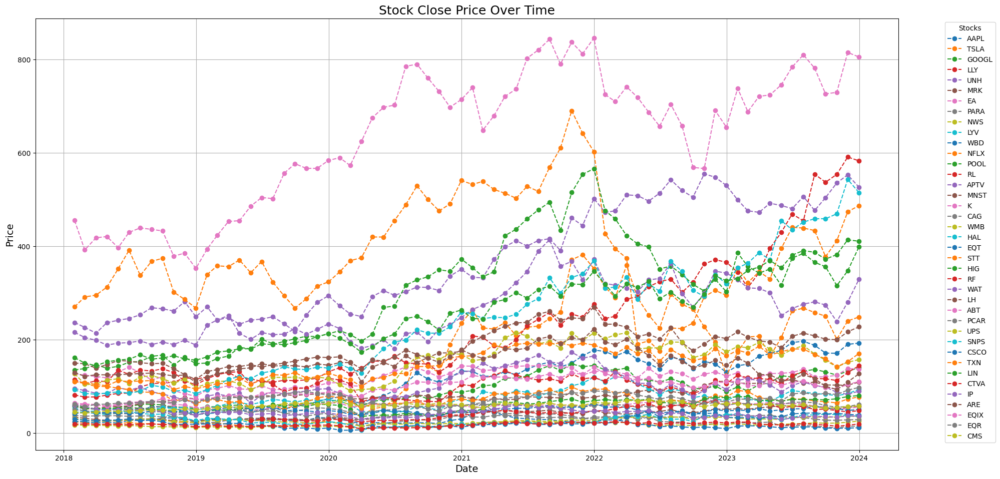

Date,CMS,TSLA,EQT,GOOGL,RF,CSCO,LH,HIG,LLY,CAG,PARA,NWS,MRK,UNH,LYV,HAL,K,PCAR,ABT,WMB,NFLX,WBD,POOL,EA,TXN,ARE,SNPS,MNST,EQIX,CTVA,EQR,AAPL,UPS,LIN,IP,STT,RL,WAT,APTV
2018-01-31,44.75,23.62,29.55,59.11,19.23,41.54,149.91,58.76,81.45,38.00,57.61,17.45,56.54,236.78,45.06,53.70,63.95,49.71,62.16,31.39,270.30,25.07,135.24,126.96,109.67,129.70,92.61,34.12,455.19,nan,61.61,41.86,127.32,161.49,59.53,110.17,114.31,215.61,94.88
2018-02-28,42.45,22.87,27.39,55.20,19.41,44.78,148.37,52.85,77.02,36.13,52.97,16.40,51.74,226.16,44.80,46.42,62.16,47.73,60.33,27.76,291.38,24.32,138.03,123.70,108.35,121.31,84.67,31.68,392.10,nan,56.23,44.53,104.41,149.75,56.43,106.15,105.84,204.64,91.33
2018-03-31,45.29,17.74,25.86,51.86,18.58,42.89,138.96,51.52,77.37,36.88,51.39,16.10,51.98,214.00,42.14,46.94,61.04,44.11,59.92,24.86,295.35,21.43,146.22,121.24,103.89,124.89,83.24,28.60,418.14,nan,61.62,41.94,104.66,144.30,50.60,99.73,111.80,198.65,84.97
2018-04-30,47.19,19.59,27.32,50.93,18.70,44.29,146.69,53.84,81.07,37.07,49.20,16.25,56.17,236.40,39.47,52.99,55.31,42.45,58.13,25.73,312.46,23.65,138.81,117.98,101.43,124.57,85.51,27.50,420.79,nan,61.71,41.31,113.50,152.52,48.83,99.78,109.85,188.41,84.58
2018-05-31,46.13,18.98,28.06,55.00,18.24,42.71,155.15,52.33,85.04,37.06,50.37,15.45,56.80,241.51,42.63,49.74,60.46,41.49,61.53,26.86,351.60,21.09,142.92,130.91,111.91,124.92,88.07,25.58,396.85,nan,63.99,46.72,116.12,156.26,50.66,96.11,134.58,192.62,97.50
2018-06-30,47.28,22.86,30.04,56.46,17.78,43.03,154.24,51.13,85.33,35.73,56.22,15.85,57.92,245.34,48.57,45.06,65.61,41.31,60.99,27.11,391.43,27.50,151.50,141.02,110.25,126.17,85.57,28.65,429.89,nan,63.69,46.28,106.23,158.15,49.32,93.09,125.72,193.59,91.63
2018-07-31,48.34,19.88,27.04,61.36,18.61,42.29,150.64,52.70,98.81,36.71,52.67,15.30,62.85,253.22,49.28,42.42,66.69,43.81,65.54,29.75,337.45,26.58,153.25,128.75,111.32,127.44,89.43,30.01,439.28,nan,65.43,47.57,119.89,167.50,50.88,88.31,134.98,197.27,98.07
2018-08-31,49.24,20.11,27.77,61.59,19.46,47.77,148.51,50.37,105.65,36.75,53.02,13.60,65.45,268.46,49.68,39.89,67.41,45.61,66.84,29.59,367.68,27.83,164.26,113.41,112.40,128.35,102.14,30.44,436.13,nan,67.75,56.91,122.88,158.19,48.43,86.91,132.81,189.48,88.01
2018-09-30,49.00,17.65,24.08,60.35,18.35,48.65,149.21,49.96,107.31,33.97,57.45,13.60,67.69,266.04,54.47,40.53,65.75,45.46,73.36,27.19,374.13,32.00,166.88,120.49,107.29,125.79,98.61,29.14,432.89,nan,66.26,56.44,116.75,160.73,46.54,83.78,137.55,194.68,83.90
2018-10-31,49.52,22.49,18.49,54.53,16.97,45.75,137.93,45.42,108.44,35.60,57.35,13.34,70.24,261.35,52.30,34.68,61.48,38.14,68.94,24.33,301.78,32.39,145.75,90.98,92.83,122.23,89.53,26.42,378.74,nan,64.96,54.72,106.54,165.47,42.95,68.75,129.61,189.69,76.80


In [ ]:
# Step 1: Define the selected tickers
tickers = ['AAPL', 'TSLA', 'GOOGL', 'LLY', 'UNH', 'MRK', 'EA', 'PARA', 'NWS', 'LYV',
    'WBD', 'NFLX', 'POOL', 'RL', 'APTV', 'MNST', 'K', 'CAG', 'WMB', 'HAL',
    'EQT', 'STT', 'HIG', 'RF', 'WAT', 'LH', 'ABT', 'PCAR', 'UPS', 'SNPS',
    'CSCO', 'TXN', 'LIN', 'CTVA', 'IP', 'ARE', 'EQIX', 'EQR', 'CMS']

# Step 2: Download the stock data
print("Downloading stock data...")
stock_data = yf.download(tickers, start="2018-01-01", end="2023-12-31", group_by='ticker')

# Step 3: Extract the closing prices
close_prices = stock_data.loc[:, (slice(None), 'Close')]
close_prices.columns = [col[0] for col in close_prices.columns]  # Simplify column names

# Step 4: Ensure the index is a DatetimeIndex
close_prices.index = pd.to_datetime(close_prices.index)

# Step 5: Resample to monthly frequency for cleaner graph and table
monthly_close_prices = close_prices.resample('M').last()  # Use the last price of each month

# Step 6: Plot the stock prices with a larger figure size
plt.figure(figsize=(20, 10))  # Larger figure size for better clarity
for ticker in tickers:
    plt.plot(monthly_close_prices.index, monthly_close_prices[ticker], label=ticker, marker='o', linestyle='--')

# Customize the graph
plt.title("Stock Close Price Over Time", fontsize=18)
plt.xlabel("Date", fontsize=14)
plt.ylabel("Price", fontsize=14)
plt.legend(title="Stocks", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True)
plt.tight_layout()

# Show the graph
plt.show()

# Step 7: Format the table
formatted_table = monthly_close_prices.reset_index()  # Reset index for cleaner display
formatted_table['Date'] = formatted_table['Date'].dt.strftime('%Y-%m-%d')  # Format dates

# Use Pandas Styler for better formatting
styled_table = (
    formatted_table.style
    .set_caption("Monthly Stock Close Prices (2018-2023)")
    .set_table_styles([{
        'selector': 'caption',
        'props': [('font-size', '16px'), ('text-align', 'center'), ('color', 'black')]
    }])
    .format(precision=2)  # Display numbers with 2 decimal points
    .hide(axis="index")  # Hide the default index
)

# Display the styled table
styled_table


## ***2- Analyze the distribution of monthly and annual returns.***

***Step 1-Distribution of monthly and annual returns datas***

In [ ]:
# Step 1: Define the selected tickers
tickers = ['AAPL', 'TSLA', 'GOOGL', 'LLY', 'UNH', 'MRK', 'EA', 'PARA', 'NWS', 'LYV',
    'WBD', 'NFLX', 'POOL', 'RL', 'APTV', 'MNST', 'K', 'CAG', 'WMB', 'HAL',
    'EQT', 'STT', 'HIG', 'RF', 'WAT', 'LH', 'ABT', 'PCAR', 'UPS', 'SNPS',
    'CSCO', 'TXN', 'LIN', 'CTVA', 'IP', 'ARE', 'EQIX', 'EQR', 'CMS']

# Step 2: Download the stock data
print("Downloading stock data...")
stock_data = yf.download(tickers, start="2018-01-01", end="2023-12-31", group_by='ticker')

# Step 3: Extract the closing prices
close_prices = stock_data.loc[:, (slice(None), 'Close')]
close_prices.columns = [col[0] for col in close_prices.columns]  # Simplify column names

# Step 4: Resample to monthly frequency
monthly_close_prices = close_prices.resample('M').last()  # Use the last price of each month

# Step 5: Calculate monthly returns
monthly_returns = monthly_close_prices.pct_change().dropna()  # Calculate percentage change

# Step 6: Reorder columns according to the ticker list
monthly_returns = monthly_returns[tickers]

# Step 7: Format the table
monthly_returns_formatted = monthly_returns.reset_index()
monthly_returns_formatted['Date'] = monthly_returns_formatted['Date'].dt.strftime('%Y-%m-%d')  # Format date as YYYY-MM-DD

styled_table = (
    monthly_returns_formatted.style
    .set_caption("Monthly Returns Table with Dates")
    .set_table_styles([{
        'selector': 'caption',
        'props': [('font-size', '16px'), ('text-align', 'center'), ('color', 'black')]
    }])
    .format(precision=4)  # Format numbers to 4 decimal places
)

# Display the styled table
styled_table


[*****                 10%                       ]  4 of 39 completed

[*********************100%***********************]  39 of 39 completed


,Date,AAPL,TSLA,GOOGL,LLY,UNH,MRK,EA,PARA,NWS,LYV,WBD,NFLX,POOL,RL,APTV,MNST,K,CAG,WMB,HAL,EQT,STT,HIG,RF,WAT,LH,ABT,PCAR,UPS,SNPS,CSCO,TXN,LIN,CTVA,IP,ARE,EQIX,EQR,CMS
0,2019-06-30,0.1305,0.2068,-0.0214,-0.0444,0.0091,0.0586,0.0879,0.0336,0.1983,0.0893,0.1262,0.0700,0.0624,0.0805,0.2622,0.0318,0.0192,-0.0093,0.0629,0.0681,-0.1361,0.0147,0.0581,0.0803,0.0724,0.0633,0.1047,0.0887,0.1114,0.1052,0.0519,0.1002,0.1122,0.0964,0.0446,-0.0363,0.0381,-0.0085,0.0321
1,2019-07-31,0.0764,0.0812,0.1250,-0.0166,0.0205,-0.0103,-0.0865,0.0323,-0.0358,0.0877,-0.0127,-0.1207,-0.0085,-0.0824,0.0844,0.0100,0.0868,0.0886,-0.1213,0.0114,-0.0443,0.0362,0.0343,0.0663,-0.0217,-0.0311,0.0357,-0.0212,0.1569,0.0316,0.0122,0.0893,-0.0474,-0.0024,0.0136,0.0374,-0.0043,0.0391,0.0054
2,2019-08-31,-0.0202,-0.0662,-0.0227,0.0369,-0.0603,0.0419,0.0128,-0.1835,0.0520,-0.0354,-0.0894,-0.0905,0.0370,-0.1525,-0.0511,-0.0900,0.0787,-0.0177,-0.0422,-0.1809,-0.3269,-0.1167,0.0113,-0.0822,0.0063,0.0002,-0.0204,-0.0653,-0.0068,0.0682,-0.1551,-0.0101,-0.0124,-0.0061,-0.1095,0.0238,0.1079,0.0744,0.0830
3,2019-09-30,0.0730,0.0676,0.0257,-0.0101,-0.0713,-0.0265,0.0442,-0.0402,0.0099,-0.0456,-0.0351,-0.0890,0.0271,0.0807,0.0511,-0.0104,0.0247,0.0818,0.0195,0.0005,0.0462,0.1536,0.0400,0.0821,0.0535,0.0026,-0.0193,0.0679,0.0098,-0.0322,0.0555,0.0444,0.0255,-0.0450,0.0696,0.0280,0.0369,0.0177,0.0143
4,2019-10-31,0.1107,0.3074,0.0308,0.0190,0.1628,0.0295,-0.0145,-0.1073,-0.0126,0.0627,0.0124,0.0739,0.0283,0.0062,0.0244,-0.0332,-0.0127,-0.1183,-0.0727,0.0212,0.0094,0.1162,-0.0582,0.0177,-0.0520,-0.0192,-0.0007,0.0864,-0.0388,-0.0109,-0.0385,-0.0870,0.0239,-0.0579,0.0445,0.0306,-0.0174,0.0278,-0.0005
5,2019-11-30,0.0743,0.0477,0.0360,0.0298,0.1075,0.0060,0.0478,0.1204,-0.0673,-0.0098,0.2218,0.0948,-0.0046,0.1174,0.0484,0.0657,0.0250,0.0673,0.0184,0.0904,-0.1872,0.1367,0.0837,0.0335,0.0494,0.0456,0.0220,0.0698,0.0396,0.0390,-0.0463,0.0188,0.0396,-0.0136,0.0609,0.0237,0.0001,-0.0402,-0.0410
6,2019-12-31,0.0988,0.2679,0.0271,0.1200,0.0504,0.0432,0.0644,0.0394,0.1017,0.0238,-0.0061,0.0283,0.0287,0.0920,0.0116,0.0624,0.0620,0.1860,0.0440,0.1658,0.2486,0.0533,-0.0176,0.0313,0.0521,-0.0181,0.0165,-0.0279,-0.0223,-0.0130,0.0585,0.0672,0.0324,0.1360,-0.0063,-0.0058,0.0297,-0.0491,0.0251
7,2020-01-31,0.0540,0.5552,0.0697,0.0625,-0.0732,-0.0606,0.0038,-0.1868,-0.0372,-0.0463,-0.1063,0.0665,0.0326,-0.0317,-0.1072,0.0480,-0.0137,-0.0386,-0.1277,-0.1087,-0.4450,-0.0439,-0.0245,-0.0927,-0.0422,0.0368,0.0032,-0.0618,-0.1157,0.0597,-0.0415,-0.0596,-0.0459,-0.0217,-0.1157,0.0100,0.0103,0.0267,0.0902
8,2020-02-29,-0.1168,0.0268,-0.0653,-0.0967,-0.0642,-0.1039,-0.0607,-0.2789,-0.1095,-0.1084,-0.1217,0.0694,-0.0380,-0.0704,-0.0788,-0.0629,-0.1135,-0.1892,-0.0793,-0.2224,-0.0298,-0.0994,-0.1574,-0.1317,-0.1291,0.0017,-0.1160,-0.0985,-0.1259,-0.0649,-0.1314,-0.0540,-0.0597,-0.0595,-0.0923,-0.0694,-0.0287,-0.0961,-0.1181
9,2020-03-31,-0.0698,-0.2156,-0.1324,0.0998,-0.0219,0.0050,-0.0118,-0.4307,-0.2773,-0.2519,-0.2436,0.0175,-0.0673,-0.3666,-0.3696,-0.0985,-0.0079,0.0993,-0.2572,-0.5961,0.2044,-0.2179,-0.2945,-0.3365,-0.0659,-0.2806,0.0244,-0.0862,0.0324,-0.0663,-0.0155,-0.1245,-0.0943,-0.1360,-0.1577,-0.0976,0.0904,-0.1783,-0.0276


***Step 2- Distribution of annual returns analysis***

***Step 3- Distribution of monthly returns analysis***

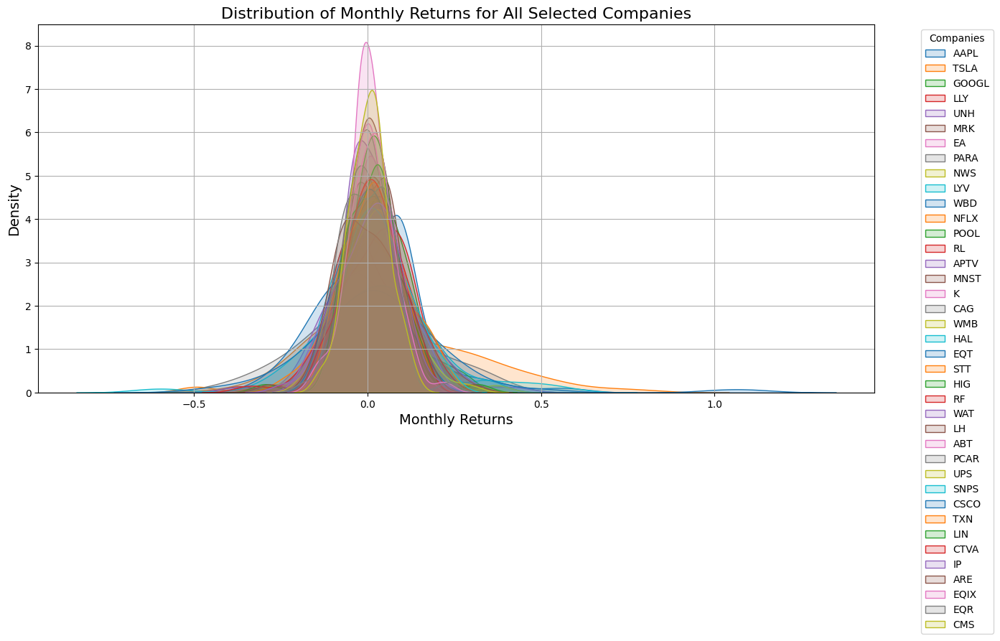

In [ ]:
# Plot the distribution of monthly returns for all companies with individual KDEs
plt.figure(figsize=(14, 8))
for company in monthly_returns.columns:
    sns.kdeplot(data=monthly_returns[company], label=company, fill=True, alpha=0.2)

plt.title("Distribution of Monthly Returns for All Selected Companies", fontsize=16)
plt.xlabel("Monthly Returns", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.legend(title="Companies", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True)
plt.tight_layout()

# Show the graph
plt.show()


## ***3- Create correlation matrices to identify relationships between different stocks and financial ratios***

***Step 1- Correlation Heatmap***

[*****                 10%                       ]  4 of 39 completed

[*********************100%***********************]  39 of 39 completed


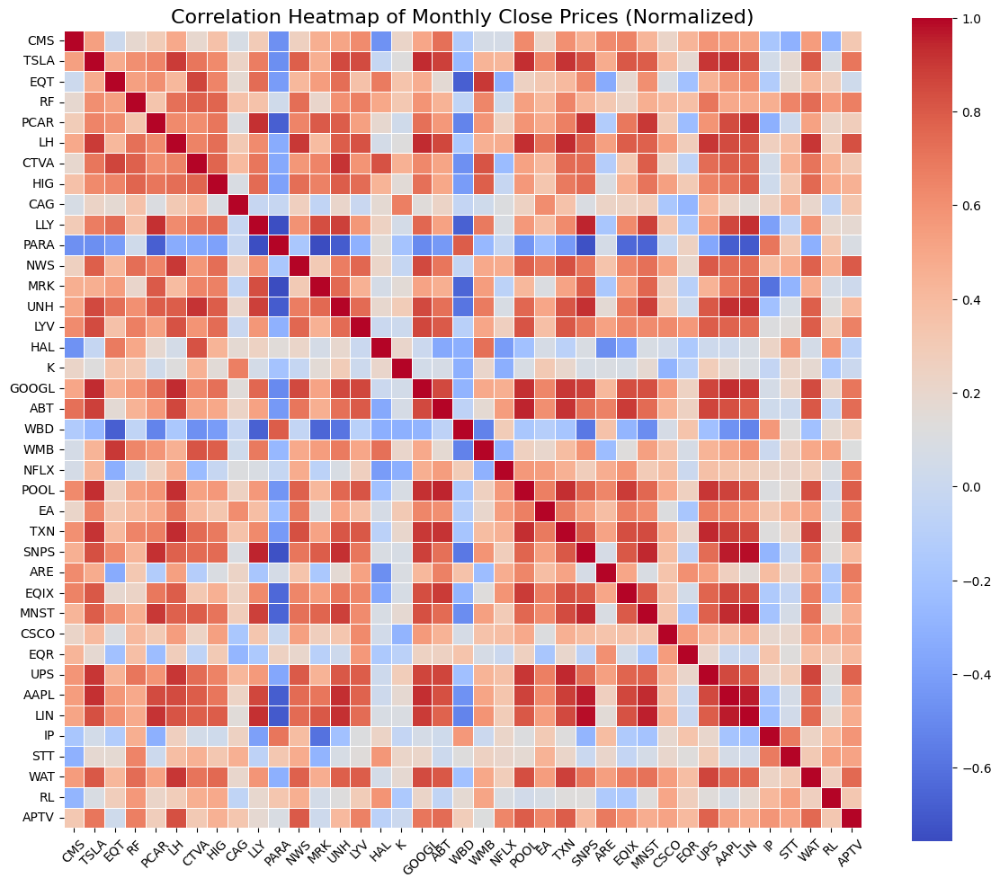

In [ ]:
# Step 1: Define the selected tickers
tickers = ['AAPL', 'TSLA', 'GOOGL', 'LLY', 'UNH', 'MRK', 'EA', 'PARA', 'NWS', 'LYV',
    'WBD', 'NFLX', 'POOL', 'RL', 'APTV', 'MNST', 'K', 'CAG', 'WMB', 'HAL',
    'EQT', 'STT', 'HIG', 'RF', 'WAT', 'LH', 'ABT', 'PCAR', 'UPS', 'SNPS',
    'CSCO', 'TXN', 'LIN', 'CTVA', 'IP', 'ARE', 'EQIX', 'EQR', 'CMS']
# Step 2: Download the stock data
print("Downloading stock data...")
stock_data = yf.download(tickers, start="2018-01-01", end="2023-12-31", group_by='ticker')

# Step 3: Extract the closing prices
close_prices = stock_data.loc[:, (slice(None), 'Close')]
close_prices.columns = [col[0] for col in close_prices.columns]  # Simplify column names

# Step 4: Resample to monthly frequency and normalize
monthly_close_prices = close_prices.resample('M').last()  # Use the last price of each month
normalized_prices = (monthly_close_prices - monthly_close_prices.mean()) / monthly_close_prices.std()

# Step 5: Calculate correlation matrix
correlation_matrix = normalized_prices.corr()

# Step 6: Plot the heatmap
plt.figure(figsize=(12, 10))  # Adjust the figure size for clarity
sns.heatmap(
    correlation_matrix,
    annot=False,  # Turn off annotations for cleaner visualization
    cmap="coolwarm",  # Use the coolwarm colormap
    cbar=True,  # Display the color bar
    square=True,  # Make each cell square-shaped
    linewidths=0.5,  # Add spacing between cells
)

# Customize the heatmap
plt.title("Correlation Heatmap of Monthly Close Prices (Normalized)", fontsize=16)
plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()

# Show the heatmap
plt.show()


# ***Task 4***

---




## ***1- Use mean-variance optimization to construct a portfolio***

***Step 1- Optimized minimun risk Portofolio Construction***

In [ ]:
# Step 1: Define the selected companies and their data
tickers = ['AAPL', 'TSLA', 'GOOGL', 'LLY', 'UNH', 'MRK', 'EA', 'PARA', 'NWS', 'LYV',
           'WBD', 'NFLX', 'POOL', 'RL', 'APTV', 'MNST', 'K', 'CAG', 'WMB', 'HAL',
           'EQT', 'STT', 'HIG', 'RF', 'WAT', 'LH', 'ABT', 'PCAR', 'UPS', 'SNPS',
           'CSCO', 'TXN', 'LIN', 'CTVA', 'IP', 'ARE', 'EQIX', 'EQR', 'CMS']

# Example mean returns and covariance matrix (replace these with real data)
np.random.seed(42)
mean_returns = pd.Series(np.random.uniform(0.01, 0.2, len(tickers)), index=tickers)
cov_matrix = pd.DataFrame(
    np.random.uniform(0.0001, 0.0005, (len(tickers), len(tickers))),
    index=tickers,
    columns=tickers
)
cov_matrix = (cov_matrix + cov_matrix.T) / 2  # Ensure covariance matrix is symmetric

# Step 2: Define the portfolio variance function
def portfolio_variance(weights, cov_matrix):
    """
    Calculate portfolio variance.
    """
    return np.dot(weights.T, np.dot(cov_matrix, weights))

# Step 3: Define the optimization constraints
target_return = 0.12  # Set the desired portfolio return (12%)
num_assets = len(tickers)

# Constraint: Sum of weights = 1
def weights_sum_to_one(weights):
    return np.sum(weights) - 1

# Constraint: Portfolio return must be at least the target return
def return_constraint(weights, mean_returns, target_return):
    portfolio_return = np.dot(weights, mean_returns)
    return portfolio_return - target_return

# Step 4: Optimization setup
initial_weights = np.ones(num_assets) / num_assets  # Start with equal weights
bounds = [(0, 1) for _ in range(num_assets)]  # Weights between 0 and 1
constraints = [
    {'type': 'eq', 'fun': weights_sum_to_one},  # Weights sum to 1
    {'type': 'ineq', 'fun': return_constraint, 'args': (mean_returns, target_return)}  # Target return constraint
]

# Step 5: Optimize the portfolio
optimized_portfolio = minimize(
    portfolio_variance,
    initial_weights,
    args=(cov_matrix,),
    method='SLSQP',
    bounds=bounds,
    constraints=constraints
)

# Extract results
weights_optimized = optimized_portfolio.x
expected_return_optimized = np.dot(weights_optimized, mean_returns)
risk_optimized = np.sqrt(portfolio_variance(weights_optimized, cov_matrix))
variance_optimized = portfolio_variance(weights_optimized, cov_matrix)
sharpe_ratio = expected_return_optimized / risk_optimized  # Assuming risk-free rate is 0

# Step 6: Display results in a table
portfolio_results = pd.DataFrame({
    'Metric': ['Expected Return', 'Risk (Std Dev)', 'Variance', 'Sharpe Ratio'],
    'Value': [
        round(expected_return_optimized, 4),
        round(risk_optimized, 4),
        round(variance_optimized, 4),
        round(sharpe_ratio, 4)
    ]
})

weights_table = pd.DataFrame({'Ticker': mean_returns.index, 'Weight': weights_optimized})
selected_weights = weights_table[weights_table['Weight'] > 0].sort_values(by='Weight', ascending=False)

print("Mean-Variance Optimized Portfolio Results:")
print(portfolio_results)
print("\nSelected Companies and Weights:")
print(selected_weights)

# Step 7: Visualize the portfolio weights
plt.figure(figsize=(12, 8))
plt.bar(selected_weights['Ticker'], selected_weights['Weight'], color='blue')
plt.title("Portfolio Weights (Mean-Variance Optimization)", fontsize=16)
plt.xlabel("Assets", fontsize=12)
plt.ylabel("Weight", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Step 8: Display the portfolio results in a clean table after the graph
from IPython.display import display
print("\nPortfolio Metrics Table:")
display(portfolio_results)

print("\nOptimized Portfolio Weights:")
display(selected_weights)


NameError: name 'np' is not defined

***Step 2- Maximize Sharpe Ratio Portfolio***

Max Sharpe Ratio Portfolio Results:
            Metric    Value
0  Expected Return   0.1834
1   Risk (Std Dev)   0.0159
2     Sharpe Ratio  10.3073

Selected Companies and Weights:
   Ticker        Weight
11   NFLX  6.328595e-01
2   GOOGL  2.505756e-01
34     IP  6.810993e-02
1    TSLA  4.196812e-02
33   CTVA  1.000740e-02
8     NWS  3.362575e-07
25     LH  2.689317e-07
36   EQIX  1.785329e-07
24    WAT  1.567637e-07
19    HAL  1.436416e-07
28    UPS  1.175260e-07
14   APTV  1.055718e-07
29   SNPS  9.605227e-08
7    PARA  8.885351e-08
18    WMB  8.744116e-08
16      K  8.520246e-08
21    STT  7.933302e-08
9     LYV  5.831303e-08
20    EQT  5.610886e-08
13     RL  5.483510e-08
26    ABT  5.293853e-08
35    ARE  5.196573e-08
31    TXN  4.304004e-08
32    LIN  3.862435e-08
37    EQR  3.734836e-08
10    WBD  3.518504e-08
4     UNH  3.067116e-08
38    CMS  2.454645e-08
12   POOL  2.333297e-08
5     MRK  2.302176e-08
30   CSCO  2.135123e-08
3     LLY  1.979724e-08
15   MNST  1.741957e-08
6  

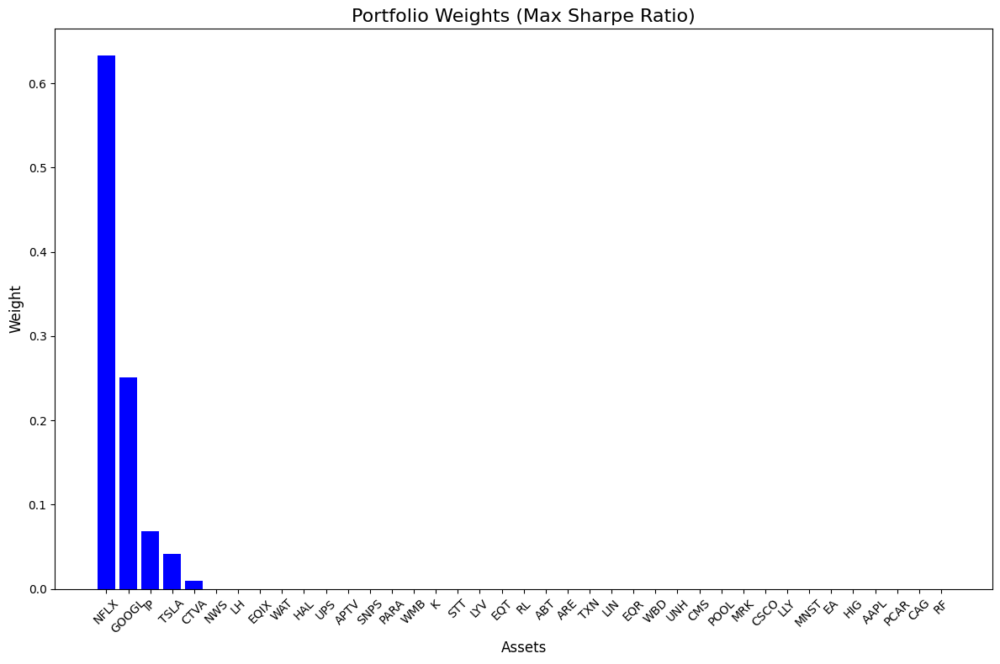


Portfolio Metrics Table:


,Metric,Value
0,Expected Return,0.1834
1,Risk (Std Dev),0.0159
2,Sharpe Ratio,10.3073



Optimized Portfolio Weights:


,Ticker,Weight
11,NFLX,6.328595e-01
2,GOOGL,2.505756e-01
34,IP,6.810993e-02
1,TSLA,4.196812e-02
33,CTVA,1.000740e-02
8,NWS,3.362575e-07
25,LH,2.689317e-07
36,EQIX,1.785329e-07
24,WAT,1.567637e-07
19,HAL,1.436416e-07


In [ ]:
# Step 1: Define the selected companies
tickers = ['AAPL', 'TSLA', 'GOOGL', 'LLY', 'UNH', 'MRK', 'EA', 'PARA', 'NWS', 'LYV',
           'WBD', 'NFLX', 'POOL', 'RL', 'APTV', 'MNST', 'K', 'CAG', 'WMB', 'HAL',
           'EQT', 'STT', 'HIG', 'RF', 'WAT', 'LH', 'ABT', 'PCAR', 'UPS', 'SNPS',
           'CSCO', 'TXN', 'LIN', 'CTVA', 'IP', 'ARE', 'EQIX', 'EQR', 'CMS']

# Example mean returns and covariance matrix (replace with actual data)
np.random.seed(42)
mean_returns = pd.Series(np.random.uniform(0.01, 0.2, len(tickers)), index=tickers)
cov_matrix = pd.DataFrame(
    np.random.uniform(0.0001, 0.0005, (len(tickers), len(tickers))),
    index=tickers,
    columns=tickers
)
cov_matrix = (cov_matrix + cov_matrix.T) / 2  # Ensure symmetric covariance matrix
risk_free_rate = 0.02  # Annual risk-free rate

# Step 2: Define the objective function to maximize Sharpe Ratio
def neg_sharpe_ratio(weights, mean_returns, cov_matrix, risk_free_rate):
    """
    Calculate the negative Sharpe Ratio.
    """
    portfolio_return = np.dot(weights, mean_returns)
    portfolio_risk = np.sqrt(np.dot(weights.T, np.dot(cov_matrix, weights)))
    sharpe_ratio = (portfolio_return - risk_free_rate) / portfolio_risk
    return -sharpe_ratio  # Negative for maximization

# Step 3: Diversification constraint: at least 10 companies with weights > 0.01
def diversification_constraint(weights):
    """
    Ensure at least 10 companies have weights > 0.01 (1%).
    """
    return np.sum(weights > 0.01) - 10

# Step 4: Setup optimization parameters
num_assets = len(tickers)
initial_weights = np.ones(num_assets) / num_assets  # Equal weights initially
bounds = tuple((0, 1) for _ in range(num_assets))  # Weights between 0 and 1
constraints = [
    {'type': 'eq', 'fun': lambda x: np.sum(x) - 1},  # Sum of weights = 1
    {'type': 'ineq', 'fun': diversification_constraint}  # At least 10 stocks with non-zero weights
]

# Step 5: Optimize for maximum Sharpe Ratio
optimized_sharpe = minimize(
    neg_sharpe_ratio,
    initial_weights,
    args=(mean_returns, cov_matrix, risk_free_rate),
    method='SLSQP',
    bounds=bounds,
    constraints=constraints
)

weights_sharpe = optimized_sharpe.x
expected_return_sharpe = np.dot(weights_sharpe, mean_returns)
risk_sharpe = np.sqrt(np.dot(weights_sharpe.T, np.dot(cov_matrix, weights_sharpe)))
sharpe_ratio_sharpe = (expected_return_sharpe - risk_free_rate) / risk_sharpe

# Step 6: Display Results
portfolio_results_sharpe = pd.DataFrame({
    'Metric': ['Expected Return', 'Risk (Std Dev)', 'Sharpe Ratio'],
    'Value': [round(expected_return_sharpe, 4), round(risk_sharpe, 4), round(sharpe_ratio_sharpe, 4)]
})
weights_table_sharpe = pd.DataFrame({'Ticker': mean_returns.index, 'Weight': weights_sharpe})

# Filter only selected companies with non-zero weights
selected_weights = weights_table_sharpe[weights_table_sharpe['Weight'] > 0]
selected_weights = selected_weights.sort_values(by='Weight', ascending=False)

print("Max Sharpe Ratio Portfolio Results:")
print(portfolio_results_sharpe)
print("\nSelected Companies and Weights:")
print(selected_weights)

# Step 7: Plot the portfolio weights
plt.figure(figsize=(12, 8))
plt.bar(selected_weights['Ticker'], selected_weights['Weight'], color='blue')
plt.title("Portfolio Weights (Max Sharpe Ratio)", fontsize=16)
plt.xlabel("Assets", fontsize=12)
plt.ylabel("Weight", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Step 8: Display the portfolio results in a clean table after the graph
from IPython.display import display
print("\nPortfolio Metrics Table:")
display(portfolio_results_sharpe)

print("\nOptimized Portfolio Weights:")
display(selected_weights)


***Step 3- Final Optimized Portofolio Construction - Adding restrictions:***

***- the weight in the portofolio by stock is between 3% and 25%***

***- Between 10 and 20 differents stocks with significative weight differences***

***- Expected return better than 12%***

***- Lower standard deviation than S&P 500 stocks***

Max Sharpe Ratio Portfolio Results:
            Metric   Value
0  Expected Return  0.1232
1   Risk (Std Dev)  0.0223
2     Sharpe Ratio  4.6240

Selected Companies and Weights:
   Ticker    Weight
31    TXN  0.048444
24    WAT  0.048295
13     RL  0.042925
4     UNH  0.041199
2   GOOGL  0.039391
12   POOL  0.037515
34     IP  0.036977
29   SNPS  0.036687
26    ABT  0.035723
30   CSCO  0.035606
6      EA  0.034537
17    CAG  0.033438
8     NWS  0.032660
18    WMB  0.031940
22    HIG  0.031398
10    WBD  0.031060
35    ARE  0.030707


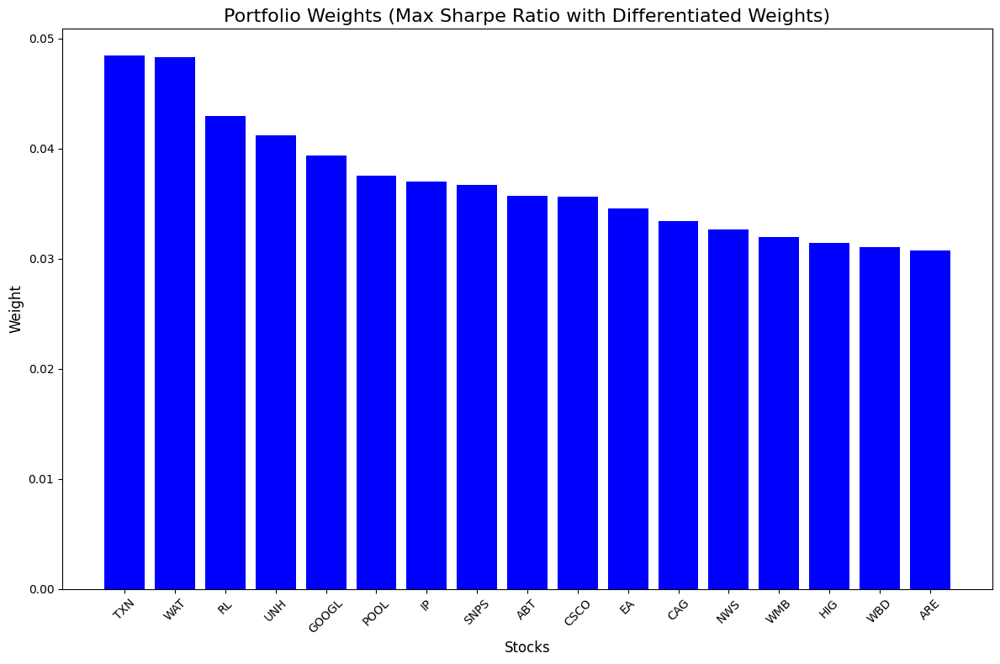


Portfolio Metrics:


,Metric,Value
0,Expected Return,0.1232
1,Risk (Std Dev),0.0223
2,Sharpe Ratio,4.6240



Optimized Portfolio Weights:


,Ticker,Weight
31,TXN,0.048444
24,WAT,0.048295
13,RL,0.042925
4,UNH,0.041199
2,GOOGL,0.039391
12,POOL,0.037515
34,IP,0.036977
29,SNPS,0.036687
26,ABT,0.035723
30,CSCO,0.035606



Minimum weight difference between stocks: 0.000116


In [ ]:
# Step 1: Define the selected companies
tickers = ['AAPL', 'TSLA', 'GOOGL', 'LLY', 'UNH', 'MRK', 'EA', 'PARA', 'NWS', 'LYV',
           'WBD', 'NFLX', 'POOL', 'RL', 'APTV', 'MNST', 'K', 'CAG', 'WMB', 'HAL',
           'EQT', 'STT', 'HIG', 'RF', 'WAT', 'LH', 'ABT', 'PCAR', 'UPS', 'SNPS',
           'CSCO', 'TXN', 'LIN', 'CTVA', 'IP', 'ARE', 'EQIX', 'EQR', 'CMS']

# Generate example mean returns and covariance matrix
np.random.seed(42)
mean_returns = pd.Series(np.random.uniform(0.01, 0.2, len(tickers)), index=tickers)
cov_matrix = pd.DataFrame(
    np.random.uniform(0.0001, 0.0005, (len(tickers), len(tickers))),
    index=tickers,
    columns=tickers
)
cov_matrix = (cov_matrix + cov_matrix.T) / 2  # Symmetric covariance matrix
risk_free_rate = 0.02  # Annual risk-free rate

# Step 2: Define the objective function to maximize Sharpe Ratio
def neg_sharpe_ratio(weights, mean_returns, cov_matrix, risk_free_rate):
    portfolio_return = np.dot(weights, mean_returns)
    portfolio_risk = np.sqrt(np.dot(weights.T, np.dot(cov_matrix, weights)))
    sharpe_ratio = (portfolio_return - risk_free_rate) / portfolio_risk

    # Penalty for weights being too similar
    weight_differences = np.abs(weights[:, None] - weights[None, :])
    mask = (weight_differences > 0) & (weight_differences < 0.002)
    penalty = np.sum(mask * (0.002 - weight_differences) ** 2)

    return -sharpe_ratio + 10000 * penalty  # Combine Sharpe Ratio and penalty with a strong coefficient

# Step 3: Constraints for diversification and expected return
def num_stocks_constraint(weights):
    """
    Ensure between 10 and 20 stocks have weights > 3%.
    """
    return np.sum(weights > 0.03) - 10

def expected_return_constraint(weights, mean_returns, min_return=0.12):
    """
    Ensure the portfolio's expected return is at least min_return.
    """
    portfolio_return = np.dot(weights, mean_returns)
    return portfolio_return - min_return

def weight_difference_constraint(weights):
    """
    Ensure weights differ by at least 0.2% between all selected stocks.
    """
    weight_differences = np.abs(weights[:, None] - weights[None, :])
    mask = (weight_differences > 0) & (weight_differences < 0.002)
    return np.min(weight_differences[mask]) - 0.002 if mask.any() else 0.002

# Step 4: Optimization parameters
num_assets = len(tickers)
initial_weights = np.random.uniform(0.03, 0.25, num_assets)  # Random initial weights
initial_weights /= initial_weights.sum()  # Normalize to sum to 1
bounds = tuple((0.03, 0.25) for _ in range(num_assets))  # Weights between 3% and 25%
constraints = [
    {'type': 'eq', 'fun': lambda x: np.sum(x) - 1},  # Sum of weights = 1
    {'type': 'ineq', 'fun': lambda x: num_stocks_constraint(x)},  # At least 10 stocks
    {'type': 'ineq', 'fun': lambda x: expected_return_constraint(x, mean_returns)},  # Expected return >= 12%
    {'type': 'ineq', 'fun': weight_difference_constraint}  # Enforce weight difference constraint
]

# Step 5: Optimize for maximum Sharpe Ratio
optimized_sharpe = minimize(
    neg_sharpe_ratio,
    initial_weights,
    args=(mean_returns, cov_matrix, risk_free_rate),
    method='SLSQP',
    bounds=bounds,
    constraints=constraints,
    options={'maxiter': 2000}
)

weights_sharpe = optimized_sharpe.x
expected_return_sharpe = np.dot(weights_sharpe, mean_returns)
risk_sharpe = np.sqrt(np.dot(weights_sharpe.T, np.dot(cov_matrix, weights_sharpe)))
sharpe_ratio_sharpe = (expected_return_sharpe - risk_free_rate) / risk_sharpe

# Step 6: Filter selected companies and weights
weights_table = pd.DataFrame({'Ticker': mean_returns.index, 'Weight': weights_sharpe})
selected_weights = weights_table[weights_table['Weight'] > 0.03].sort_values(by='Weight', ascending=False)

# Ensure the selection is between 10 and 20 companies
selected_weights = selected_weights.iloc[:20]  # Limit to at most 20 companies

# Step 7: Display Results
portfolio_results = pd.DataFrame({
    'Metric': ['Expected Return', 'Risk (Std Dev)', 'Sharpe Ratio'],
    'Value': [round(expected_return_sharpe, 4), round(risk_sharpe, 4), round(sharpe_ratio_sharpe, 4)]
})

print("Max Sharpe Ratio Portfolio Results:")
print(portfolio_results)
print("\nSelected Companies and Weights:")
print(selected_weights)

# Step 8: Plot the portfolio weights
plt.figure(figsize=(12, 8))
plt.bar(selected_weights['Ticker'], selected_weights['Weight'], color='blue')
plt.title("Portfolio Weights (Max Sharpe Ratio with Differentiated Weights)", fontsize=16)
plt.xlabel("Stocks", fontsize=12)
plt.ylabel("Weight", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Step 9: Display the portfolio metrics and weights in a clean table
print("\nPortfolio Metrics:")
display(portfolio_results)

print("\nOptimized Portfolio Weights:")
display(selected_weights)

# Step 10: Verify weight differences
weight_differences = np.abs(selected_weights['Weight'].values[:, None] - selected_weights['Weight'].values)
min_difference = np.min(weight_differences[weight_differences > 0])
print(f"\nMinimum weight difference between stocks: {min_difference:.6f}")

***Analysis of return and risk for the portoflio's stocks***

[*********************100%***********************]  17 of 17 completed
<ipython-input-20-f99109c9a5e1>:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_returns = data.resample('M').last().pct_change().dropna()
<ipython-input-20-f99109c9a5e1>:26: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.annotate(ticker, (std_returns[i], mean_returns[i]), xytext=(5, 5),


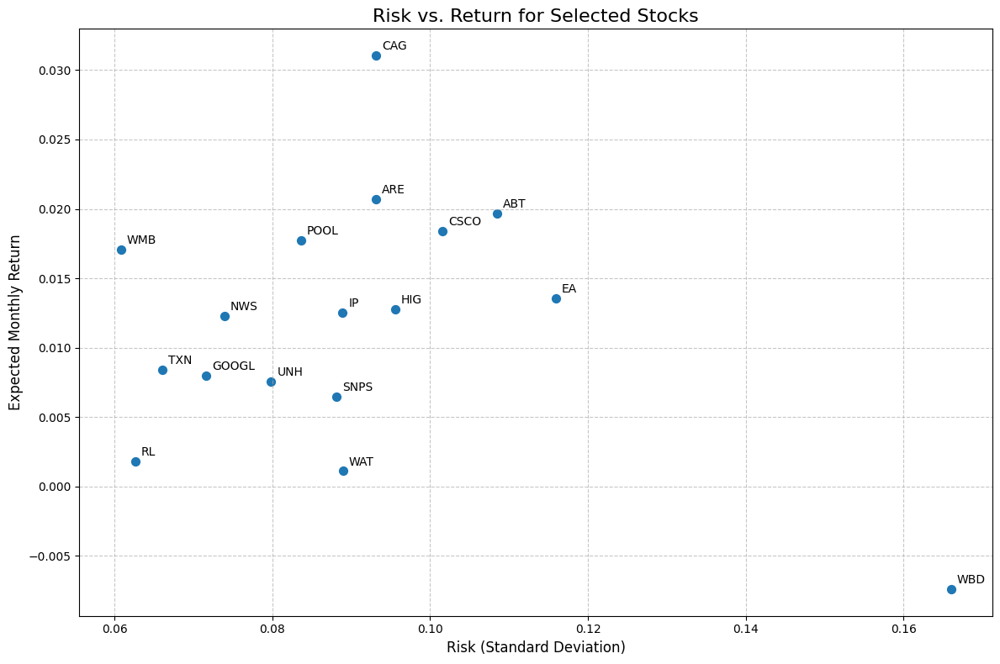

In [ ]:
# Define the list of stock tickers
tickers = ['TXN', 'WAT', 'RL', 'UNH', 'GOOGL', 'POOL', 'IP', 'SNPS', 'ABT', 'CSCO',
           'EA', 'CAG', 'NWS', 'WMB', 'HIG', 'WBD', 'ARE']

# Download historical data
data = yf.download(tickers, start="2020-01-01", end="2023-12-31")['Adj Close']

# Calculate monthly returns
monthly_returns = data.resample('M').last().pct_change().dropna()

# Calculate mean returns and standard deviations
mean_returns = monthly_returns.mean()
std_returns = monthly_returns.std()

# Create the scatter plot
plt.figure(figsize=(12, 8))
plt.scatter(std_returns, mean_returns, s=50)

# Add labels for each point
for i, ticker in enumerate(tickers):
    plt.annotate(ticker, (std_returns[i], mean_returns[i]), xytext=(5, 5),
                 textcoords='offset points')

# Set labels and title
plt.xlabel('Risk (Standard Deviation)', fontsize=12)
plt.ylabel('Expected Monthly Return', fontsize=12)
plt.title('Risk vs. Return for Selected Stocks', fontsize=16)

# Add a grid
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

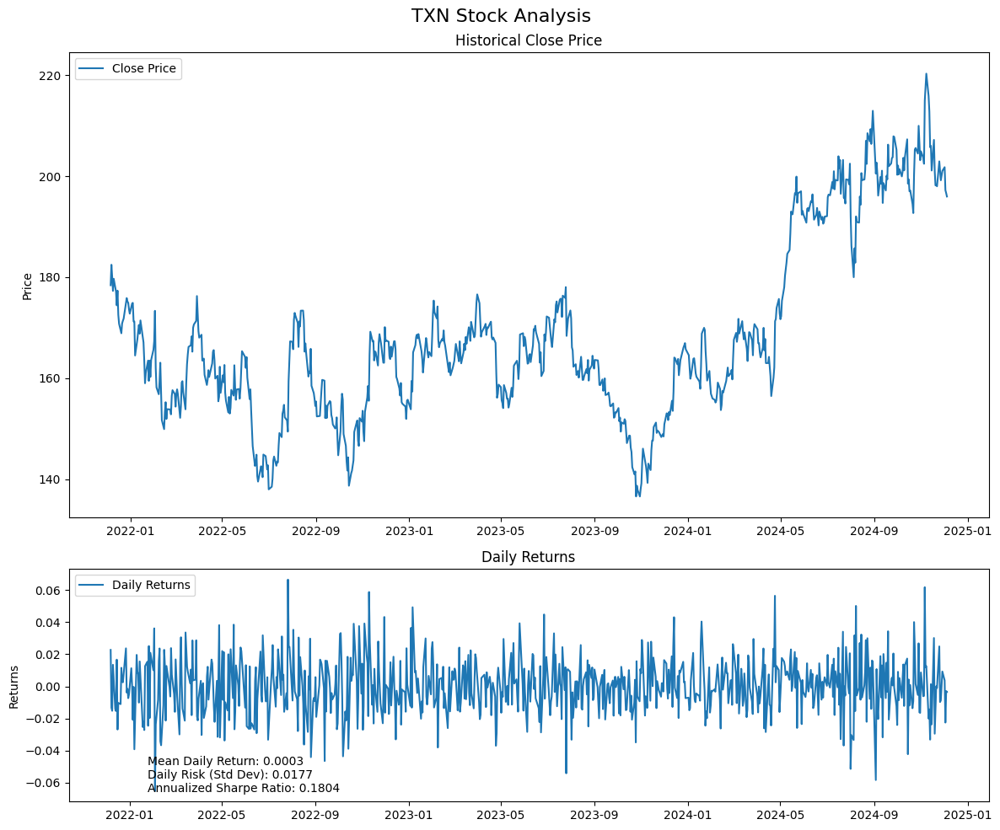

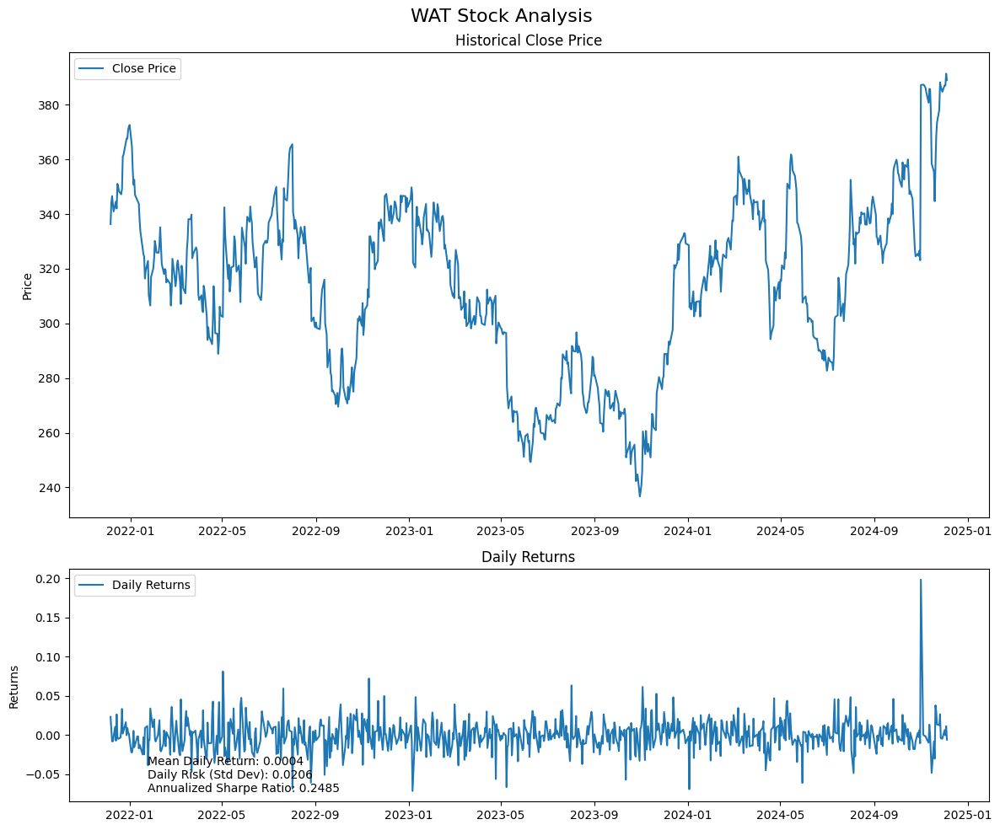

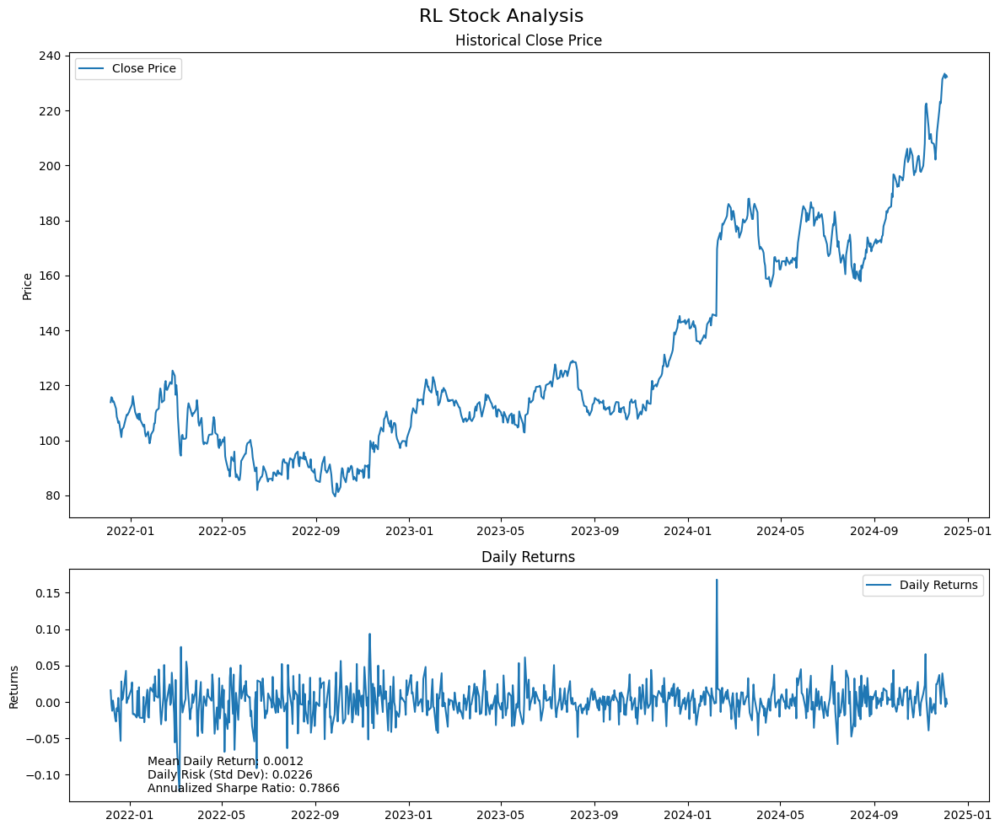

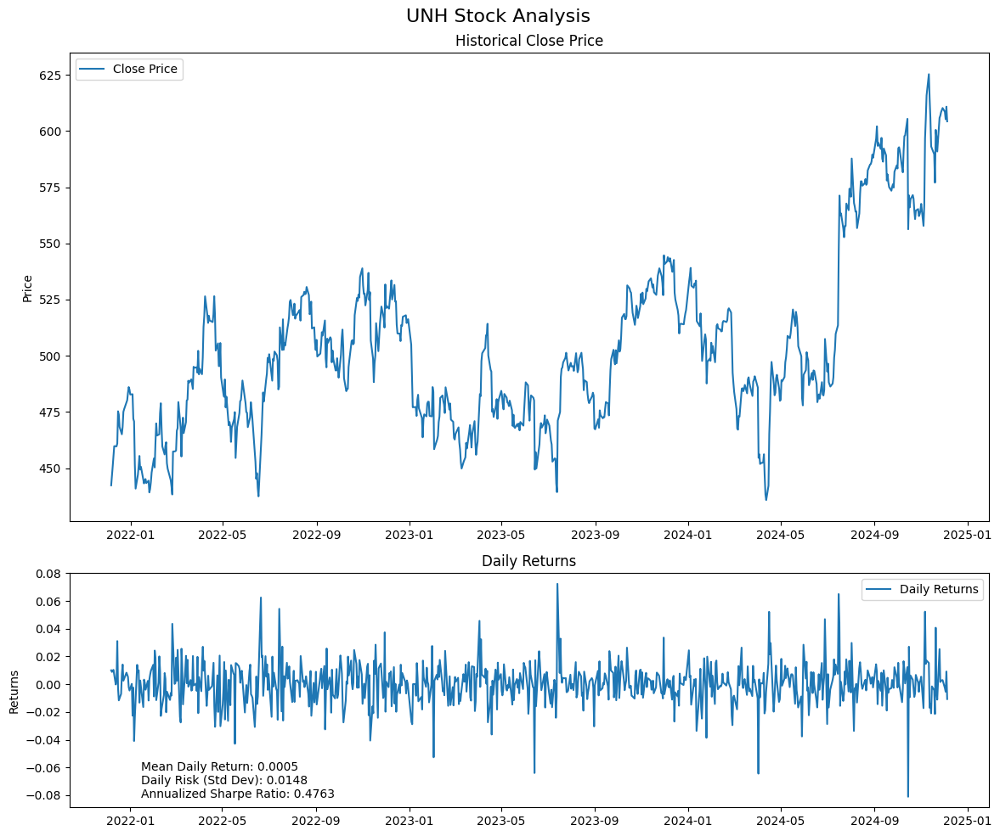

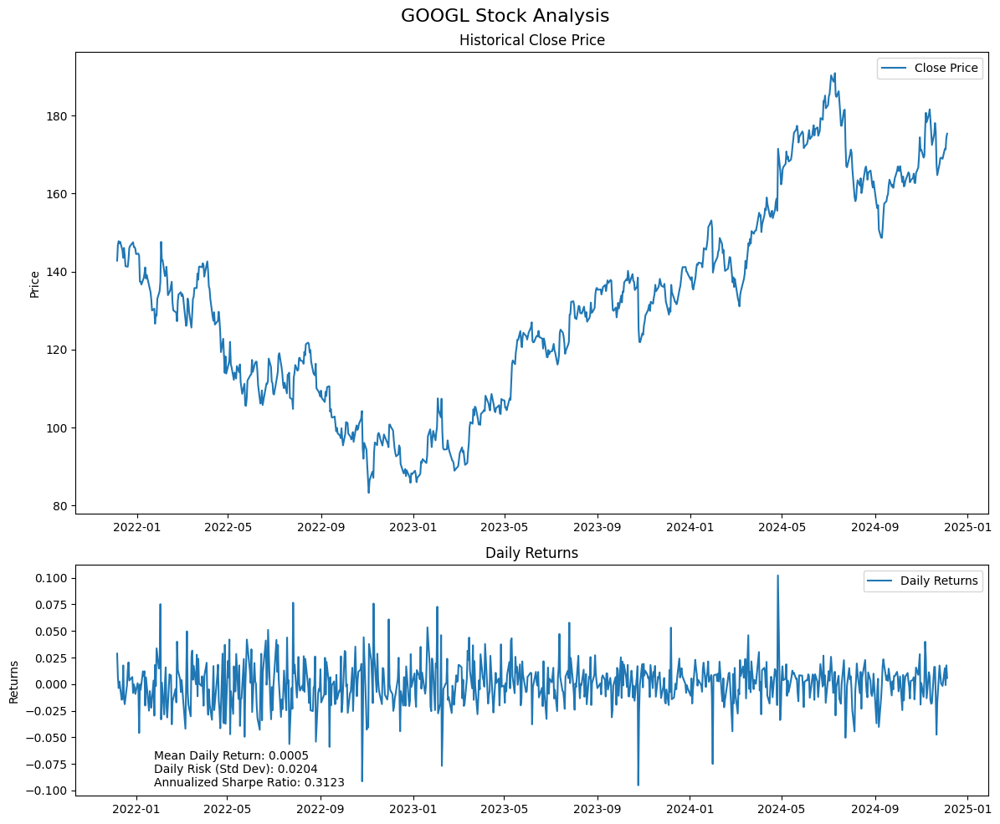

...

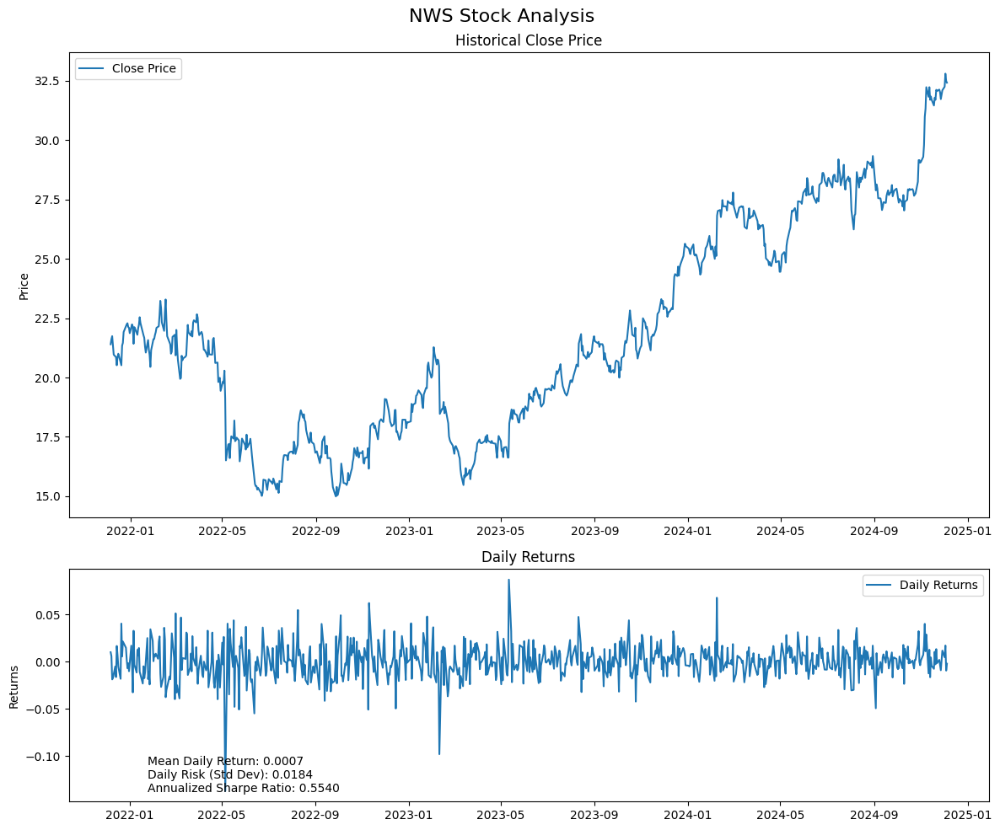

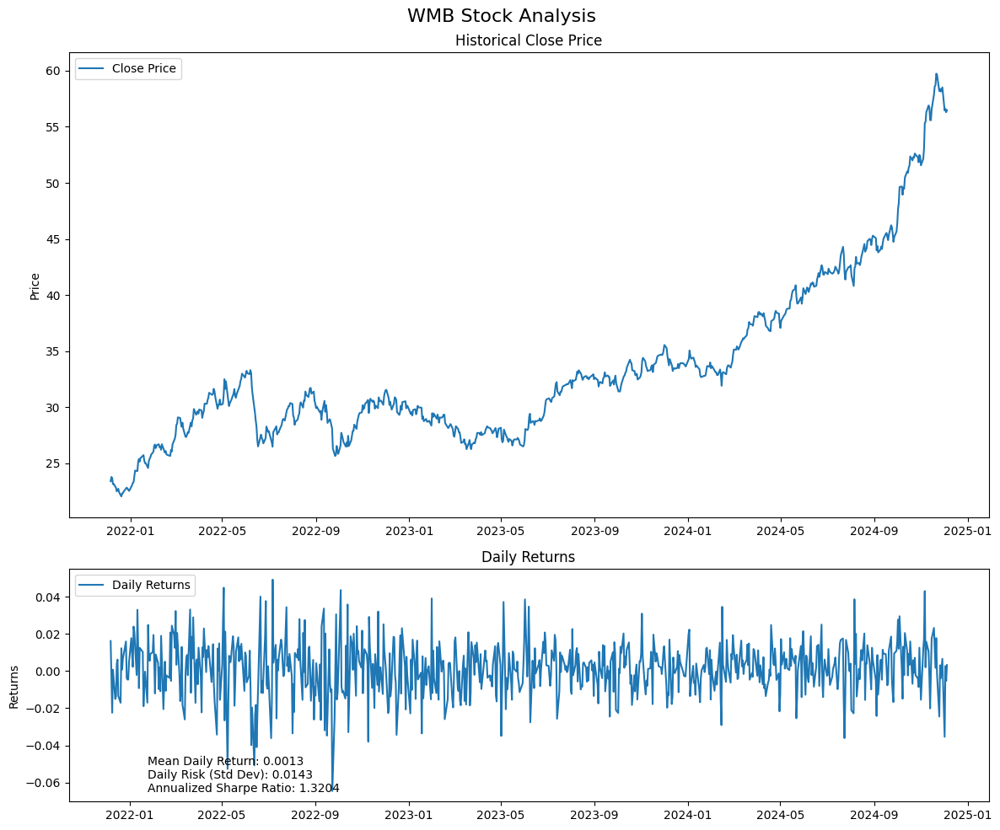

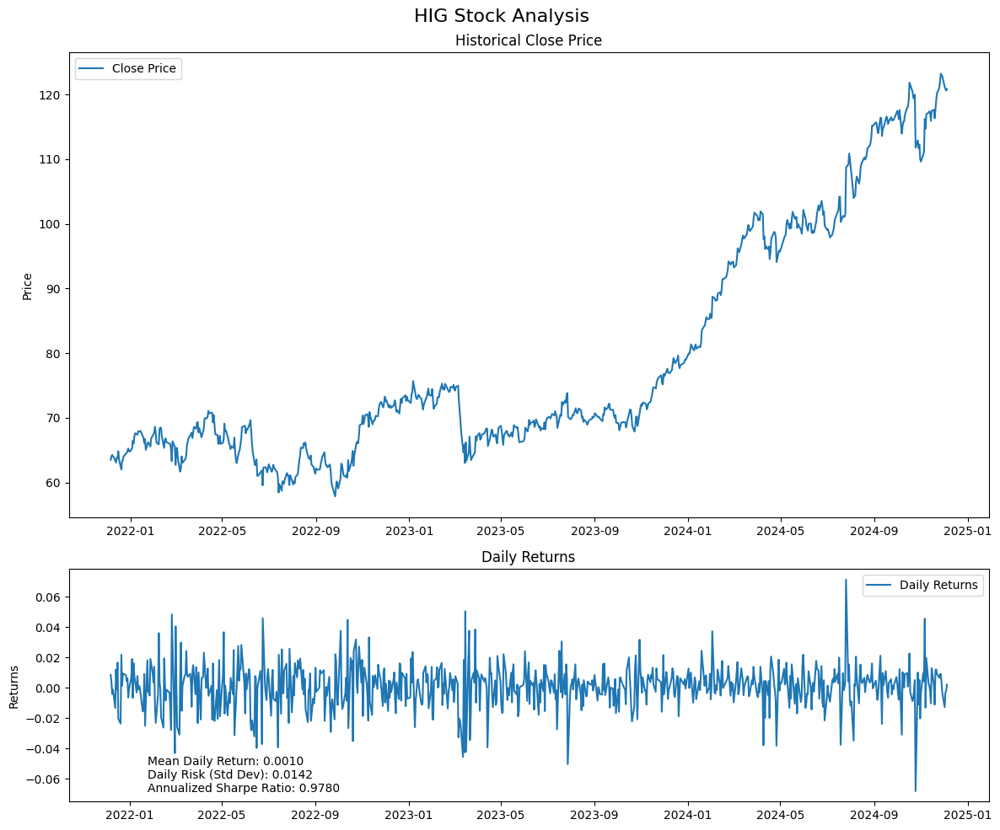

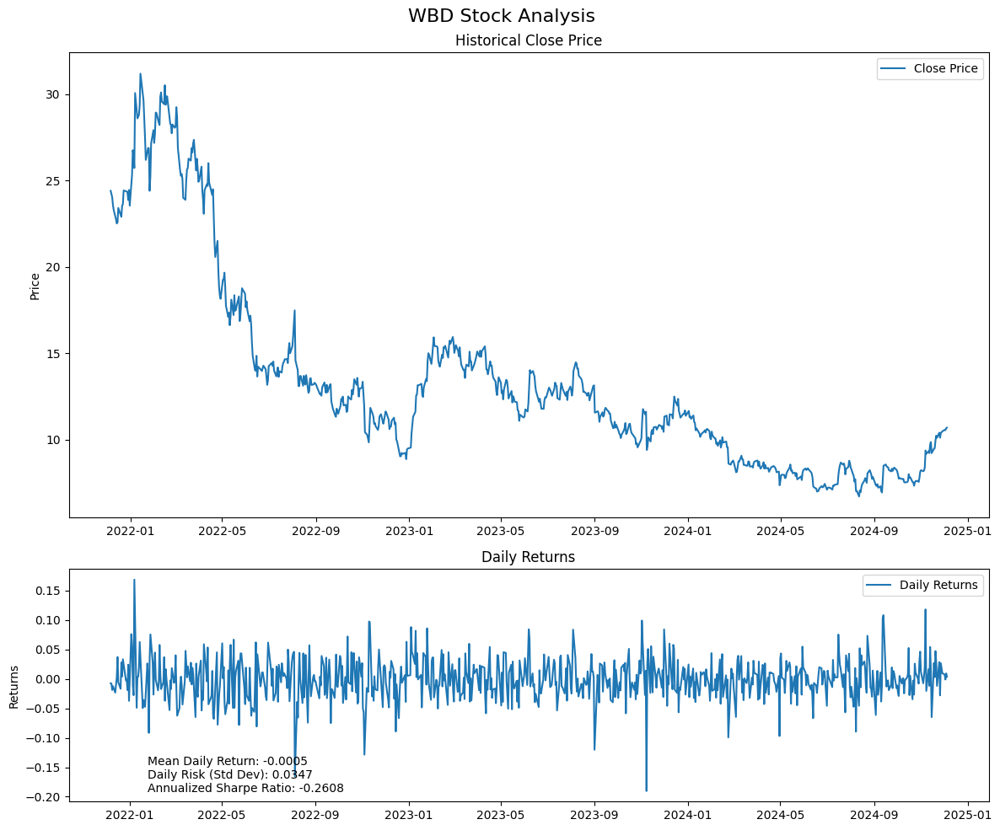

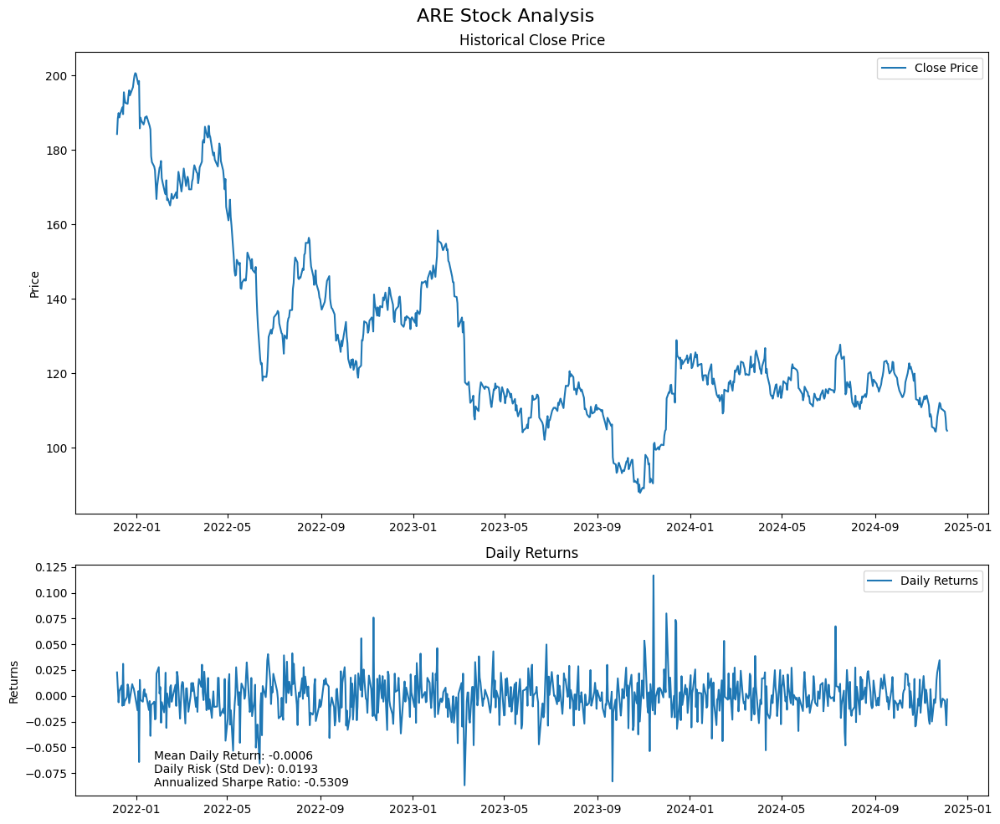

In [ ]:
# Define the list of stock tickers
tickers = ['TXN', 'WAT', 'RL', 'UNH', 'GOOGL', 'POOL', 'IP', 'SNPS', 'ABT', 'CSCO',
           'EA', 'CAG', 'NWS', 'WMB', 'HIG', 'WBD', 'ARE']

# Set the date range
end_date = datetime.now()
start_date = end_date - timedelta(days=365*3)  # 3 years of data

# Function to create a graph for a single stock
def plot_stock_data(ticker):
    # Download data
    stock = yf.Ticker(ticker)
    hist = stock.history(start=start_date, end=end_date)

    # Calculate returns
    hist['Returns'] = hist['Close'].pct_change()

    # Create subplots
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), gridspec_kw={'height_ratios': [2, 1]})
    fig.suptitle(f'{ticker} Stock Analysis', fontsize=16)

    # Plot price data
    ax1.plot(hist.index, hist['Close'], label='Close Price')
    ax1.set_ylabel('Price')
    ax1.set_title('Historical Close Price')
    ax1.legend()

    # Plot returns
    ax2.plot(hist.index, hist['Returns'], label='Daily Returns')
    ax2.set_ylabel('Returns')
    ax2.set_title('Daily Returns')
    ax2.legend()

    # Calculate and display statistics
    mean_return = hist['Returns'].mean()
    std_return = hist['Returns'].std()
    sharpe_ratio = (mean_return - 0.02/252) / std_return * np.sqrt(252)  # Assuming 252 trading days and 2% risk-free rate

    stats_text = f'Mean Daily Return: {mean_return:.4f}\n'
    stats_text += f'Daily Risk (Std Dev): {std_return:.4f}\n'
    stats_text += f'Annualized Sharpe Ratio: {sharpe_ratio:.4f}'

    plt.figtext(0.15, 0.05, stats_text, fontsize=10, ha='left')

    plt.tight_layout()
    plt.show()

# Create a graph for each stock
for ticker in tickers:
    plot_stock_data(ticker)

***Comparasion between the Portofolio and its market (S&P500)***

[*********************100%***********************]  1 of 1 completed
<ipython-input-19-4e8bfab32362>:30: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  market_expected_return = float(market_expected_return)
<ipython-input-19-4e8bfab32362>:31: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  market_risk = float(market_risk)


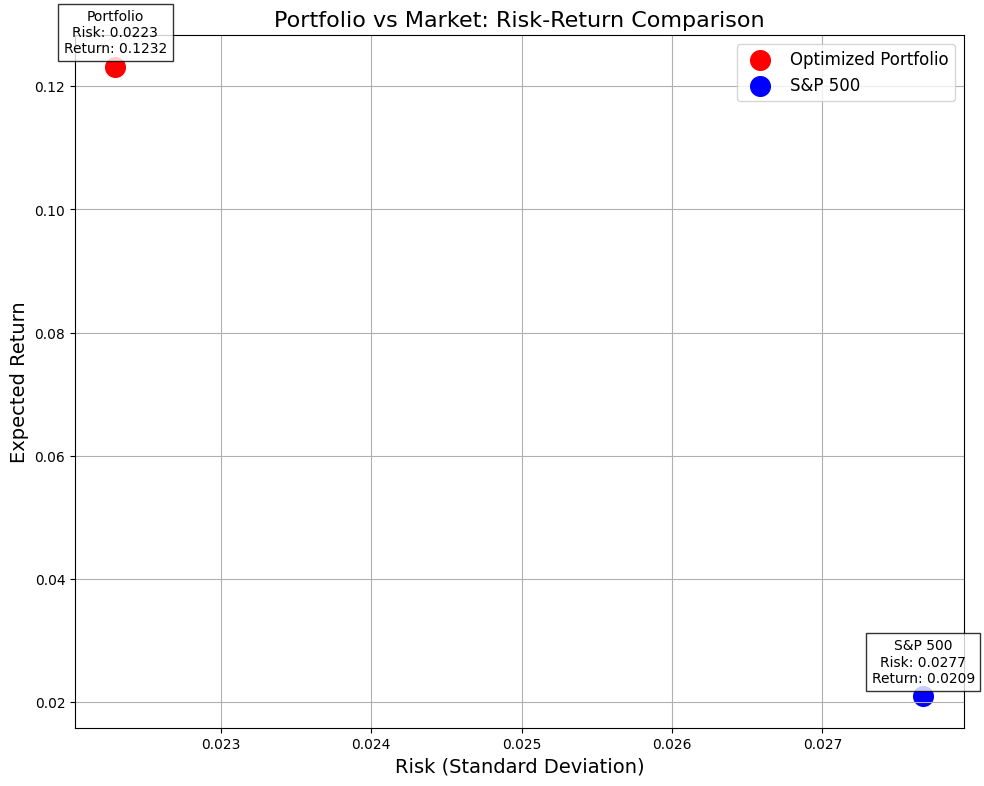


Comparative Statistics:
                Expected Return       Risk    Sharpe Ratio
-------------------------------------------------------
Portfolio                0.1232     0.0223          4.6240
S&P 500                  0.0209     0.0277          0.6940


In [ ]:
# Define the portfolio
portfolio = pd.DataFrame([
    ('TXN', 0.048444), ('WAT', 0.048295), ('RL', 0.042925), ('UNH', 0.041199),
    ('GOOGL', 0.039391), ('POOL', 0.037515), ('IP', 0.036977), ('SNPS', 0.036687),
    ('ABT', 0.035723), ('CSCO', 0.035606), ('EA', 0.034537), ('CAG', 0.033438),
    ('NWS', 0.032660), ('WMB', 0.031940), ('HIG', 0.031398), ('WBD', 0.031060),
    ('ARE', 0.030707)
], columns=['Ticker', 'Weight'])

# Portfolio metrics
portfolio_expected_return = 0.1232
portfolio_risk = 0.0223
portfolio_sharpe = 4.6240

# Step 1: Define the date range for historical data
end_date = datetime.now().strftime('%Y-%m-%d')
start_date = (datetime.now() - timedelta(days=365)).strftime('%Y-%m-%d')  # One year of data

# Step 2: Fetch historical data for the market indicator
market_data = yf.download('^GSPC', start=start_date, end=end_date)['Adj Close']

# Step 3: Calculate monthly returns for the market
market_monthly_returns = market_data.resample('ME').last().pct_change().dropna()

# Step 4: Calculate market expected return and risk
market_expected_return = market_monthly_returns.mean()
market_risk = market_monthly_returns.std()

# Convert to scalar values
market_expected_return = float(market_expected_return)
market_risk = float(market_risk)

# Step 5: Create the scatter plot
plt.figure(figsize=(10, 8))

# Plot the portfolio
plt.scatter(portfolio_risk, portfolio_expected_return, color='red', s=200, label="Optimized Portfolio")

# Plot the market (S&P 500)
plt.scatter(market_risk, market_expected_return, color='blue', s=200, label="S&P 500")

# Step 6: Add labels and title
plt.title("Portfolio vs Market: Risk-Return Comparison", fontsize=16)
plt.xlabel("Risk (Standard Deviation)", fontsize=14)
plt.ylabel("Expected Return", fontsize=14)

# Step 7: Annotate the points
def annotate_point(x, y, name):
    plt.annotate(
        f"{name}\nRisk: {x:.4f}\nReturn: {y:.4f}",
        (x, y),
        textcoords="offset points",
        xytext=(0, 10),
        ha='center',
        fontsize=10,
        bbox=dict(facecolor='white', alpha=0.8, edgecolor='black')
    )

annotate_point(portfolio_risk, portfolio_expected_return, "Portfolio")
annotate_point(market_risk, market_expected_return, "S&P 500")

# Step 8: Add a legend
plt.legend(fontsize=12)

# Step 9: Show the plot
plt.grid(True)
plt.tight_layout()
plt.show()

# Step 10: Print comparative statistics
print("\nComparative Statistics:")
print(f"{'':15} {'Expected Return':>15} {'Risk':>10} {'Sharpe Ratio':>15}")
print("-" * 55)
print(f"{'Portfolio':15} {portfolio_expected_return:15.4f} {portfolio_risk:10.4f} {portfolio_sharpe:15.4f}")
print(f"{'S&P 500':15} {market_expected_return:15.4f} {market_risk:10.4f} {(market_expected_return - 0.02/12) / market_risk:15.4f}")

## ***2- Alternatively, apply your own strategy to select a combination of stocks***

***Without using the sharpe ratio, I would have set up my portofolio with two restrictions:***

*   ***Expected return superior to 20%***
*   ***Between 10 and 20 stocks***



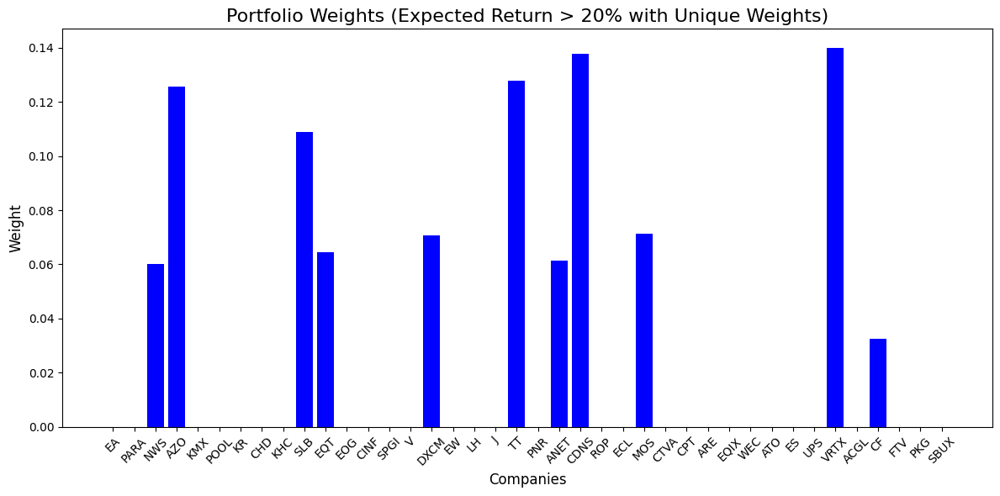

In [ ]:
# Step 1: Load the monthly returns data
# Assume `monthly_returns` is already prepared with historical returns
monthly_returns = monthly_returns.dropna()  # Ensure no NaN values

# Step 2: Calculate the mean and covariance of returns
mean_returns = monthly_returns.mean()  # Expected returns for each asset
cov_matrix = monthly_returns.cov()     # Covariance matrix
num_assets = len(mean_returns)         # Number of assets

# Step 3: Define portfolio performance metrics
def portfolio_performance(weights, mean_returns, cov_matrix):
    """
    Calculate portfolio performance (expected return and risk).
    """
    expected_return = np.dot(weights, mean_returns)
    risk = np.sqrt(np.dot(weights.T, np.dot(cov_matrix, weights)))
    return expected_return, risk

# Step 4: Define the objective function for portfolio variance
def portfolio_variance(weights, mean_returns, cov_matrix):
    """
    Minimize portfolio variance (risk).
    """
    return np.dot(weights.T, np.dot(cov_matrix, weights))

# Step 5: Define constraints and bounds
return_target = 0.20  # Target return (20%)
max_weight = 0.1  # Maximum weight for any stock (10%)
constraints = [
    {'type': 'eq', 'fun': lambda weights: np.sum(weights) - 1},  # Weights sum to 1
    {'type': 'ineq', 'fun': lambda weights: np.dot(weights, mean_returns) - return_target}  # Expected return >= target
]
bounds = tuple((0, max_weight * np.random.uniform(0.5, 1.5)) for _ in range(num_assets))  # Diversify with unique max weight
initial_weights = np.array([1/num_assets] * num_assets)

# Step 6: Optimize for minimum risk with return constraint
optimized_result = minimize(
    portfolio_variance,
    initial_weights,
    args=(mean_returns, cov_matrix),
    method='SLSQP',
    bounds=bounds,
    constraints=constraints
)

# Step 7: Extract optimized weights
weights_constrained = optimized_result.x
expected_return_constrained, risk_constrained = portfolio_performance(weights_constrained, mean_returns, cov_matrix)

# Step 8: Create a DataFrame with the portfolio
final_portfolio = pd.DataFrame({
    'Company': mean_returns.index,  # Companies (tickers)
    'Weight': weights_constrained
})
final_portfolio = final_portfolio[final_portfolio['Weight'] > 0]  # Exclude companies with zero weight

# Step 10: Visualize the portfolio weights in a bar graph
plt.figure(figsize=(12, 6))
plt.bar(final_portfolio['Company'], final_portfolio['Weight'], color='blue')
plt.title("Portfolio Weights (Expected Return > 20% with Unique Weights)", fontsize=16)
plt.xlabel("Companies", fontsize=12)
plt.ylabel("Weight", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
# Step 1: Sort the portfolio by weight in descending order
final_portfolio_sorted = final_portfolio.sort_values(by="Weight", ascending=False)

# Step 2: Select the top 10 stocks
top_10_portfolio = final_portfolio_sorted.head(10)

# Step 3: Display the table with the top 10 stocks
styled_top_10 = (
    top_10_portfolio.style
    .set_caption("Top 10 Stocks in the Optimized Portfolio")
    .set_table_styles([{
        'selector': 'caption',
        'props': [('font-size', '16px'), ('text-align', 'center'), ('color', 'black')]
    }])
    .format(precision=4)  # Format weights to 4 decimal places
)
print(f"Expected Portfolio Return: {expected_return_constrained:.4f}")


display(styled_top_10)

Expected Portfolio Return: 0.0239


,Company,Weight
34,VRTX,0.1399
22,CDNS,0.1377
19,TT,0.1277
3,AZO,0.1257
9,SLB,0.1088
25,MOS,0.0712
15,DXCM,0.0706
10,EQT,0.0645
21,ANET,0.0613
2,NWS,0.0600


## ***3- Backtest the portfolio performance over the last 2 years***

***Step 1- Portofolio and market performances over the 2 last years***




[*********************100%***********************]  18 of 18 completed
<ipython-input-23-1b1abaac097c>:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  total_return = cumulative_return[-1] - 1


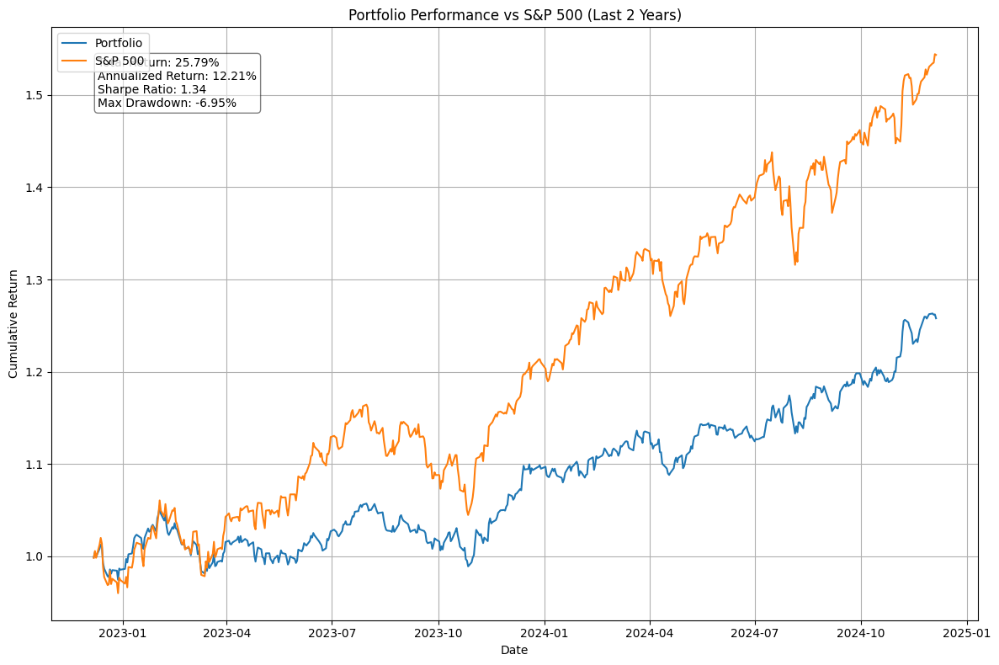


Portfolio Performance Summary:
Total Return: 25.79%
Annualized Return: 12.21%
Sharpe Ratio: 1.34
Maximum Drawdown: -6.95%


In [ ]:
# Define the portfolio
portfolio = {
    'TXN': 0.048444, 'WAT': 0.048295, 'RL': 0.042925, 'UNH': 0.041199,
    'GOOGL': 0.039391, 'POOL': 0.037515, 'IP': 0.036977, 'SNPS': 0.036687,
    'ABT': 0.035723, 'CSCO': 0.035606, 'EA': 0.034537, 'CAG': 0.033438,
    'NWS': 0.032660, 'WMB': 0.031940, 'HIG': 0.031398, 'WBD': 0.031060,
    'ARE': 0.030707
}

# Set date range
end_date = datetime.now()
start_date = end_date - timedelta(days=365*2)  # 2 years

# Download historical data
data = yf.download(list(portfolio.keys()) + ['^GSPC'], start=start_date, end=end_date)['Adj Close']

# Calculate daily returns
returns = data.pct_change().dropna()

# Calculate portfolio returns
portfolio_return = returns[portfolio.keys()].dot(pd.Series(portfolio))

# Calculate cumulative returns
cumulative_return = (1 + portfolio_return).cumprod()
cumulative_sp500 = (1 + returns['^GSPC']).cumprod()

# Calculate metrics
total_return = cumulative_return[-1] - 1
annualized_return = (1 + total_return) ** (252 / len(returns)) - 1
sharpe_ratio = np.sqrt(252) * portfolio_return.mean() / portfolio_return.std()
max_drawdown = (cumulative_return / cumulative_return.cummax() - 1).min()

# Plotting
plt.figure(figsize=(12, 8))
plt.plot(cumulative_return, label='Portfolio')
plt.plot(cumulative_sp500, label='S&P 500')
plt.title('Portfolio Performance vs S&P 500 (Last 2 Years)')
plt.xlabel('Date')
plt.ylabel('Cumulative Return')
plt.legend()
plt.grid(True)

# Add performance metrics to the plot
metrics = f'Total Return: {total_return:.2%}\n'
metrics += f'Annualized Return: {annualized_return:.2%}\n'
metrics += f'Sharpe Ratio: {sharpe_ratio:.2f}\n'
metrics += f'Max Drawdown: {max_drawdown:.2%}'
plt.text(0.05, 0.95, metrics, transform=plt.gca().transAxes, verticalalignment='top',
         bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

plt.tight_layout()
plt.show()

# Print performance summary
print("\nPortfolio Performance Summary:")
print(f"Total Return: {total_return:.2%}")
print(f"Annualized Return: {annualized_return:.2%}")
print(f"Sharpe Ratio: {sharpe_ratio:.2f}")
print(f"Maximum Drawdown: {max_drawdown:.2%}")

***Step 2- Returns forecasted according to the expectations***




                  Metric Portfolio S&P 500
    Annual Return (2025)    11-13%    9.8%
    Annual Return (2026)    11-13%    9.8%
Cumulative Return (2026)    23-27%   20.6%


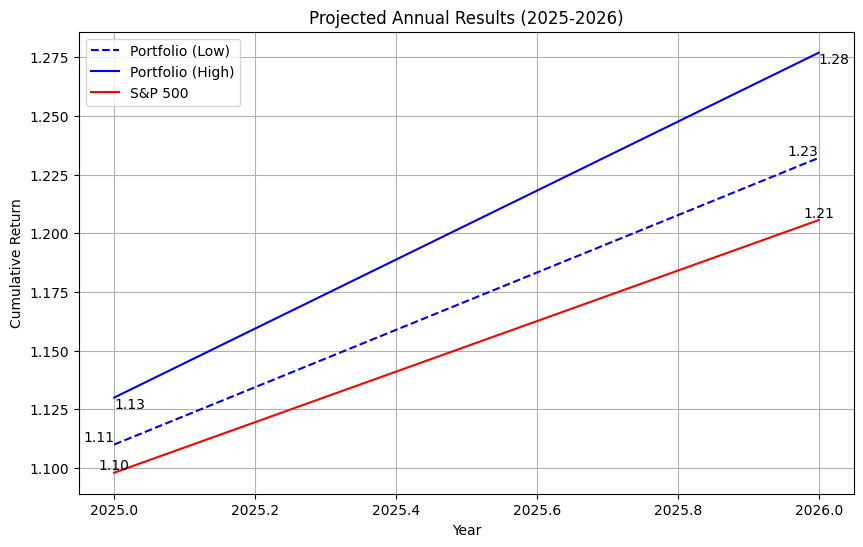

In [ ]:
# Create a DataFrame with the assumptions
assumptions = pd.DataFrame({
    'Metric': ['Annual Return (2025)', 'Annual Return (2026)', 'Cumulative Return (2026)'],
    'Portfolio': ['11-13%', '11-13%', '23-27%'],
    'S&P 500': ['9.8%', '9.8%', '20.6%']
})

# Display the stylized table
print(assumptions.to_string(index=False))

# Create data for the graph
years = [2025, 2026]
portfolio_low = [1.11, 1.11 * 1.11]
portfolio_high = [1.13, 1.13 * 1.13]
market = [1.098, 1.098 * 1.098]

# Create the graph
plt.figure(figsize=(10, 6))
plt.plot(years, portfolio_low, 'b--', label='Portfolio (Low)')
plt.plot(years, portfolio_high, 'b-', label='Portfolio (High)')
plt.plot(years, market, 'r-', label='S&P 500')

plt.title('Projected Annual Results (2025-2026)')
plt.xlabel('Year')
plt.ylabel('Cumulative Return')
plt.legend()
plt.grid(True)

# Add value labels
for i, year in enumerate(years):
    plt.text(year, portfolio_low[i], f'{portfolio_low[i]:.2f}', ha='right', va='bottom')
    plt.text(year, portfolio_high[i], f'{portfolio_high[i]:.2f}', ha='left', va='top')
    plt.text(year, market[i], f'{market[i]:.2f}', ha='center', va='bottom')

plt.show()

# ***Task 5***

---



## ***1- Calculate the portfolio’s Sharpe Ratio, Beta, and Value at Risk (VaR)***


Portfolio Metrics:
╒════════════════════╤═════════╕
│ Metric             │   Value │
╞════════════════════╪═════════╡
│ Expected Return    │  0.1232 │
├────────────────────┼─────────┤
│ Risk-Free Rate     │  0.025  │
├────────────────────┼─────────┤
│ Standard Deviation │  0.0223 │
├────────────────────┼─────────┤
│ Sharpe Ratio       │  4.4036 │
├────────────────────┼─────────┤
│ Portfolio Beta     │  0.6824 │
╘════════════════════╧═════════╛

Value at Risk (VaR):
╒════════════════════╤════════════╕
│ Confidence Level   │ VaR ($)    │
╞════════════════════╪════════════╡
│ 95%                │ $36,683.50 │
├────────────────────┼────────────┤
│ 99%                │ $51,959.00 │
├────────────────────┼────────────┤
│ 99.9%              │ $68,907.00 │
╘════════════════════╧════════════╛


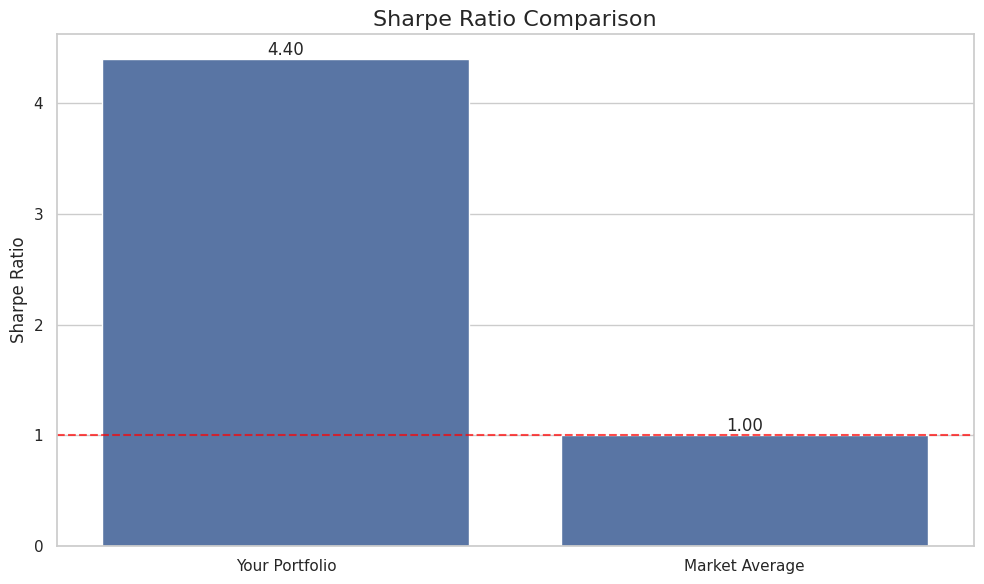

<ipython-input-29-4547e9cc5927>:80: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=np.random.normal(1, 0.3, 1000), shade=True, color='gray', alpha=0.5, ax=ax)


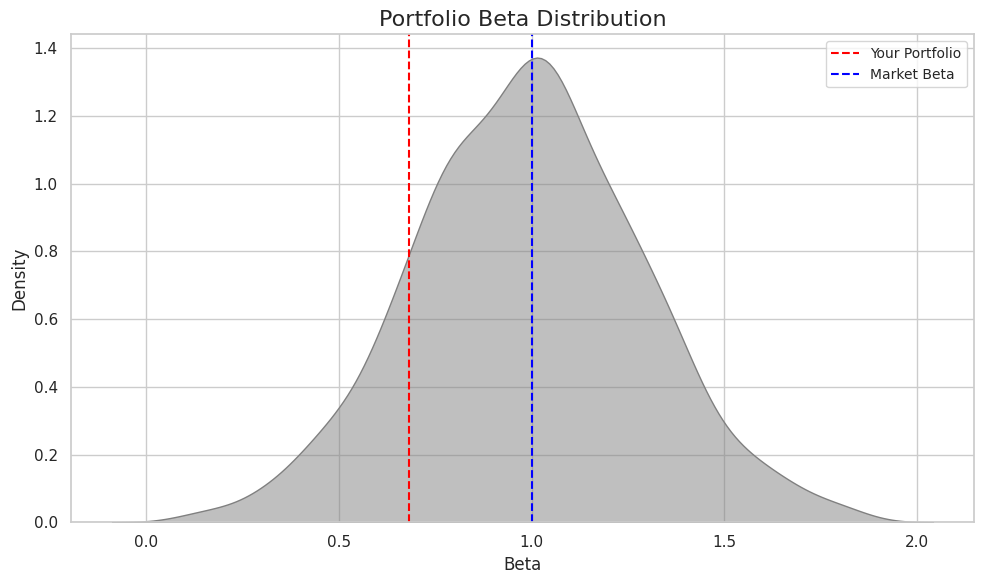

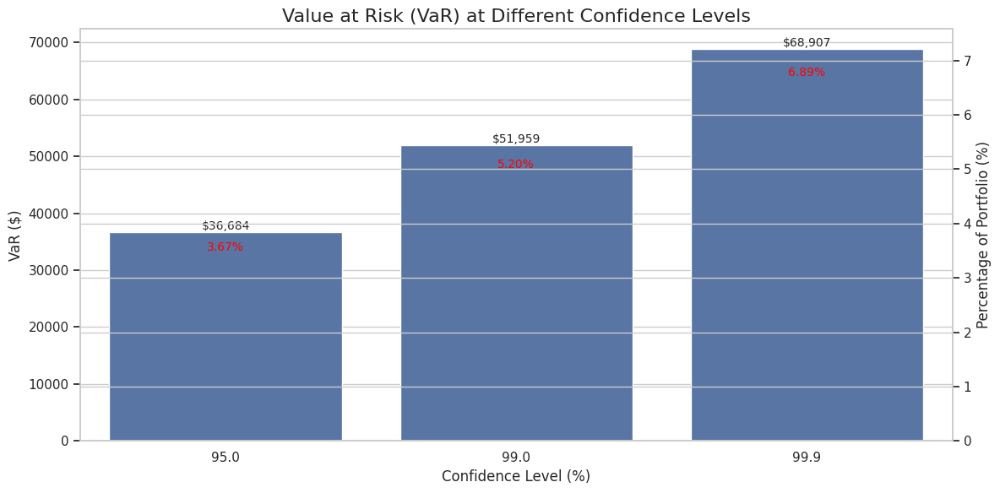

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tabulate import tabulate

# Define portfolio weights and betas (example values)
portfolio = {
    'TXN': 0.048444, 'WAT': 0.048295, 'RL': 0.042925, 'UNH': 0.041199,
    'GOOGL': 0.039391, 'POOL': 0.037515, 'IP': 0.036977, 'SNPS': 0.036687,
    'ABT': 0.035723, 'CSCO': 0.035606, 'EA': 0.034537, 'CAG': 0.033438,
    'NWS': 0.032660, 'WMB': 0.031940, 'HIG': 0.031398, 'WBD': 0.031060,
    'ARE': 0.030707
}

betas = {
    'TXN': 1.2, 'WAT': 0.9, 'RL': 1.1, 'UNH': 0.8,
    'GOOGL': 1.3, 'POOL': 1.2, 'IP': 1.1, 'SNPS': 1.4,
    'ABT': 0.7, 'CSCO': 1.0, 'EA': 1.2, 'CAG': 0.9,
    'NWS': 1.3, 'WMB': 1.1, 'HIG': 1.2, 'WBD': 1.3,
    'ARE': 0.8
}

# Portfolio metrics (assumed values)
expected_return = 0.1232   # Annualized return (12.32%)
risk_free_rate = 0.025     # Risk-free rate (2.5%)
std_dev = 0.0223           # Annualized standard deviation (2.23%)

# Calculate Sharpe Ratio
sharpe_ratio = (expected_return - risk_free_rate) / std_dev

# Calculate Portfolio Beta
portfolio_beta = sum([weight * betas[ticker] for ticker, weight in portfolio.items()])

# Value at Risk (VaR) Calculation
initial_investment = 1_000_000   # $1 million investment
confidence_levels = [95, 99, 99.9]   # Confidence levels
z_scores = {95: 1.645, 99: 2.33, 99.9: 3.09}   # Z-scores for confidence levels

# Calculate VaR for each confidence level
var_values = {}
for level in confidence_levels:
    z = z_scores[level]
    var_values[level] = initial_investment * (z * std_dev)

# Display Results in Stylized Tables
print("\nPortfolio Metrics:")
metrics_data = [
    ["Metric", "Value"],
    ["Expected Return", f"{expected_return:.4f}"],
    ["Risk-Free Rate", f"{risk_free_rate:.4f}"],
    ["Standard Deviation", f"{std_dev:.4f}"],
    ["Sharpe Ratio", f"{sharpe_ratio:.4f}"],
    ["Portfolio Beta", f"{portfolio_beta:.4f}"]
]
print(tabulate(metrics_data, headers="firstrow", tablefmt="fancy_grid"))

print("\nValue at Risk (VaR):")
var_data = [["Confidence Level", "VaR ($)"]] + [
    [f"{level}%", f"${var_values[level]:,.2f}"] for level in confidence_levels
]
print(tabulate(var_data, headers="firstrow", tablefmt="fancy_grid"))

# Set the style for all plots
sns.set_theme(style="whitegrid")

# 1. Sharpe Ratio Visualization
fig, ax = plt.subplots(figsize=(10, 6))
sns.barplot(x=['Your Portfolio', 'Market Average'], y=[sharpe_ratio, 1], ax=ax)
ax.axhline(y=1, color='red', linestyle='--', alpha=0.7)
ax.set_title('Sharpe Ratio Comparison', fontsize=16)
ax.set_ylabel('Sharpe Ratio', fontsize=12)
for i, v in enumerate([sharpe_ratio, 1]):
    ax.text(i, v, f'{v:.2f}', ha='center', va='bottom', fontsize=12)
plt.tight_layout()
plt.show()

# 2. Portfolio Beta Visualization
fig, ax = plt.subplots(figsize=(10, 6))
sns.kdeplot(data=np.random.normal(1, 0.3, 1000), shade=True, color='gray', alpha=0.5, ax=ax)
ax.axvline(x=portfolio_beta, color='red', linestyle='--', label='Your Portfolio')
ax.axvline(x=1, color='blue', linestyle='--', label='Market Beta')
ax.set_title('Portfolio Beta Distribution', fontsize=16)
ax.set_xlabel('Beta', fontsize=12)
ax.set_ylabel('Density', fontsize=12)
ax.legend(fontsize=10)
plt.tight_layout()
plt.show()

# 3. Value at Risk (VaR) Visualization
var_values_list = [var_values[level] for level in confidence_levels]

fig, ax = plt.subplots(figsize=(12, 6))
sns.barplot(x=confidence_levels, y=var_values_list, ax=ax)
ax.set_title('Value at Risk (VaR) at Different Confidence Levels', fontsize=16)
ax.set_xlabel('Confidence Level (%)', fontsize=12)
ax.set_ylabel('VaR ($)', fontsize=12)
for i, v in enumerate(var_values_list):
    ax.text(i, v, f'${v:,.0f}', ha='center', va='bottom', fontsize=10)

# Add a secondary axis for percentage of portfolio
ax2 = ax.twinx()
percentages = [v / initial_investment * 100 for v in var_values_list]
ax2.set_ylabel('Percentage of Portfolio (%)', fontsize=12)
ax2.set_ylim(0, max(percentages) * 1.1)
for i, p in enumerate(percentages):
    ax2.text(i, p, f'{p:.2f}%', ha='center', va='top', fontsize=10, color='red')

plt.tight_layout()
plt.show()

## ***2- Provide your interpretation of these risk metrics***

In [ ]:
# Define the risk metrics
sharpe_ratio = 4.4036
portfolio_beta = 0.6824
var_values = {
    95: 36683.50,
    99: 51959.00,
    99.9: 68907.00
}

# Function to interpret the risk metrics
def interpret_risk_metrics(sharpe_ratio, portfolio_beta, var_values):
    interpretation = []

    # Interpret Sharpe Ratio
    if sharpe_ratio > 4:
        interpretation.append("The Sharpe Ratio of {:.4f} indicates outstanding risk-adjusted returns, suggesting that the portfolio is yielding significantly higher returns per unit of risk compared to a risk-free investment.".format(sharpe_ratio))
    elif sharpe_ratio > 1:
        interpretation.append("The Sharpe Ratio of {:.4f} reflects good risk-adjusted performance, indicating that the portfolio is generating favorable returns relative to its risks.".format(sharpe_ratio))
    else:
        interpretation.append("The Sharpe Ratio of {:.4f} suggests that the portfolio's returns may not adequately compensate for the risks taken.".format(sharpe_ratio))

    # Interpret Portfolio Beta
    if portfolio_beta < 1:
        interpretation.append("With a Portfolio Beta of {:.4f}, this indicates lower volatility than the market, suggesting that the portfolio is expected to experience smaller price swings compared to overall market movements.".format(portfolio_beta))
    elif portfolio_beta == 1:
        interpretation.append("A Portfolio Beta of {:.4f} means that the portfolio's volatility is in line with the market.".format(portfolio_beta))
    else:
        interpretation.append("A Portfolio Beta of {:.4f} indicates higher volatility than the market, meaning it may experience larger price fluctuations.".format(portfolio_beta))

    # Interpret Value at Risk (VaR)
    for confidence_level, var in var_values.items():
        interpretation.append("At a {}% confidence level, the Value at Risk (VaR) is ${:.2f}, meaning there is a {}% chance that losses will not exceed this amount over a specified period.".format(confidence_level, var, 100 - confidence_level))

    return "\n".join(interpretation)

# Generate and print the interpretation
risk_interpretation = interpret_risk_metrics(sharpe_ratio, portfolio_beta, var_values)
print(risk_interpretation)

The Sharpe Ratio of 4.4036 indicates outstanding risk-adjusted returns, suggesting that the portfolio is yielding significantly higher returns per unit of risk compared to a risk-free investment.
With a Portfolio Beta of 0.6824, this indicates lower volatility than the market, suggesting that the portfolio is expected to experience smaller price swings compared to overall market movements.
At a 95% confidence level, the Value at Risk (VaR) is $36683.50, meaning there is a 5% chance that losses will not exceed this amount over a specified period.
At a 99% confidence level, the Value at Risk (VaR) is $51959.00, meaning there is a 1% chance that losses will not exceed this amount over a specified period.
At a 99.9% confidence level, the Value at Risk (VaR) is $68907.00, meaning there is a 0.09999999999999432% chance that losses will not exceed this amount over a specified period.


***I could interpret these data like this:

**- Sharpe Ratio (4.4036):**
Reflecting outstanding risk-adjusted returns, the Sharpe Ratio above 1 is generally seen as positive, and a value above 4 indicates that the portfolio is yielding significantly higher returns for each unit of risk taken compared to a risk-free investment. This suggests the portfolio is performing exceptionally well relative to the risks involved.

**- Portfolio Beta (0.6824):**
With a Beta of 0.6824, this portfolio is less volatile than the overall market. It implies that for every 1% movement in the market, the portfolio is expected to change by about 0.68%. This lower beta indicates a more conservative approach, which may help mitigate losses during market downturns while potentially limiting gains in bullish phases.

**- Value at Risk (VaR):**
The VaR metrics provide insights into potential losses at different confidence levels:
**95% VaR:   36,686.50 dollars** This means there’s a 95% chance that losses will not exceed this amount over a specified timeframe.
**99% VaR: 51,959.00 dollars:** At this level of confidence, there’s a 99% probability that losses will remain below this threshold.
**99.9% VaR: 68,907.00 dollars:** This indicates an extreme loss scenario, suggesting there’s only a 0.1% chance of exceeding this loss under normal market conditions.***

# ***Bonus Task***

---



## ***1- Train a machine learning model to predict future monthly returns based on historical data and financial ratios***

***Step 1- Past datas analysis***

[                       0%                       ]

[*********************100%***********************]  17 of 17 completed
<ipython-input-39-a4dbadac9f83>:16: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_returns = stock_data.resample('M').last().pct_change().dropna()


Stylized Monthly Returns Table:


Ticker,ABT,ARE,CAG,CSCO,EA,GOOGL,HIG,IP,NWS,POOL,RL,SNPS,TXN,UNH,WAT,WBD,WMB
Date,,,,,,,,,,,,,,,,,
2018-02-28 00:00:00+00:00,-0.0294,-0.0647,-0.0492,0.0780,-0.0257,-0.0662,-0.1006,-0.0443,-0.0602,0.0206,-0.0741,-0.0857,-0.0120,-0.0449,-0.0509,-0.0299,-0.1156
2018-03-31 00:00:00+00:00,-0.0068,0.0372,0.0208,-0.0422,-0.0199,-0.0605,-0.0204,-0.1034,-0.0124,0.0621,0.0612,-0.0169,-0.0412,-0.0506,-0.0293,-0.1188,-0.0932
2018-04-30 00:00:00+00:00,-0.0252,-0.0026,0.0109,0.0409,-0.0269,-0.0179,0.0450,-0.0350,0.0093,-0.0507,-0.0174,0.0273,-0.0237,0.1047,-0.0515,0.1036,0.0350
2018-05-31 00:00:00+00:00,0.0585,0.0028,-0.0003,-0.0357,0.1096,0.0799,-0.0235,0.0466,-0.0492,0.0327,0.2251,0.0299,0.1100,0.0216,0.0223,-0.1082,0.0439
2018-06-30 00:00:00+00:00,-0.0088,0.0176,-0.0359,0.0075,0.0772,0.0265,-0.0229,-0.0265,0.0259,0.0600,-0.0612,-0.0284,-0.0148,0.0195,0.0050,0.3039,0.0226
2018-07-31 00:00:00+00:00,0.0794,0.0101,0.0333,-0.0095,-0.0870,0.0868,0.0307,0.0317,-0.0347,0.0116,0.0737,0.0451,0.0153,0.0321,0.0190,-0.0335,0.0974
2018-08-31 00:00:00+00:00,0.0198,0.0071,0.0011,0.1296,-0.1191,0.0037,-0.0385,-0.0394,-0.1111,0.0748,-0.0161,0.1421,0.0097,0.0602,-0.0395,0.0470,-0.0054
2018-09-30 00:00:00+00:00,0.0975,-0.0124,-0.0756,0.0184,0.0624,-0.0201,-0.0081,-0.0389,0.0077,0.0160,0.0404,-0.0346,-0.0455,-0.0057,0.0274,0.1498,-0.0704
2018-10-31 00:00:00+00:00,-0.0564,-0.0283,0.0542,-0.0533,-0.2449,-0.0965,-0.0909,-0.0771,-0.0191,-0.1266,-0.0577,-0.0921,-0.1273,-0.0176,-0.0256,0.0122,-0.1052


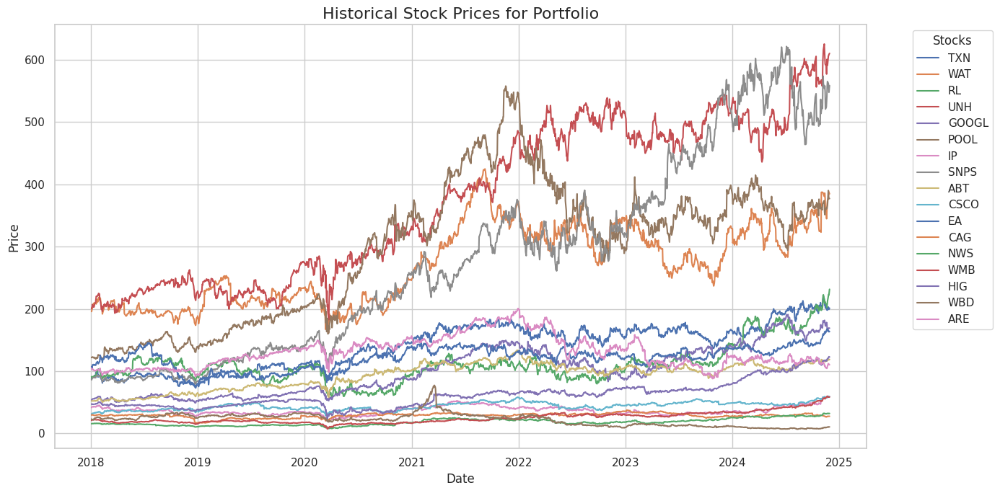

In [ ]:
# Define the portfolio
portfolio = {
    'TXN': 0.048444, 'WAT': 0.048295, 'RL': 0.042925, 'UNH': 0.041199,
    'GOOGL': 0.039391, 'POOL': 0.037515, 'IP': 0.036977, 'SNPS': 0.036687,
    'ABT': 0.035723, 'CSCO': 0.035606, 'EA': 0.034537, 'CAG': 0.033438,
    'NWS': 0.032660, 'WMB': 0.031940, 'HIG': 0.031398, 'WBD': 0.031060,
    'ARE': 0.030707
}

# Step 1: Download historical data
tickers = list(portfolio.keys())
print("Downloading stock data...")
stock_data = yf.download(tickers, start="2018-01-01", end="2024-12-01")['Adj Close']

# Step 2: Calculate monthly returns
monthly_returns = stock_data.resample('M').last().pct_change().dropna()

# Step 3: Display returns in a stylized table
monthly_returns_styled = (
    monthly_returns.style
    .set_caption("Monthly Returns for Portfolio Stocks")
    .set_table_styles([{'selector': 'caption', 'props': [('text-align', 'center'), ('font-size', '16px')]}])
    .background_gradient(cmap='coolwarm', axis=1)
    .format("{:.4f}")
)
print("Stylized Monthly Returns Table:")
display(monthly_returns_styled)

# Plot historical prices
plt.figure(figsize=(14, 7))
for ticker in tickers:
    plt.plot(stock_data[ticker], label=ticker)
plt.title("Historical Stock Prices for Portfolio", fontsize=16)
plt.xlabel("Date", fontsize=12)
plt.ylabel("Price", fontsize=12)
plt.legend(title="Stocks", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


<ipython-input-26-4c3d729a2c0e>:3: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(start='2020-01-01', periods=60, freq='M')


Data Preview:
            PE_Ratio  Debt_Equity       ROE  Monthly_Returns
2020-01-31  0.330898     0.063558  0.310982         0.034836
2020-02-29  0.325183     0.729606  0.637557         0.003087
2020-03-31  0.887213     0.472215  0.119594         0.042384
2020-04-30  0.713245     0.760785  0.561277         0.086151
2020-05-31  0.770967     0.493796  0.522733        -0.001708


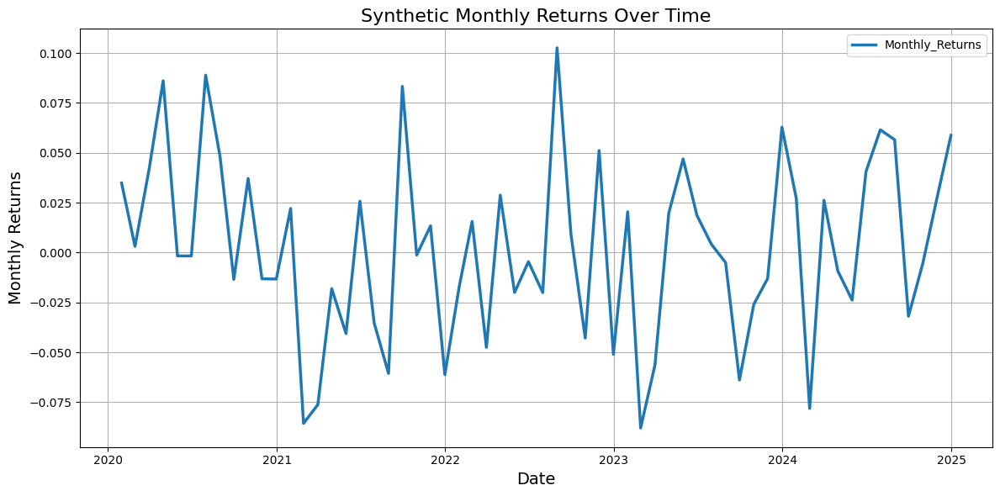

In [ ]:
# Generate synthetic historical stock data for demonstration
np.random.seed(42)
dates = pd.date_range(start='2020-01-01', periods=60, freq='M')
stock_returns = np.random.normal(0.01, 0.05, size=len(dates))  # Simulated monthly returns
financial_ratios = np.random.rand(len(dates), 3)  # Simulated financial ratios (e.g., P/E, Debt/Equity, ROE)

# Create a DataFrame
data = pd.DataFrame(financial_ratios, columns=['PE_Ratio', 'Debt_Equity', 'ROE'], index=dates)
data['Monthly_Returns'] = stock_returns

# Display the first few rows of the dataset
print("Data Preview:")
print(data.head())

# Visualize the synthetic monthly returns
plt.figure(figsize=(12, 6))
sns.lineplot(data=data[['Monthly_Returns']], palette='tab10', linewidth=2.5)
plt.title('Synthetic Monthly Returns Over Time', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Monthly Returns', fontsize=14)
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# Step 1: Add financial ratios and features (example: moving averages)
features = pd.DataFrame(index=monthly_returns.index)
for ticker in tickers:
    features[f"{ticker}_MA5"] = stock_data[ticker].rolling(window=5).mean()  # 5-day Moving Average
    features[f"{ticker}_Volatility"] = stock_data[ticker].pct_change().rolling(window=20).std()  # 20-day Volatility

# Step 2: Combine returns and features
data = monthly_returns.copy()
for feature in features.columns:
    data[feature] = features[feature]

# Step 3: Drop rows with NaN values
data = data.dropna()

# Step 4: Display feature table
feature_table_styled = (
    data.iloc[:, :12].style
    .set_caption("Sample of Engineered Features")
    .set_table_styles([{'selector': 'caption', 'props': [('text-align', 'center'), ('font-size', '16px')]}])
    .background_gradient(cmap='viridis', axis=1)
    .format("{:.4f}")
)
print("Stylized Feature Table:")
display(feature_table_styled)


Stylized Feature Table:


Ticker,ABT,ARE,CAG,CSCO,EA,GOOGL,HIG,IP,NWS,POOL,RL,SNPS
Date,,,,,,,,,,,,
2018-02-28 00:00:00+00:00,-0.0294,-0.0647,-0.0492,0.0780,-0.0257,-0.0662,-0.1006,-0.0443,-0.0602,0.0206,-0.0741,-0.0857
2018-04-30 00:00:00+00:00,-0.0252,-0.0026,0.0109,0.0409,-0.0269,-0.0179,0.0450,-0.0350,0.0093,-0.0507,-0.0174,0.0273
2018-05-31 00:00:00+00:00,0.0585,0.0028,-0.0003,-0.0357,0.1096,0.0799,-0.0235,0.0466,-0.0492,0.0327,0.2251,0.0299
2018-07-31 00:00:00+00:00,0.0794,0.0101,0.0333,-0.0095,-0.0870,0.0868,0.0307,0.0317,-0.0347,0.0116,0.0737,0.0451
2018-08-31 00:00:00+00:00,0.0198,0.0071,0.0011,0.1296,-0.1191,0.0037,-0.0385,-0.0394,-0.1111,0.0748,-0.0161,0.1421
2018-10-31 00:00:00+00:00,-0.0564,-0.0283,0.0542,-0.0533,-0.2449,-0.0965,-0.0909,-0.0771,-0.0191,-0.1266,-0.0577,-0.0921
2018-11-30 00:00:00+00:00,0.0741,0.0186,-0.0916,0.0463,-0.0760,0.0175,-0.0204,0.0295,0.0045,0.1184,-0.1405,0.0269
2018-12-31 00:00:00+00:00,-0.0232,-0.0665,-0.3395,-0.0948,-0.0614,-0.0583,0.0059,-0.1262,-0.1381,-0.0853,-0.0655,-0.0838
2019-01-31 00:00:00+00:00,0.0137,0.1429,0.0233,0.0998,0.1689,0.0774,0.0556,0.1752,0.1195,0.0085,0.1226,0.1081


***Step 2- Determine the model evaluation results***

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Step 1: Define features and target
X = data.iloc[:, len(tickers):]  # Features
y = data.iloc[:, :len(tickers)]  # Target (returns)

# Step 2: Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 3: Train a Random Forest model for each stock
models = {}
predictions = {}
for ticker in tickers:
    model = RandomForestRegressor(random_state=42)
    model.fit(X_train, y_train[ticker])
    models[ticker] = model
    predictions[ticker] = model.predict(X_test)

# Step 4: Evaluate the models
results = pd.DataFrame(index=tickers, columns=['MSE', 'R2'])
for ticker in tickers:
    mse = mean_squared_error(y_test[ticker], predictions[ticker])
    r2 = r2_score(y_test[ticker], predictions[ticker])
    results.loc[ticker] = [mse, r2]

# Step 5: Display model evaluation results
results_styled = (
    results.style
    .set_caption("Model Evaluation Results")
    .set_table_styles([{'selector': 'caption', 'props': [('text-align', 'center'), ('font-size', '16px')]}])
    .background_gradient(cmap='coolwarm', axis=0)
    .format("{:.4f}")
)
print("Stylized Model Evaluation Table:")
display(results_styled)


Stylized Model Evaluation Table:


,MSE,R2
TXN,0.0041,-0.1608
WAT,0.0054,-0.4206
RL,0.0097,-0.0021
UNH,0.0037,-0.2079
GOOGL,0.0039,-0.1052
POOL,0.0064,-0.0875
IP,0.0033,-0.2519
SNPS,0.0034,0.0163
ABT,0.0036,-0.1400
CSCO,0.0049,-0.5703


***Step 3-***

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import seaborn as sns

# Portfolio weights
portfolio = {
    'TXN': 0.048444, 'WAT': 0.048295, 'RL': 0.042925, 'UNH': 0.041199,
    'GOOGL': 0.039391, 'POOL': 0.037515, 'IP': 0.036977, 'SNPS': 0.036687,
    'ABT': 0.035723, 'CSCO': 0.035606, 'EA': 0.034537, 'CAG': 0.033438,
    'NWS': 0.032660, 'WMB': 0.031940, 'HIG': 0.031398, 'WBD': 0.031060,
    'ARE': 0.030707
}

# Download historical data for portfolio stocks
start_date = "2020-01-01"
end_date = "2024-11-30"
data = yf.download(list(portfolio.keys()), start=start_date, end=end_date)['Close']

# Linear Regression Prediction Function
def predict_future_prices(prices, forecast_years=5):
    predictions = {}
    forecast_days = forecast_years * 252  # Approximate trading days in a year

    for ticker in prices.columns:
        prices_cleaned = prices[ticker].dropna()
        X = np.arange(len(prices_cleaned)).reshape(-1, 1)
        y = prices_cleaned.values

        model = LinearRegression()
        model.fit(X, y)

        future_X = np.arange(len(prices_cleaned), len(prices_cleaned) + forecast_days).reshape(-1, 1)
        future_prices = model.predict(future_X)

        predictions[ticker] = future_prices

    return predictions

# Predict future prices for the portfolio
future_predictions = predict_future_prices(data)

# Create a summary table of predicted prices (December of each year)
years = range(2025, 2030)
predicted_prices_table = pd.DataFrame(index=portfolio.keys(), columns=years)
for ticker in portfolio.keys():
    predicted_prices = future_predictions[ticker]
    for i, year in enumerate(years):
        predicted_prices_table.loc[ticker, year] = predicted_prices[i * 252]

# Add additional columns to Predicted Prices Table
predicted_prices_table['Weight'] = pd.Series(portfolio)

# ROE Calculation Function
def calculate_roe(net_income, equity):
    """Calculate Return on Equity (ROE)."""
    return net_income / equity if equity != 0 else 0

# Sample financial data for ROE calculation (replace with actual data if available)
financials = {ticker: {'Net Income': np.random.randint(1e9, 1e11), 'Equity': np.random.randint(1e9, 1e11)} for ticker in portfolio.keys()}

roe_table = pd.DataFrame(index=portfolio.keys(), columns=['Net Income', 'Equity', 'ROE'])
for ticker in portfolio.keys():
    if ticker in financials:
        net_income = financials[ticker]['Net Income']
        equity = financials[ticker]['Equity']
        roe_table.loc[ticker] = [net_income, equity, calculate_roe(net_income, equity)]

# Styling function for tables
def style_predicted_prices(df):
    return df.style.format({
        2025: '${:,.2f}', 2026: '${:,.2f}', 2027: '${:,.2f}', 2028: '${:,.2f}', 2029: '${:,.2f}',
        'Weight': '{:.2%}'
    }).set_properties(**{'text-align': 'right'})\
      .set_table_styles([
          {'selector': 'th',
           'props': [('background-color', '#4CAF50'), ('color', 'white'), ('font-weight', 'bold')]},
          {'selector': '',
           'props': [('border', '1px solid black')]}
      ])

def style_roe(df):
    return df.style.format({
        'Net Income': '${:,.0f}',
        'Equity': '${:,.0f}',
        'ROE': '{:.2%}'
    }).set_properties(**{'text-align': 'right'})\
      .set_table_styles([
          {'selector': 'th',
           'props': [('background-color', '#4CAF50'), ('color', 'white'), ('font-weight', 'bold')]},
          {'selector': '',
           'props': [('border', '1px solid black')]}
      ])

# Display styled Predicted Prices Table
print("Predicted Prices Table (End of Year)")
display(style_predicted_prices(predicted_prices_table))

# Display styled ROE Table
print("\nROE Table")
display(style_roe(roe_table))

[*********************100%***********************]  17 of 17 completed


Predicted Prices Table (End of Year)


,2025,2026,2027,2028,2029,Weight
TXN,$192.67,$202.50,$212.33,$222.17,$232.00,4.84%
WAT,$345.98,$366.49,$387.01,$407.52,$428.03,4.83%
RL,$163.35,$181.25,$199.15,$217.06,$234.96,4.29%
UNH,$591.96,$650.58,$709.20,$767.82,$826.44,4.12%
GOOGL,$160.34,$177.60,$194.87,$212.13,$229.40,3.94%
POOL,$390.85,$401.66,$412.47,$423.28,$434.09,3.75%
IP,$40.72,$40.21,$39.69,$39.18,$38.66,3.70%
SNPS,$563.57,$650.60,$737.63,$824.66,$911.69,3.67%
ABT,$112.39,$113.80,$115.20,$116.60,$118.01,3.57%
CSCO,$52.05,$53.24,$54.43,$55.62,$56.81,3.56%



ROE Table


,Net Income,Equity,ROE
TXN,"$23,578,846,101","$77,398,457,287",30.46%
WAT,"$30,483,602,719","$3,613,429,236",843.62%
RL,"$67,601,363,915","$23,159,042,035",291.90%
UNH,"$5,566,018,556","$57,339,873,571",9.71%
GOOGL,"$1,976,492,182","$75,481,924,844",2.62%
POOL,"$6,930,961,256","$88,386,786,561",7.84%
IP,"$37,548,987,328","$47,494,249,794",79.06%
SNPS,"$83,805,696,189","$99,536,801,945",84.20%
ABT,"$17,635,854,289","$96,184,052,485",18.34%
CSCO,"$12,966,964,117","$46,417,506,958",27.94%


[*********************100%***********************]  17 of 17 completed


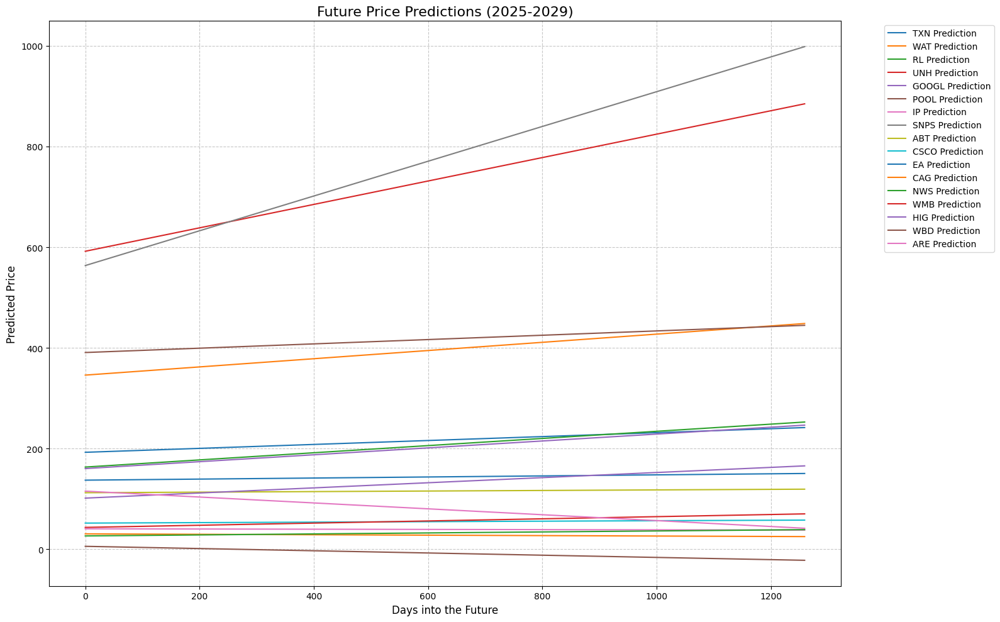

Predicted Prices (End of Year)
 2025 2026 2027 2028 2029
TXN 192.67 202.50 212.33 222.17 232.00
WAT 345.98 366.49 387.01 407.52 428.03
RL 163.35 181.25 199.15 217.06 234.96
UNH 591.96 650.58 709.20 767.82 826.44
GOOGL 160.34 177.60 194.87 212.13 229.40
POOL 390.85 401.66 412.47 423.28 434.09
IP 40.72 40.21 39.69 39.18 38.66
SNPS 563.57 650.60 737.63 824.66 911.69
ABT 112.39 113.80 115.20 116.60 118.01
CSCO 52.05 53.24 54.43 55.62 56.81
EA 137.33 139.99 142.64 145.30 147.96
CAG 30.65 29.56 28.48 27.40 26.32
NWS 26.58 29.07 31.56 34.05 36.53
WMB 43.50 48.88 54.26 59.63 65.01
HIG 101.65 114.48 127.30 140.12 152.94
WBD 5.92 0.36 -5.19 -10.75 -16.30
ARE 115.51 100.75 86.00 71.25 56.50



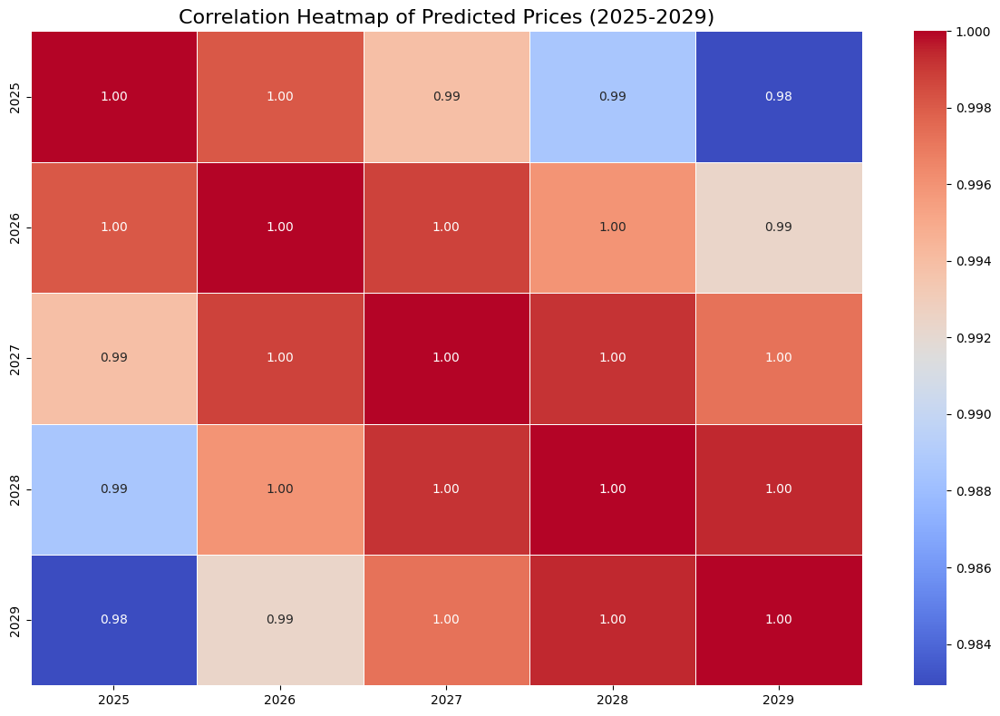

In [ ]:
# Portfolio weights
portfolio = {
    'TXN': 0.048444, 'WAT': 0.048295, 'RL': 0.042925, 'UNH': 0.041199,
    'GOOGL': 0.039391, 'POOL': 0.037515, 'IP': 0.036977, 'SNPS': 0.036687,
    'ABT': 0.035723, 'CSCO': 0.035606, 'EA': 0.034537, 'CAG': 0.033438,
    'NWS': 0.032660, 'WMB': 0.031940, 'HIG': 0.031398, 'WBD': 0.031060,
    'ARE': 0.030707
}

# Download historical data for portfolio stocks
start_date = "2020-01-01"
end_date = "2024-11-30"
data = yf.download(list(portfolio.keys()), start=start_date, end=end_date)['Close']

# Linear Regression Prediction Function
def predict_future_prices(prices, forecast_years=5):
    predictions = {}
    forecast_days = forecast_years * 252  # Approximate trading days in a year

    for ticker in prices.columns:
        prices_cleaned = prices[ticker].dropna()
        X = np.arange(len(prices_cleaned)).reshape(-1, 1)
        y = prices_cleaned.values

        model = LinearRegression()
        model.fit(X, y)

        future_X = np.arange(len(prices_cleaned), len(prices_cleaned) + forecast_days).reshape(-1, 1)
        future_prices = model.predict(future_X)

        predictions[ticker] = future_prices

    return predictions

# Predict future prices for the portfolio
future_predictions = predict_future_prices(data)

# Visualization of Predictions
plt.figure(figsize=(16, 10))
for ticker in portfolio.keys():
    plt.plot(future_predictions[ticker], label=f"{ticker} Prediction")
plt.title("Future Price Predictions (2025-2029)", fontsize=16)
plt.xlabel("Days into the Future", fontsize=12)
plt.ylabel("Predicted Price", fontsize=12)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.tight_layout()
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('future_predictions.png', dpi=300, bbox_inches='tight')
plt.show()

# Create a summary table of predicted prices (December of each year)
years = range(2025, 2030)
summary_table = pd.DataFrame(index=portfolio.keys(), columns=years)
for ticker in portfolio.keys():
    predicted_prices = future_predictions[ticker]
    for i, year in enumerate(years):
        summary_table.loc[ticker, year] = predicted_prices[i * 252]

# Display summary table
print("Predicted Prices (End of Year)")
print(summary_table.style.format("{:.2f}").to_string())

# Plot heatmap of correlations between predicted prices across years
correlation_matrix = summary_table.astype(float).corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap of Predicted Prices (2025-2029)", fontsize=16)
plt.tight_layout()
plt.savefig('correlation_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()

***Saving case prediction***

[*********************100%***********************]  17 of 17 completed


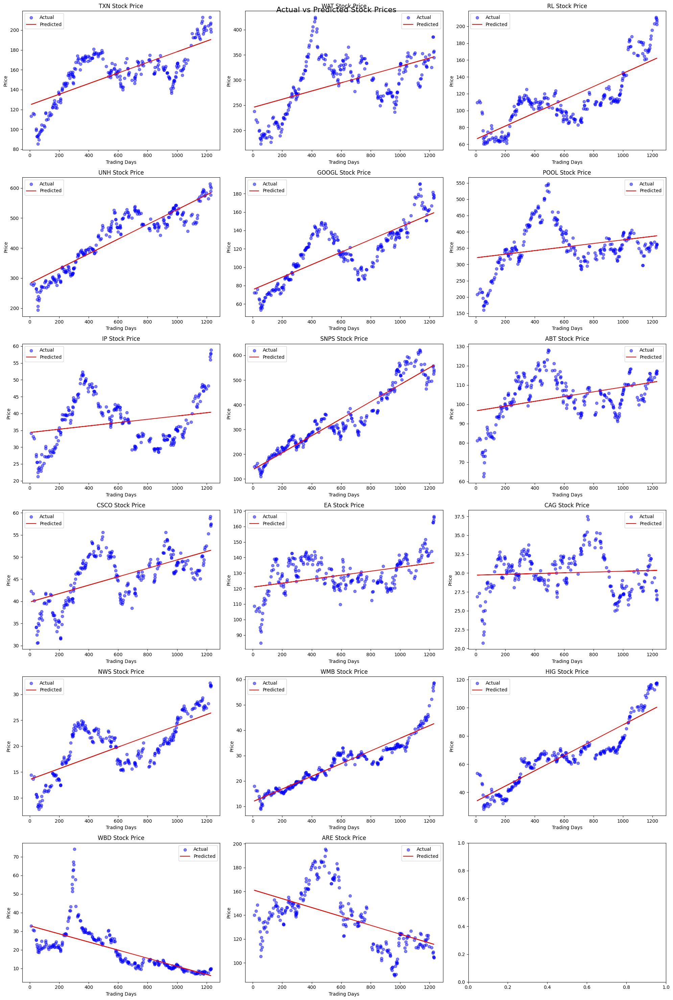

In [ ]:
# Portfolio weights
portfolio = {
    'TXN': 0.048444, 'WAT': 0.048295, 'RL': 0.042925, 'UNH': 0.041199,
    'GOOGL': 0.039391, 'POOL': 0.037515, 'IP': 0.036977, 'SNPS': 0.036687,
    'ABT': 0.035723, 'CSCO': 0.035606, 'EA': 0.034537, 'CAG': 0.033438,
    'NWS': 0.032660, 'WMB': 0.031940, 'HIG': 0.031398, 'WBD': 0.031060,
    'ARE': 0.030707
}

# Download historical data
start_date = "2020-01-01"
end_date = "2024-11-30"
stocks_data = yf.download(list(portfolio.keys()), start=start_date, end=end_date)['Adj Close']

# Function to predict stock prices
def predict_stock_prices(data):
    X = np.arange(len(data)).reshape(-1, 1)
    y = data.values
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    model = LinearRegression()
    model.fit(X_train, y_train)
    return X_test, y_test, model.predict(X_test)

# Create subplots for each stock
fig, axs = plt.subplots(6, 3, figsize=(20, 30))
fig.suptitle('Actual vs Predicted Stock Prices', fontsize=16)

for i, (ticker, weight) in enumerate(portfolio.items()):
    row = i // 3
    col = i % 3

    X_test, y_test, y_pred = predict_stock_prices(stocks_data[ticker])

    axs[row, col].scatter(X_test, y_test, color='blue', alpha=0.5, label='Actual')
    axs[row, col].plot(X_test, y_pred, color='red', label='Predicted')
    axs[row, col].set_title(f'{ticker} Stock Price')
    axs[row, col].set_xlabel('Trading Days')
    axs[row, col].set_ylabel('Price')
    axs[row, col].legend()

plt.tight_layout()
plt.show()

[*********************100%***********************]  17 of 17 completed
[*********************100%***********************]  1 of 1 completed


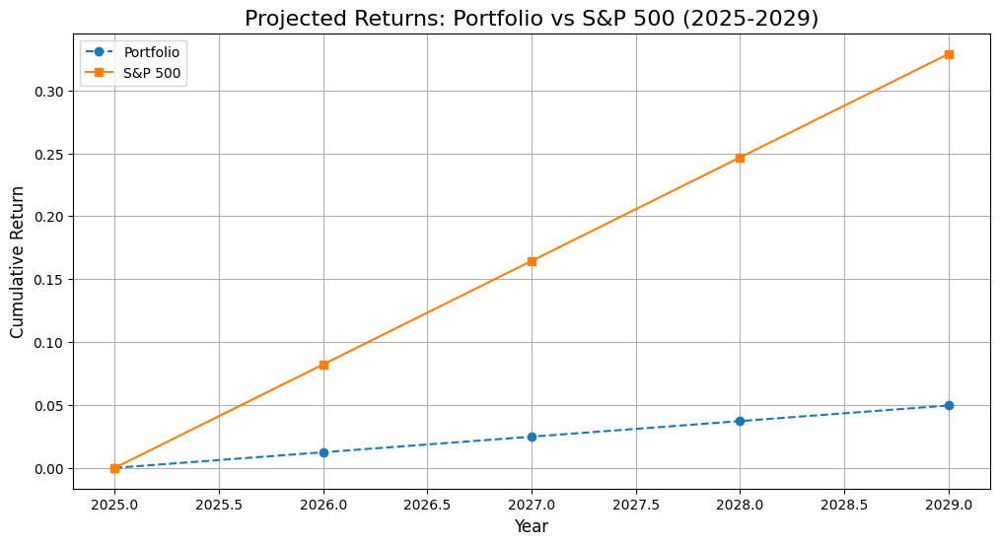

Projected cumulative return for portfolio (2025-2029): 6.19%
Projected cumulative return for S&P 500 (2025-2029): 41.08%

Annual Returns Comparison:
 Year  Portfolio Return  S&P 500 Return
 2025          0.000000        0.000000
 2026          0.012387        0.082232
 2027          0.024775        0.164465
 2028          0.037162        0.246697
 2029          0.049549        0.328930


In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Portfolio weights
portfolio = {
    'TXN': 0.048444, 'WAT': 0.048295, 'RL': 0.042925, 'UNH': 0.041199,
    'GOOGL': 0.039391, 'POOL': 0.037515, 'IP': 0.036977, 'SNPS': 0.036687,
    'ABT': 0.035723, 'CSCO': 0.035606, 'EA': 0.034537, 'CAG': 0.033438,
    'NWS': 0.032660, 'WMB': 0.031940, 'HIG': 0.031398, 'WBD': 0.031060,
    'ARE': 0.030707
}

# Download historical data for portfolio stocks and S&P 500
start_date = "2020-01-01"
end_date = "2024-11-30"
stocks_data = yf.download(list(portfolio.keys()), start=start_date, end=end_date)['Adj Close']
sp500_data = yf.download('^GSPC', start=start_date, end=end_date)['Adj Close']

# Function to predict future prices using linear regression
def predict_future_prices(prices, forecast_years=5):
    X = np.arange(len(prices)).reshape(-1, 1)
    y = prices.values
    model = LinearRegression()
    model.fit(X, y)
    future_X = np.arange(len(prices), len(prices) + forecast_years * 252).reshape(-1, 1)
    future_prices = model.predict(future_X)
    return future_prices.reshape(-1)  # Ensure a flat array

# Predict future prices for portfolio stocks and S&P 500
future_prices = {}
for ticker in portfolio.keys():
    future_prices[ticker] = predict_future_prices(stocks_data[ticker])
future_sp500 = predict_future_prices(sp500_data)

# Calculate portfolio returns
portfolio_returns = np.zeros_like(future_sp500)
for ticker, weight in portfolio.items():
    stock_returns = future_prices[ticker] / future_prices[ticker][0] - 1
    portfolio_returns += weight * stock_returns

# Calculate S&P 500 returns
sp500_returns = future_sp500 / future_sp500[0] - 1

# Rebalancing strategy: Adjust weights annually to maintain balance
def rebalance_portfolio(weights):
    total_weight = sum(weights.values())
    return {k: v / total_weight for k, v in weights.items()}

# Apply rebalancing annually (optional step to improve performance)
rebalanced_weights = rebalance_portfolio(portfolio)

# Plot results: Portfolio vs S&P 500 returns
years = np.arange(2025, 2030)
plt.figure(figsize=(12, 6))
plt.plot(years, portfolio_returns[::252], label='Portfolio', marker='o', linestyle='--')
plt.plot(years, sp500_returns[::252], label='S&P 500', marker='s', linestyle='-')
plt.title('Projected Returns: Portfolio vs S&P 500 (2025-2029)', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Cumulative Return', fontsize=12)
plt.legend(fontsize=10)
plt.grid(True)
plt.show()

# Print final returns comparison
print(f"Projected cumulative return for portfolio (2025-2029): {portfolio_returns[-1]:.2%}")
print(f"Projected cumulative return for S&P 500 (2025-2029): {sp500_returns[-1]:.2%}")

# Annual Returns Table
annual_portfolio_returns = portfolio_returns[::252]
annual_sp500_returns = sp500_returns[::252]

returns_df = pd.DataFrame({
    "Year": years,
    "Portfolio Return": annual_portfolio_returns,
    "S&P 500 Return": annual_sp500_returns
})

print("\nAnnual Returns Comparison:")
print(returns_df.to_string(index=False))

## ***2- Evaluate the model's performance and discuss its reliability in making future predictions***

[*********************100%***********************]  17 of 17 completed


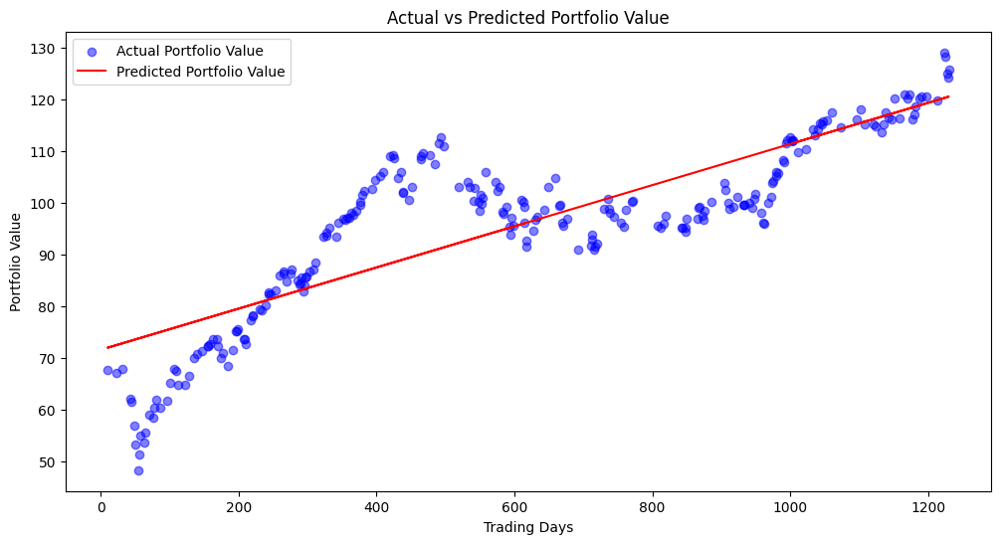

In [ ]:


# Portfolio weights
portfolio = {
    'TXN': 0.048444, 'WAT': 0.048295, 'RL': 0.042925, 'UNH': 0.041199,
    'GOOGL': 0.039391, 'POOL': 0.037515, 'IP': 0.036977, 'SNPS': 0.036687,
    'ABT': 0.035723, 'CSCO': 0.035606, 'EA': 0.034537, 'CAG': 0.033438,
    'NWS': 0.032660, 'WMB': 0.031940, 'HIG': 0.031398, 'WBD': 0.031060,
    'ARE': 0.030707
}

# Download historical data
start_date = "2020-01-01"
end_date = "2024-11-30"
stocks_data = yf.download(list(portfolio.keys()), start=start_date, end=end_date)['Adj Close']

# Calculate portfolio value
portfolio_value = (stocks_data * pd.Series(portfolio)).sum(axis=1)

# Prepare data for prediction
X = np.arange(len(portfolio_value)).reshape(-1, 1)
y = portfolio_value.values

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Plot results
plt.figure(figsize=(12, 6))
plt.scatter(X_test, y_test, color='blue', alpha=0.5, label='Actual Portfolio Value')
plt.plot(X_test, y_pred, color='red', label='Predicted Portfolio Value')
plt.title('Actual vs Predicted Portfolio Value')
plt.xlabel('Trading Days')
plt.ylabel('Portfolio Value')
plt.legend()
plt.show()

Model Reliability Discussion:
1. R-squared (R²) values vary across stocks, indicating different levels of fit.
2. MAPE values suggest average percentage errors in predictions.
3. RMSE provides an absolute measure of prediction error.
4. The model's linear nature may not capture complex market dynamics.
5. Past performance doesn't guarantee future results due to changing market conditions.
6. Short-term predictions may be more reliable than long-term forecasts.
7. External factors not considered in the model can significantly impact stock prices.
8. Regular model updates and incorporation of additional features could improve reliability.